In [1]:
%load_ext autoreload 
%autoreload 2
import cv2
import json, os, cv2
from pathlib import Path
import pandas as pd 
import matplotlib.pyplot as plt 
import numpy as np
import xarray as xr
import seaborn as sns
import h5py as hf
from tqdm import tqdm
import itertools 
from scipy.interpolate import interp1d
from scipy.interpolate import splev, splrep
from scipy import signal
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.cluster import KMeans
import matplotlib.colors as mcolors
import os, fnmatch
from scipy.spatial.distance import cdist
from scipy.ndimage import gaussian_filter1d
from scipy.stats import linregress
import ast

import sys
sys.path.insert(0, 'C:/Users/nlab/Documents/GitHub/obstacle_avoidance')
#sys.path.append(r'C:\Users\nlab\Documents\GitHub\obstacle_avoidance\plots') # go to parent dir 

from utils.base_functions import *

from streamline_clustering.clustering import *
from src.utils.auxiliary import flatten_series
from src.utils.path import find
from src.base import BaseInput
from plots.plots import plot_oa
from plots.plots2 import *
#from plots.plots import *
import warnings
warnings.filterwarnings('ignore')
from dipy.segment.clustering import QuickBundles

from utils.base_functions import *

<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [740]:
from dipy.segment.clustering import QuickBundles
from dipy.segment.metric import *


In [2]:
oa_session = plot_oa(r"D:\obstacle_avoidance\metadata\compiled_data\G8CK1_G8CK_light.json",'blank')
oa_session.gather_session_df('obstacle',6)
oa_df = oa_session.df

6


In [3]:
dark_oa_session = plot_oa(r"D:\obstacle_avoidance\metadata\compiled_data\G8CK1_G8CK_dark.json",'blank')
dark_oa_session.gather_session_df('obstacle',6)
dark_oa_df = dark_oa_session.df

6


In [1544]:
con_session = plot_oa(r"D:\obstacle_avoidance\metadata\compiled_data\G8CK1_G8CK_oa_09_08_07.json",'blank')
con_session.gather_session_df('obstacle',6)
con_df = con_session.df

6


In [1756]:
calculate_relative_distance_goal_ts(oa_df)

calculate_relative_distance_goal(oa_df)

calculate_relative_distance(oa_df)

ts_calculate_relative_distance(oa_df)

angle_to_open_corner(oa_df)

ts_angle_to_open_corner(oa_df)

angle_to_target_port(oa_df)

ts_angle_to_target_port(oa_df)

zero_out_angle(oa_df)

zero_out_angle_target_port(oa_df)

df_tortuosity(oa_df)

lateral_error_open_corner(oa_df)

find_consective_trials(oa_df)

calculate_speed(oa_df)

head_body_angle(oa_df)

deveation(oa_df)

goal_and_obstacle_tortuosity(oa_df)

In [1757]:
calculate_relative_distance_goal_ts(dark_oa_df)

calculate_relative_distance_goal(dark_oa_df)

calculate_relative_distance(dark_oa_df)

ts_calculate_relative_distance(dark_oa_df)

angle_to_open_corner(dark_oa_df)

ts_angle_to_open_corner(dark_oa_df)

angle_to_target_port(dark_oa_df)

ts_angle_to_target_port(dark_oa_df)

zero_out_angle(dark_oa_df)

zero_out_angle_target_port(dark_oa_df)

df_tortuosity(dark_oa_df)

lateral_error_open_corner(dark_oa_df)

find_consective_trials(dark_oa_df)

calculate_speed(dark_oa_df)

head_body_angle(dark_oa_df)
deveation(dark_oa_df)
goal_and_obstacle_tortuosity(dark_oa_df)

In [1546]:
calculate_relative_distance_goal_ts(con_df)

calculate_relative_distance_goal(con_df)

calculate_relative_distance(con_df)

ts_calculate_relative_distance(con_df)

angle_to_open_corner(con_df)

ts_angle_to_open_corner(con_df)

angle_to_target_port(con_df)

ts_angle_to_target_port(con_df)

zero_out_angle(con_df)

zero_out_angle_target_port(con_df)

df_tortuosity(con_df)

lateral_error_open_corner(con_df)

find_consective_trials(con_df)

calculate_speed(con_df)

head_body_angle(con_df)
deveation(con_df)
goal_and_obstacle_tortuosity(con_df)

In [1548]:
condition_dict = {'blackblack': ['black','black'], 'whiteblack': ['white','black'],'whitenoise':['white','noise'],
                  'blackwhite':['black','white'], 'noisewhite':['noise','white'], 'noisenoise':['noise','noise'],
                  'blacknoise':['black','noise'], 'whitewhite':['white','white'],'whtewhite':['white','white'],'noiseblack':['noise','black']}

for ind, row in con_df.iterrows():
    for key in condition_dict.keys():
        if key == row.condition:
            con_df.at[ind,'wall'] = condition_dict.get(key)[0]
            con_df.at[ind,'obstacle'] = condition_dict.get(key)[1]

In [1746]:
def save_dataframe_to_hdf(dataframe, directory, filename):
    """
    Save a Pandas DataFrame to an HDF5 file in the specified directory.

    Parameters:
    dataframe (pandas.DataFrame): The DataFrame to be saved.
    directory (str): The directory where the HDF5 file will be saved.
    filename (str): The name of the HDF5 file.

    Returns:
    str: The full path of the saved HDF5 file.
    """
    # Ensure the directory exists, create it if it doesn't
    if not os.path.exists(directory):
        os.makedirs(directory)

    # Concatenate directory and filename to get the full path
    full_path = os.path.join(directory, filename)

    # Save the DataFrame to HDF5 file
    dataframe.to_hdf(full_path, key='data', mode='w')

    return full_path

In [1749]:
dark_oa_df

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,goal_basis_start_x,goal_basis_start_y,goal_basis_end_x,goal_basis_end_y,obstacle_devations,goal_devations,ob_tortuosity,ob_linearity,go_tortuosity,go_linearity
0,0,0,64915.523148,64918.775347,"[64915.528115, 64915.544896, 64915.561536, 649...","[540, 541, 542, 543, 544, 545, 546, 547, 548, ...","[93.8053970336914, 92.92668151855469, 92.60152...","[262.5429382324219, 263.65594482421875, 263.42...","[112.91676330566406, 111.78739166259766, 111.2...","[257.9234619140625, 258.3965759277344, 257.921...",...,21.238982,18.348766,50.459529,20.894197,"[nan, 71.52769067040717, 76.55376149496644, 79...","[nan, 70.40388409835329, 60.52740183153384, 54...",2.560828,0.390499,1.300080,0.769183
1,1,1,64918.775347,64921.798566,"[64918.778969, 64918.796723, 64918.812556, 649...","[[735, 736, 737, 738, 739, 740, 741, 742, 743,...","[676.229248046875, 678.3688354492188, 678.5172...","[280.1986389160156, 279.34014892578125, 279.42...","[667.1575927734375, 669.3810424804688, 668.289...","[275.3477783203125, 272.519775390625, 273.3495...",...,25.885436,20.218940,7.111541,19.574711,"[nan, 49.734897882327516, 33.77940262463843, 3...","[nan, 52.77582897687816, 53.32785823869204, 46...",1.120932,0.892115,1.653857,0.604647
2,2,2,64921.798566,64925.165734,"[64921.813696, 64921.83118, 64921.847052, 6492...","[917, 918, 919, 920, 921, 922, 923, 924, 925, ...","[95.15409851074219, 94.2234115600586, 94.51425...","[262.2293701171875, 263.2197265625, 264.313385...","[113.92466735839844, 112.84644317626953, 112.7...","[257.9330749511719, 258.80914306640625, 258.93...",...,21.419327,18.061779,50.882333,20.842746,"[nan, 111.77369005216894, 110.26860754895682, ...","[nan, 54.754417034883474, 43.569119349519696, ...",2.004836,0.498794,1.470947,0.679834
3,3,4,64929.479206,64932.383590,"[64929.48288, 64929.49966, 64929.517132, 64929...","[1377, 1378, 1379, 1380, 1381, 1382, 1383, 138...","[94.98332214355469, 93.73847198486328, 93.1007...","[262.4388427734375, 262.70660400390625, 262.69...","[113.64474487304688, 113.05989074707031, 112.1...","[256.3793029785156, 257.34747314453125, 257.83...",...,21.889628,12.152082,50.466894,20.541485,"[nan, 16.26598346003609, 8.543608847068386, 11...","[nan, 9.080044028942213, 7.934229108220891, 8....",1.013504,0.986675,1.461965,0.684011
4,4,6,64935.836697,64938.609971,"[64935.851635, 64935.869478, 64935.885107, 649...","[1759, 1760, 1761, 1762, 1763, 1764, 1765, 176...","[94.91559600830078, 95.0887680053711, 93.86167...","[263.7718505859375, 262.8562316894531, 264.323...","[115.93388366699219, 114.1135025024414, 113.45...","[256.3660888671875, 257.00177001953125, 257.76...",...,32.663679,11.311715,50.636549,20.719006,"[nan, 0.11346564954900971, 1.6451903149424119,...","[nan, 66.12953650179767, 51.65020638430119, 47...",1.391605,0.718595,1.072992,0.931973
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3491,103,118,57373.622361,57375.891724,"[57373.638553, 57373.655552, 57373.671974, 573...","[[23592, 23593, 23594, 23595, 23596, 23597, 23...","[674.3579711914062, 674.6685180664062, 674.885...","[265.2582092285156, 265.7662353515625, 265.428...","[661.851318359375, 662.6461791992188, 662.7941...","[254.9436798095703, 255.2102508544922, 255.170...",...,23.591344,11.642672,6.419999,19.174648,"[nan, 14.497970141122778, 15.69795837355176, 1...","[nan, 2.570282469463491, 7.167502165054785, 8....",1.012987,0.987179,1.088174,0.918970
3492,104,119,57375.891724,57379.136204,"[57375.906022, 57375.923891, 57375.939724, 573...","[23728, 23729, 23730, 23731, 23732, 23733, 237...","[86.62127685546875, 88.42916870117188, 89.5463...","[258.9886169433594, 260.9349060058594, 261.854...","[100.5374755859375, 101.40650939941406, 102.34...","[259.17144775390625, 258.7930603027344, 257.95...",...,21.411219,16.775230,49.913734,19.526056,"[nan, 63.62087055253557, 57.72115354471867, 61...","[nan, 40.1948980939336

In [1815]:
save_dataframe_to_hdf(oa_df,r"D:\obstacle_avoidance\recordings\data_h5",'oa_df_04142024.h5')
save_dataframe_to_hdf(dark_oa_df,r"D:\obstacle_avoidance\recordings\data_h5",'dark_oa_df_04142024.h5')

'D:\\obstacle_avoidance\\recordings\\data_h5\\dark_oa_df_04142024.h5'

In [1750]:
save_dataframe_to_hdf(dark_oa_df,r"D:\obstacle_avoidance\recordings\data_h5",'dark_oa_df_04142024.h5')

'D:\\obstacle_avoidance\\recordings\\data_h5\\dark_oa_df_04142024.h5'

In [1396]:
def create_consective_df_new(df):
        """get df from data of groups of 3 trials that are consecutive """
        con_df = pd.DataFrame()
        copy = df.copy(deep=True)
        copy = copy.reset_index(drop=True)
        for animal,animal_frame in copy.groupby('animal'):
            for date, date_frame in animal_frame.groupby('date'):
                repeats_list = find_consecutive_repeats(date_frame['obstacle_cluster'])
                for i in range(len(repeats_list)):
                    check = date_frame.loc[repeats_list[i][0]:repeats_list[i][1]]
                    #print(np.diff(check['index'].to_numpy()).sum())
                    if np.diff(check['index'].to_numpy()).sum()==2:
                        trial_df = pd.DataFrame()
                        trial_df = trial_df.append(date_frame.loc[repeats_list[i][0]:repeats_list[i][1]])
                        trial_df['consective_inds'] = str(list(range(repeats_list[i][0], repeats_list[i][1]+1)))
                        trial_df['consective_num'] = [0,1,2]

                        con_df = con_df.append(trial_df) 
                    else:
                        continue
                       
        return con_df

In [1395]:
def distance_to_edge_vector(df):
    distance_vec = []
    for ind,row in df.iterrows():
        try:
            obstacle_distances = row['ts_distance_from_edge'][:int(row['obstacle_ind'])].astype(float)
            distance_vec.append(obstacle_distances)
        except ValueError:
            continue
    return np.concatenate(distance_vec).ravel()

def variable_obstacle_vector(df,var):
    var_vec = []
    for ind,row in df.iterrows():
        try:
            obstacle_distances = row[var][:int(row['obstacle_ind'])].astype(float)
            var_vec.append(obstacle_distances)
        except (ValueError,TypeError)as e:
            continue
    return np.concatenate(var_vec).ravel()

In [1626]:
G8CK1_late = [ '072323','072623', '072823']

G8CK_late = [ '072323','072623', '072823']

array(['042823', '043023', '050123', '050223', '050323', '050423',
       '050523', '050923', '051023', '051723', '051823', '051923',
       '052223', '052323', '052523', '052623', '061323', '061423',
       '072623', '072823'], dtype=object)

In [1758]:
G8CK = [i for i in oa_df.animal.unique().tolist() if '1' not in i]
G8CK1 = [i for i in oa_df.animal.unique().tolist() if '1'  in i]

G8CK_naive = ['042823','043023','050123']


G8CK_early = [ '050223','050323','050423']

G8CK_middle = ['050523','050923','051023']

G8CK_late = [ '072323','072623', '072823']

G8CK1_naive = ['051723','051823','051923']

G8CK1_early = ['052223', '052323','052523']

G8CK1_middle = ['052623','061323', '061423']

G8CK1_late = [ '072323','072623', '072823']

df = oa_df

for ind, row in df.iterrows():
    if row.animal in G8CK:
        if row.date in G8CK_naive:
            df.at[ind,'skill'] = 'naive'
        if row.date in G8CK_early:
            df.at[ind,'skill'] = 'early'
        if row.date in G8CK_middle:
            df.at[ind,'skill'] = 'middle'
        if row.date in G8CK_late:
            df.at[ind,'skill'] = 'late'

            
    elif row.animal in G8CK1:
        if row.date in G8CK1_naive:
            df.at[ind,'skill'] = 'naive'
        if row.date in G8CK1_early:
            df.at[ind,'skill'] = 'early'
        if row.date in G8CK1_middle:
            df.at[ind,'skill'] = 'middle'
        if row.date in G8CK1_late:
            df.at[ind,'skill'] = 'late'




In [ ]:
save_dataframe_to_hdf(oa_df,r"D:\obstacle_avoidance\recordings\data_h5",'oa_df_04142024.h5')
save_dataframe_to_hdf(dark_oa_df,r"D:\obstacle_avoidance\recordings\data_h5",'dark_oa_df_04142024.h5')

In [ ]:
con_long,con_short,con_middle = create_df_by_type(con_df)

In [1759]:
ns_oa_long,ns_oa_short,ns_oa_middle = create_df_by_type_nostart(oa_df)
ns_dark_long,ns_dark_short,ns_dark_middle =create_df_by_type_nostart(dark_oa_df)
ns_con_long,ns_con_short,ns_con_middle = create_df_by_type_nostart(con_df)

oa_long,oa_short,oa_middle = create_df_by_type(oa_df)
dark_long,dark_short,dark_middle =create_df_by_type(dark_oa_df)
con_long,con_short,con_middle = create_df_by_type(con_df)

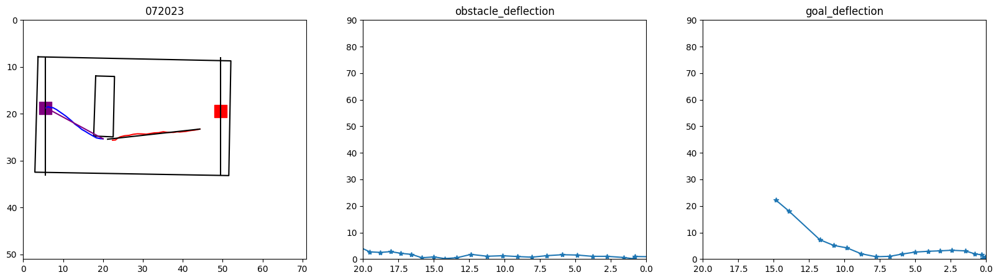

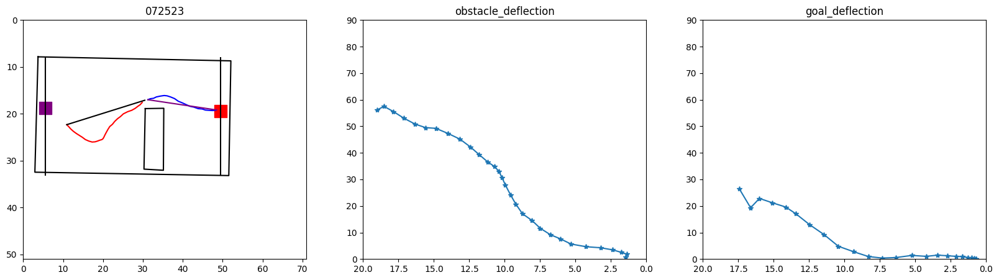

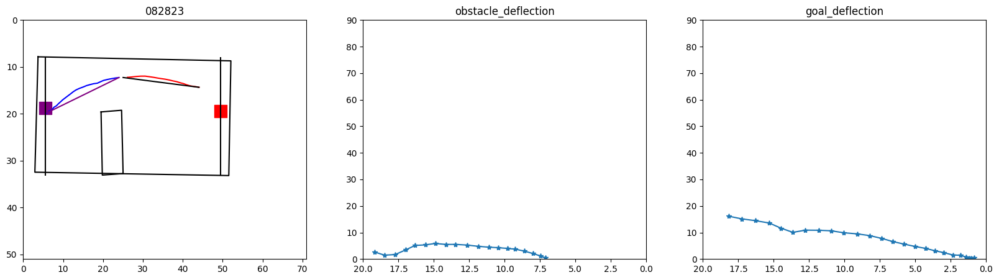

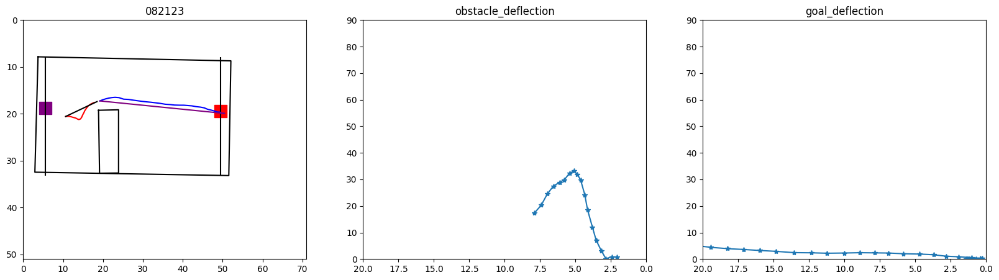

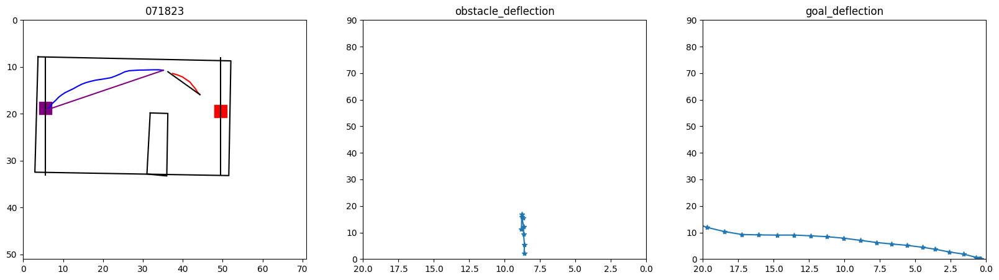

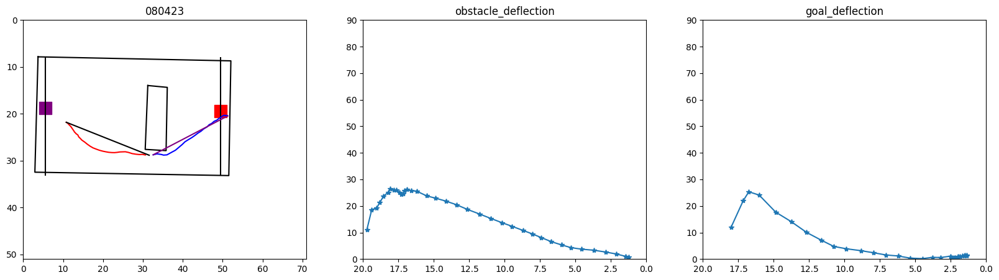

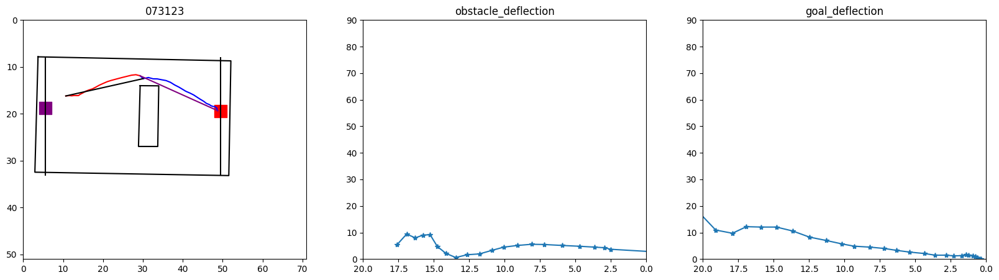

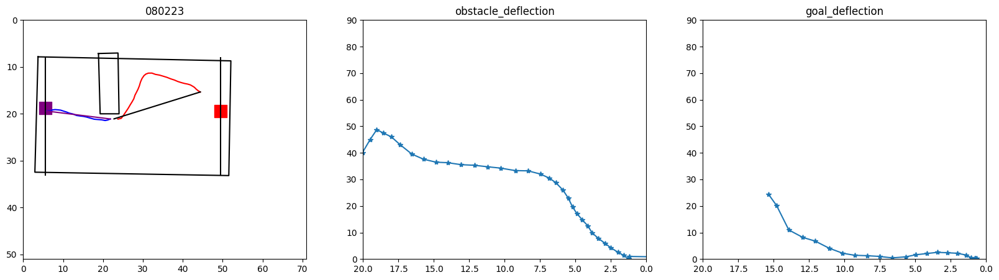

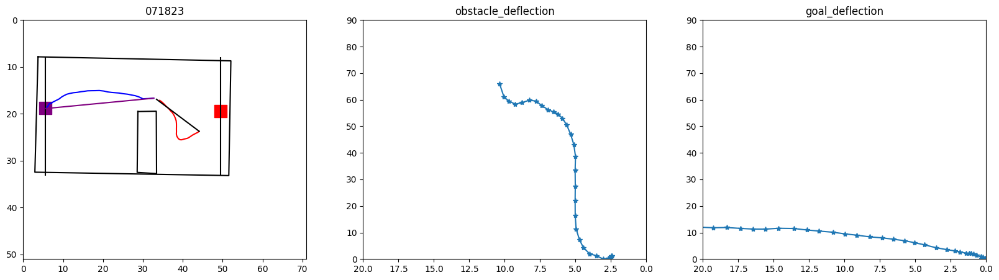

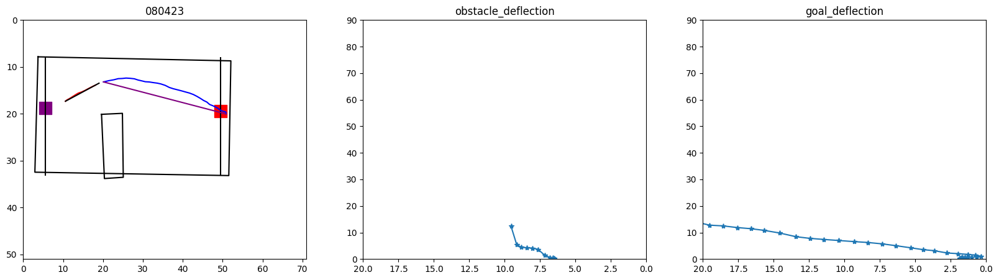

In [1760]:
test_dark = con_df.sample(10)
for ind,row in test_dark.iterrows():
    fig,ax = plt.subplots(1,3,figsize=(20,5))
    trial_df = test_dark.loc[[ind]]
    plot_arena_single(trial_df,ax[0])
    plot_orginal_obstacle(trial_df,ax[0],int(row.obstacle_cluster))



    #ax[0].set_title()
    ax[0].set_title(row.date)
    ax[1].set_title('obstacle_deflection')
    ax[2].set_title('goal_deflection')

    obstacle_ind = int(row.obstacle_ind)
    goal_ind = int(row.goal_ind)
    ax[0].plot(row.goal_nose_x,row.goal_nose_y,color = 'blue')
    ax[0].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'red')

    obstacle_basis_start_x, obstacle_basis_start_y = row.ts_nose_x_cm[0],row.ts_nose_y_cm[0]
    obstacle_basis_end_x, obstacle_basis_end_y = row.ts_nose_x_cm[obstacle_ind],row.ts_nose_y_cm[obstacle_ind]
    obstacle_basis_vector = calculate_vector_between_points((obstacle_basis_start_x,obstacle_basis_start_y),(obstacle_basis_end_x,obstacle_basis_end_y))
    obstacle_nose_x,obstacle_nose_y = row.ts_nose_x_cm[:obstacle_ind],row.ts_nose_y_cm[:obstacle_ind]
    ax[0].plot((row.obstacle_basis_start_x,row.obstacle_basis_end_x),(row.obstacle_basis_start_y,row.obstacle_basis_end_y), c = 'black')

    goal_basis_start_x, goal_basis_start_y = row.ts_nose_x_cm[goal_ind],row.ts_nose_y_cm[goal_ind]
    goal_basis_end_x, goal_basis_end_y = row.ts_nose_x_cm[-1],row.ts_nose_y_cm[-1]
    goal_basis_vector = calculate_vector_between_points((goal_basis_start_x,goal_basis_start_y),(goal_basis_end_x,goal_basis_end_y))
    goal_nose_x,goal_nose_y = row.ts_nose_x_cm[goal_ind:],row.ts_nose_y_cm[goal_ind:]
    ax[0].plot((row.goal_basis_start_x,row.goal_basis_end_x),(row.goal_basis_start_y,row.goal_basis_end_y), c = 'purple')

    
    obstacle_devations = []
    for i in list(range(len(obstacle_nose_x))):
        obstacle_nose_vector = calculate_vector_between_points((obstacle_basis_start_x,obstacle_basis_start_y),(obstacle_nose_x[i],obstacle_nose_y[i]))
        _,dev = angle_between_vectors(obstacle_nose_vector,obstacle_basis_vector)
        #devations.append(dev) 
        #dev = calculate_angle((nose_x[i],nose_y[i]),(origin_x,origin_y),(end_x,end_y))
        obstacle_devations.append(dev)
    ax[1].plot(row.ts_distance_from_edge[:obstacle_ind],obstacle_devations,'-*')
    ax[1].set_xlim(0,20)
    ax[1].invert_xaxis()
    ax[1].set_ylim(0,90)
    


    goal_devations = []
    for i in list(range(len(goal_nose_x))):
        goal_nose_vector = calculate_vector_between_points((goal_basis_start_x,goal_basis_start_y),(goal_nose_x[i],goal_nose_y[i]))
        _,dev = angle_between_vectors(goal_nose_vector,goal_basis_vector)
        #devations.append(dev) 
        #dev = calculate_angle((nose_x[i],nose_y[i]),(origin_x,origin_y),(end_x,end_y))
        goal_devations.append(dev)
    ax[2].plot(row.ts_distance_from_target_port[goal_ind:],goal_devations,'-*')
    ax[2].set_xlim(0,20)
    ax[2].invert_xaxis()
    ax[2].set_ylim(0,90)

In [1608]:
con_long.date.unique()

array(['090523', '090423', '090123', '083023', '082923', '082823',
       '082723', '082423', '082323', '082123', '082023', '081623',
       '071523', '071623', '071723', '071823', '071923', '072023',
       '072123', '072323', '072523', '072623', '072823', '073123',
       '080123', '080223', '080423', '080923', '081023', '081123',
       '081523'], dtype=object)

In [1557]:
con_long[con_long['date'].str.contains('07', regex=False)].date.unique()

array(['071523', '071623', '071723', '071823', '071923', '072023',
       '072123', '072323', '072523', '072623', '072823', '073123'],
      dtype=object)

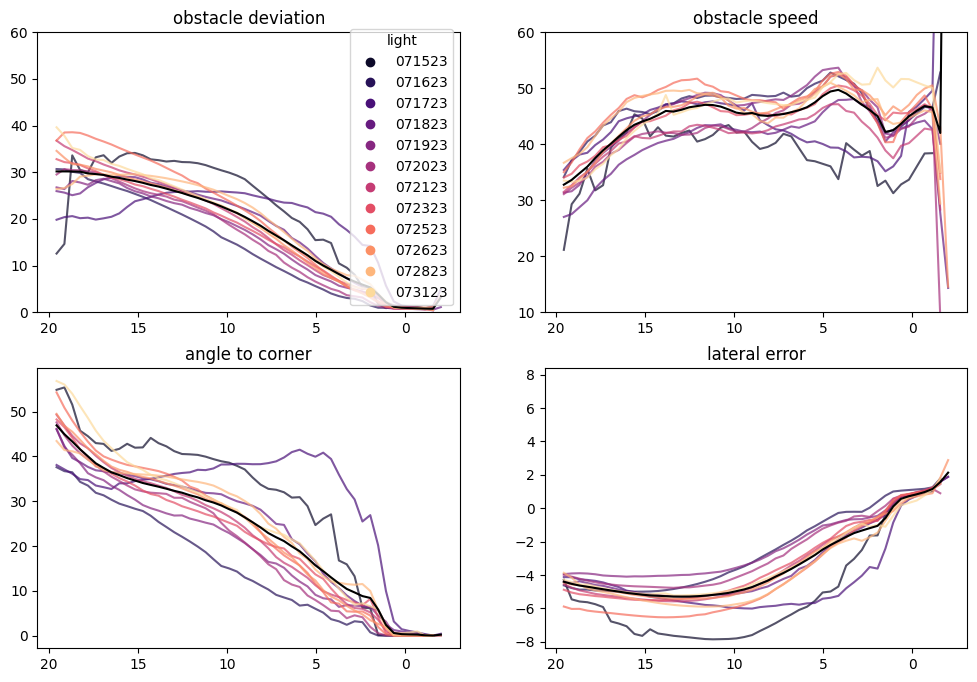

In [1558]:
#data = pd.concat([dark_long,dark_short])
data =con_long[con_long['date'].str.contains('07', regex=False)]

data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
#oa_long[oa_long['animal']!=[i for i in oa_long.animal.unique().tolist() if '1' not in i]]
xnew =  np.arange(-2, 20, .44)
fig,ax = plt.subplots(2,2,figsize=(12,8))
color_map = create_color_dict(data,'date','magma',sort=True)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_map.values()]
ax[0,0].set_title('obstacle deviation')
ax[0,0].invert_xaxis()
ax[0,0].set_ylim(0,60)
ax[0,0].legend(markers, color_map.keys(), numpoints=1,title = 'light')

ax[0,1].set_title('obstacle speed')
ax[0,1].invert_xaxis()
ax[0,1].set_ylim(10,60)


ax[1,0].set_title('angle to corner')
ax[1,0].invert_xaxis()
ax[1,1].set_title('lateral error')
ax[1,1].invert_xaxis()






by_date = data.groupby(['date'])
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    dev_array = np.empty([rows,50])
    dev_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        dev_array[i] = ynew

    date_dev = np.nanmean(dev_array,axis = 0)
    ax[0,0].plot(xnew,date_dev,c = color,alpha = .7)

rows = data.shape[0]
dev_array = np.empty([rows,50])
dev_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    dev_array[i] = ynew

all_dev = np.nanmean(dev_array,axis = 0)
ax[0,0].plot(xnew,all_dev,c = 'black')
std_error_dev = np.nanstd(all_dev,axis=0)
#ax[0,0].fill_between(xnew, 
#all_dev-std_error_dev, 
#all_dev+std_error_dev, 
#facecolor='blue', alpha=0.5)


for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    speed_array = np.empty([rows,50])
    speed_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        speed_array[i] = ynew

    date_speed = np.nanmean(speed_array,axis = 0)
    ax[0,1].plot(xnew,date_speed,c = color,alpha = .7)

rows = data.shape[0]
speed_array = np.empty([rows,50])
speed_array[:] =np.nan 
for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    speed_array[i] = ynew
all_speed = np.nanmean(speed_array,axis = 0)
ax[0,1].plot(xnew,all_speed,c = 'black')

for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,0].plot(xnew,date_angle,c = color,alpha = .7)

rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    angle_array[i] = ynew
all_angle = np.nanmean(angle_array,axis = 0)
ax[1,0].plot(xnew,all_angle,c = 'black')
#goal 
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,1].plot(xnew,date_angle,c = color,alpha = .7)

rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    angle_array[i] = ynew
all_angle = np.nanmean(angle_array,axis = 0)
ax[1,1].plot(xnew,all_angle,c = 'black')
symmetrize_y_axis(ax[1,1])

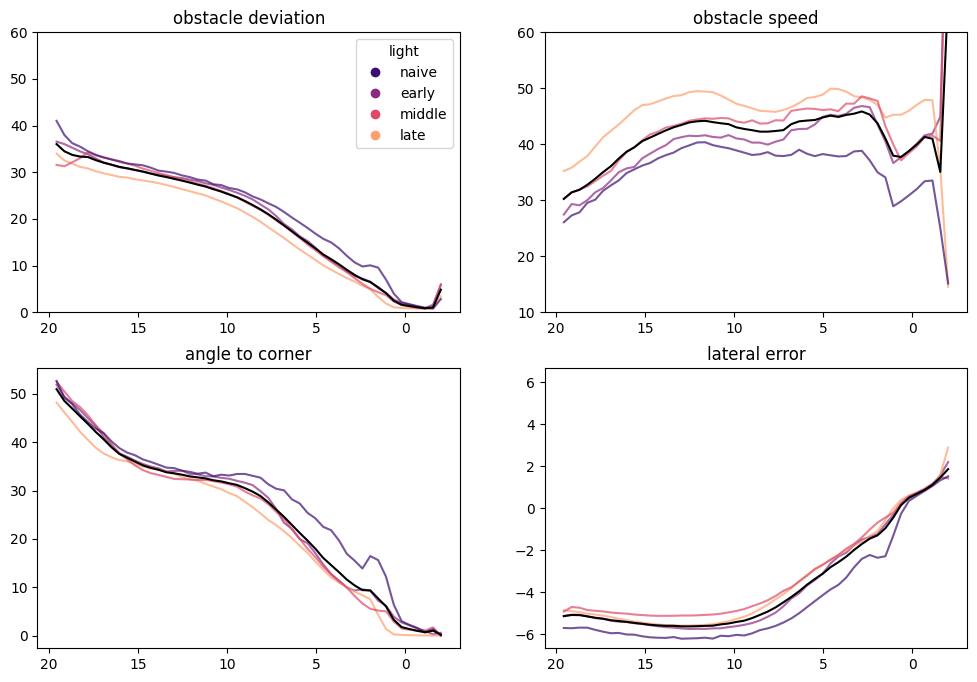

In [1814]:
#data = pd.concat([dark_long,dark_short])
data =oa_long

data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'skill')
#oa_long[oa_long['animal']!=[i for i in oa_long.animal.unique().tolist() if '1' not in i]]
xnew =  np.arange(-2, 20, .44)
fig,ax = plt.subplots(2,2,figsize=(12,8))
color_map = create_color_dict(data,'skill','magma',sort=False)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_map.values()]
ax[0,0].set_title('obstacle deviation')
ax[0,0].invert_xaxis()
ax[0,0].set_ylim(0,60)
ax[0,0].legend(markers, color_map.keys(), numpoints=1,title = 'light')

ax[0,1].set_title('obstacle speed')
ax[0,1].invert_xaxis()
ax[0,1].set_ylim(10,60)


ax[1,0].set_title('angle to corner')
ax[1,0].invert_xaxis()
ax[1,1].set_title('lateral error')
ax[1,1].invert_xaxis()






by_date = data.groupby(['skill'])
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    dev_array = np.empty([rows,50])
    dev_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        dev_array[i] = ynew

    date_dev = np.nanmean(dev_array,axis = 0)
    ax[0,0].plot(xnew,date_dev,c = color,alpha = .7)

rows = data.shape[0]
dev_array = np.empty([rows,50])
dev_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    dev_array[i] = ynew

all_dev = np.nanmean(dev_array,axis = 0)
ax[0,0].plot(xnew,all_dev,c = 'black')
std_error_dev = np.nanstd(all_dev,axis=0)
#ax[0,0].fill_between(xnew, 
#all_dev-std_error_dev, 
#all_dev+std_error_dev, 
#facecolor='blue', alpha=0.5)


for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    speed_array = np.empty([rows,50])
    speed_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        speed_array[i] = ynew

    date_speed = np.nanmean(speed_array,axis = 0)
    ax[0,1].plot(xnew,date_speed,c = color,alpha = .7)

rows = data.shape[0]
speed_array = np.empty([rows,50])
speed_array[:] =np.nan 
for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    speed_array[i] = ynew
all_speed = np.nanmean(speed_array,axis = 0)
ax[0,1].plot(xnew,all_speed,c = 'black')

for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,0].plot(xnew,date_angle,c = color,alpha = .7)

rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    angle_array[i] = ynew
all_angle = np.nanmean(angle_array,axis = 0)
ax[1,0].plot(xnew,all_angle,c = 'black')
#goal 
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,1].plot(xnew,date_angle,c = color,alpha = .7)

rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    angle_array[i] = ynew
all_angle = np.nanmean(angle_array,axis = 0)
ax[1,1].plot(xnew,all_angle,c = 'black')
symmetrize_y_axis(ax[1,1])

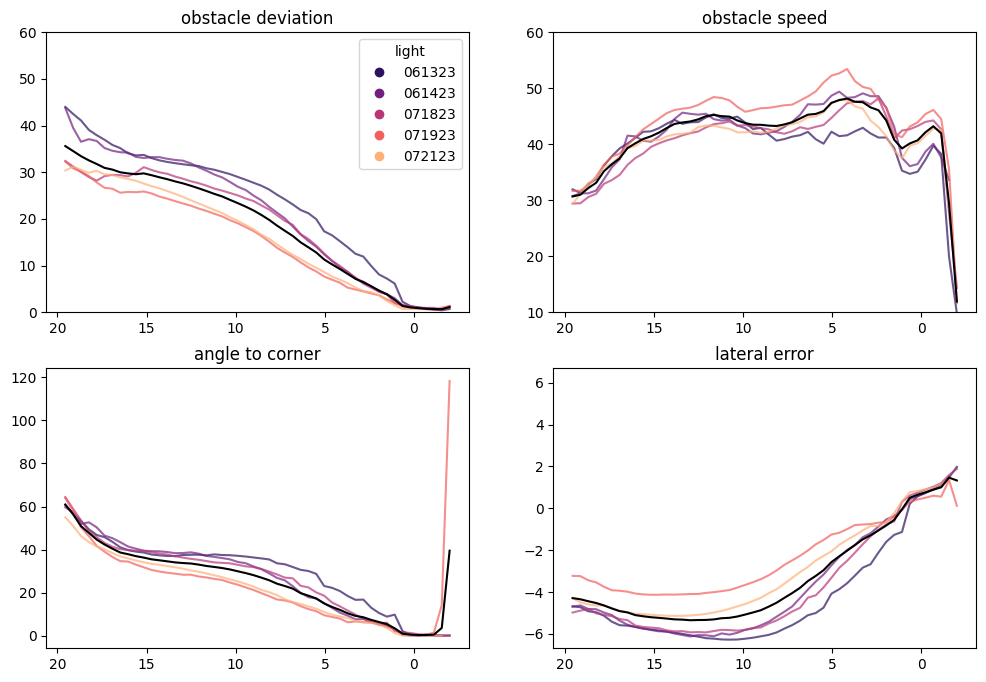

In [124]:
#data = pd.concat([dark_long,dark_short])
data =oa_long[oa_long['skill']=='late']

data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
#oa_long[oa_long['animal']!=[i for i in oa_long.animal.unique().tolist() if '1' not in i]]
xnew =  np.arange(-2, 20, .44)
fig,ax = plt.subplots(2,2,figsize=(12,8))
color_map = create_color_dict(data,'date','magma',sort=False)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_map.values()]
ax[0,0].set_title('obstacle deviation')
ax[0,0].invert_xaxis()
ax[0,0].set_ylim(0,60)
ax[0,0].legend(markers, color_map.keys(), numpoints=1,title = 'light')

ax[0,1].set_title('obstacle speed')
ax[0,1].invert_xaxis()
ax[0,1].set_ylim(10,60)


ax[1,0].set_title('angle to corner')
ax[1,0].invert_xaxis()
ax[1,1].set_title('lateral error')
ax[1,1].invert_xaxis()






by_date = data.groupby(['date'])
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    dev_array = np.empty([rows,50])
    dev_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        dev_array[i] = ynew

    date_dev = np.nanmean(dev_array,axis = 0)
    ax[0,0].plot(xnew,date_dev,c = color,alpha = .7)

rows = data.shape[0]
dev_array = np.empty([rows,50])
dev_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    dev_array[i] = ynew

all_dev = np.nanmean(dev_array,axis = 0)
ax[0,0].plot(xnew,all_dev,c = 'black')
std_error_dev = np.nanstd(all_dev,axis=0)
#ax[0,0].fill_between(xnew, 
#all_dev-std_error_dev, 
#all_dev+std_error_dev, 
#facecolor='blue', alpha=0.5)


for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    speed_array = np.empty([rows,50])
    speed_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        speed_array[i] = ynew

    date_speed = np.nanmean(speed_array,axis = 0)
    ax[0,1].plot(xnew,date_speed,c = color,alpha = .7)

rows = data.shape[0]
speed_array = np.empty([rows,50])
speed_array[:] =np.nan 
for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    speed_array[i] = ynew
all_speed = np.nanmean(speed_array,axis = 0)
ax[0,1].plot(xnew,all_speed,c = 'black')

for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,0].plot(xnew,date_angle,c = color,alpha = .7)

rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    angle_array[i] = ynew
all_angle = np.nanmean(angle_array,axis = 0)
ax[1,0].plot(xnew,all_angle,c = 'black')
#goal 
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,1].plot(xnew,date_angle,c = color,alpha = .7)

rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    angle_array[i] = ynew
all_angle = np.nanmean(angle_array,axis = 0)
ax[1,1].plot(xnew,all_angle,c = 'black')
symmetrize_y_axis(ax[1,1])

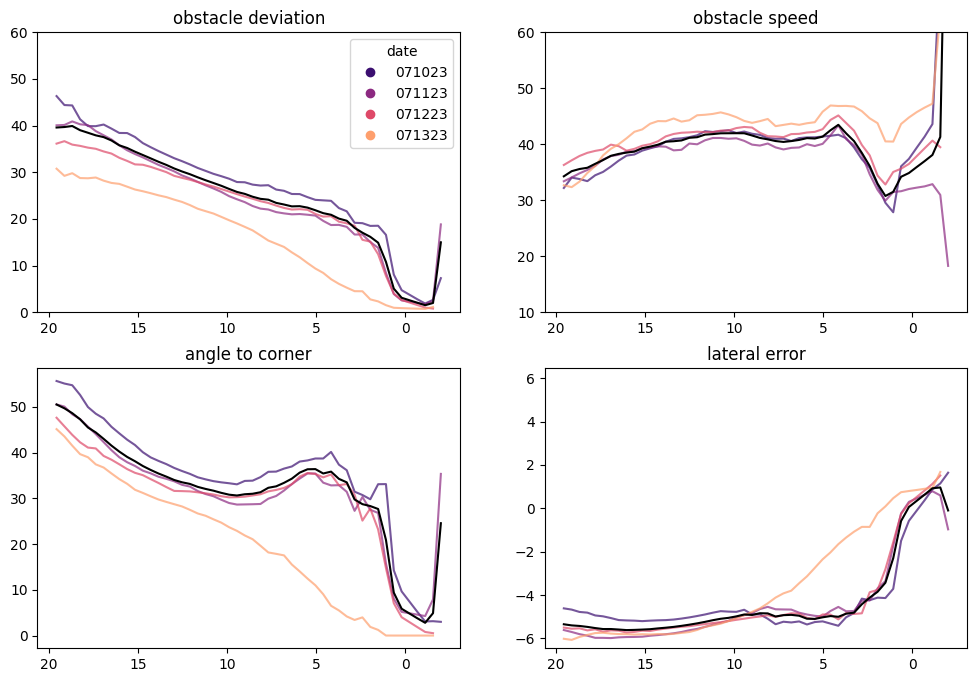

In [1838]:
#data = pd.concat([dark_long,dark_short])
data =dark_long
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')

#data = drop_nans_in_columns(data,'skill')
#oa_long[oa_long['animal']!=[i for i in oa_long.animal.unique().tolist() if '1' not in i]]
xnew =  np.arange(-2, 20, .44)
fig,ax = plt.subplots(2,2,figsize=(12,8))
color_map = create_color_dict(data,'date','magma',sort=True)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_map.values()]
ax[0,0].set_title('obstacle deviation')
ax[0,0].invert_xaxis()
ax[0,0].set_ylim(0,60)
ax[0,0].legend(markers, color_map.keys(), numpoints=1,title = 'date')

ax[0,1].set_title('obstacle speed')
ax[0,1].invert_xaxis()
ax[0,1].set_ylim(10,60)


ax[1,0].set_title('angle to corner')
ax[1,0].invert_xaxis()
ax[1,1].set_title('lateral error')
ax[1,1].invert_xaxis()





by_date = data.groupby(['date'])
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    dev_array = np.empty([rows,50])
    dev_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        dev_array[i] = ynew

    date_dev = np.nanmean(dev_array,axis = 0)
    
    ax[0,0].plot(xnew,date_dev,c = color,alpha = .7)

rows = data.shape[0]
dev_array = np.empty([rows,50])
dev_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    if row[1].date == '071323':
        continue
    else:
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        dev_array[i] = ynew

all_dev = np.nanmean(dev_array,axis = 0)
ax[0,0].plot(xnew,all_dev,c = 'black')
std_error_dev = np.nanstd(all_dev,axis=0)
#ax[0,0].fill_between(xnew, 
#all_dev-std_error_dev, 
#all_dev+std_error_dev, 
#facecolor='blue', alpha=0.5)


for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    speed_array = np.empty([rows,50])
    speed_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        speed_array[i] = ynew

    date_speed = np.nanmean(speed_array,axis = 0)
    ax[0,1].plot(xnew,date_speed,c = color,alpha = .7)

rows = data.shape[0]
speed_array = np.empty([rows,50])
speed_array[:] =np.nan 
for i,row in enumerate(data.iterrows()):
    if row[1].date == '071323':
        continue
    else:
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        speed_array[i] = ynew
all_speed = np.nanmean(speed_array,axis = 0)
ax[0,1].plot(xnew,all_speed,c = 'black')

for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,0].plot(xnew,date_angle,c = color,alpha = .7)

rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
for i,row in enumerate(data.iterrows()):
    if row[1].date == '071323':
        continue
    else:

        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew
all_angle = np.nanmean(angle_array,axis = 0)
ax[1,0].plot(xnew,all_angle,c = 'black')
#goal 
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,1].plot(xnew,date_angle,c = color,alpha = .7)

rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
for i,row in enumerate(data.iterrows()):
    if row[1].date == '071323':
        continue
    else:
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew
all_angle = np.nanmean(angle_array,axis = 0)
ax[1,1].plot(xnew,all_angle,c = 'black')
symmetrize_y_axis(ax[1,1])

In [24]:
row[1].task

'oa'

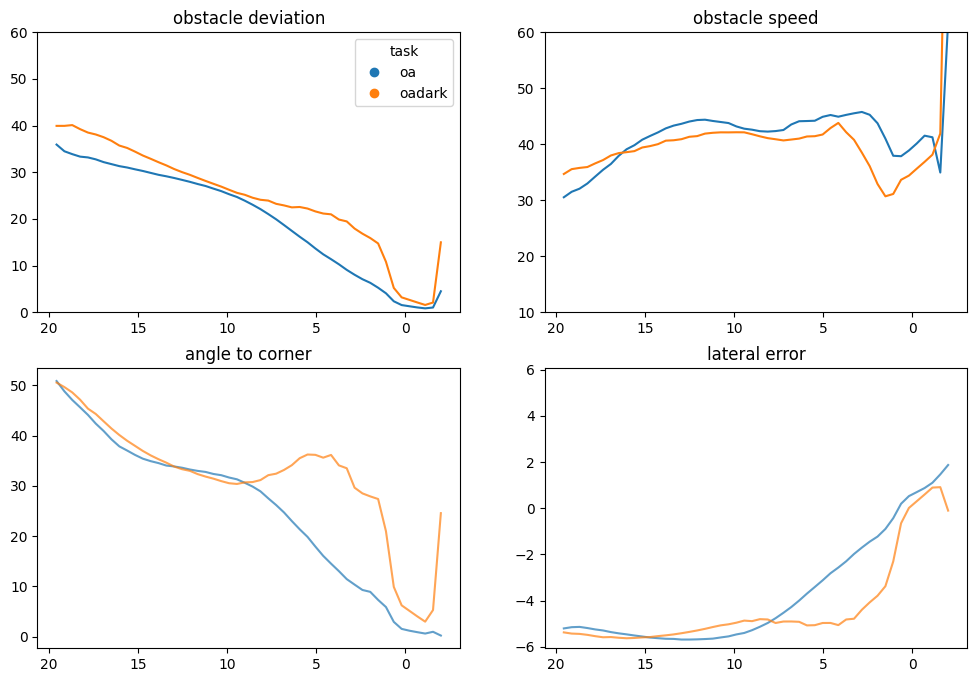

In [1839]:
data = pd.concat([oa_long,dark_long])

data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')

#data = drop_nans_in_columns(data,'skill')
#oa_long[oa_long['animal']!=[i for i in oa_long.animal.unique().tolist() if '1' not in i]]
xnew =  np.arange(-2, 20, .44)
fig,ax = plt.subplots(2,2,figsize=(12,8))
color_map = create_color_dict(data,'task','tab10',sort=False)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_map.values()]
ax[0,0].set_title('obstacle deviation')
ax[0,0].invert_xaxis()
ax[0,0].set_ylim(0,60)
ax[0,0].legend( markers,color_map.keys(), numpoints=1,title = 'task')

ax[0,1].set_title('obstacle speed')
ax[0,1].invert_xaxis()
ax[0,1].set_ylim(10,60)


ax[1,0].set_title('angle to corner')
ax[1,0].invert_xaxis()
ax[1,1].set_title('lateral error')
ax[1,1].invert_xaxis()





by_date = data.groupby(['task'])
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    dev_array = np.empty([rows,50])
    dev_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        dev_array[i] = ynew

    date_dev = np.nanmean(dev_array,axis = 0)
    
    ax[0,0].plot(xnew,date_dev,c = color,alpha = 1)

rows = data.shape[0]
dev_array = np.empty([rows,50])
dev_array[:] =np.nan 


#ax[0,0].fill_between(xnew, 
#all_dev-std_error_dev, 
#all_dev+std_error_dev, 
#facecolor='blue', alpha=0.5)


for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    speed_array = np.empty([rows,50])
    speed_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        speed_array[i] = ynew

    date_speed = np.nanmean(speed_array,axis = 0)
    ax[0,1].plot(xnew,date_speed,c = color,alpha = 1)

rows = data.shape[0]
speed_array = np.empty([rows,50])
speed_array[:] =np.nan 


for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,0].plot(xnew,date_angle,c = color,alpha = .7)


#goal 
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,1].plot(xnew,date_angle,c = color,alpha = .7)



symmetrize_y_axis(ax[1,1])

In [1613]:
def by_start_obstalce_average(df,var):
        #savepath = "D:/obstacle_avoidance/recordings"
        #savepath_session = os.path.join(*[savepath,'figures'])
        #savepath_session = os.path.join(*[savepath,str(pd.unique(df.date).item()),str(pd.unique(df.animal).item()),str(pd.unique(df.task).item())])
        #pdf = PdfPages(os.path.join((savepath_session), str(date)+ 'by_' +'_start_'+'obstacle' + 'consecutive.pdf'))
        key='start'
        fig = plt.figure(constrained_layout=False, figsize=(16, 10),dpi=90)
        fig.suptitle('by ' + key + ' '+ 'and ' +'obstacle ')
        spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)


        """Right"""
        panel_1 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[0])
        ax1 = fig.add_subplot(panel_1[0,0])
        plot_arena(df,ax1)
        ax2 = fig.add_subplot(panel_1[0,1])
        plot_arena(df,ax2)
        ax2.set_title('right')
        ax3 = fig.add_subplot(panel_1[1,0])
        plot_arena(df,ax3)
        ax4 = fig.add_subplot(panel_1[1,1])
        plot_arena(df,ax4)
        ax5 = fig.add_subplot(panel_1[2,0])
        plot_arena(df,ax5)
        ax6 = fig.add_subplot(panel_1[2,1])
        plot_arena(df,ax6)

        right_axs = [ax1,ax2,ax3,ax4,ax5,ax6]


        """Left """
        panel_2 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[1])
        ax7 = fig.add_subplot(panel_2[0,0])
        plot_arena(df,ax7)
        ax8 = fig.add_subplot(panel_2[0,1])
        plot_arena(df,ax8)
        ax8.set_title('left')
        ax9 = fig.add_subplot(panel_2[1,0])
        plot_arena(df,ax9)
        ax10 = fig.add_subplot(panel_2[1,1])
        plot_arena(df,ax10)
        ax11= fig.add_subplot(panel_2[2,0])
        plot_arena(df,ax11)
        ax12 = fig.add_subplot(panel_2[2,1])
        plot_arena(df,ax12)

        left_axs = [ax7,ax8,ax9,ax10,ax11,ax12]




        """ plot trials"""
        right_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),right_axs))
        left_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),left_axs))

        for direction, direction_frame in df.groupby(['odd']):
            for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
                #cluster_frame = cluster_frame.sample(num_sample)
                right_obstacle_axis = right_obstacle_dict.get(cluster)
                left_obstacle_axis = left_obstacle_dict.get(cluster)
                plot_obstacle(cluster_frame,right_obstacle_axis,cluster)
                plot_obstacle(cluster_frame,left_obstacle_axis,cluster)
                right_obstacle_axis.set_title(str(cluster))
                left_obstacle_axis.set_title(str(cluster))
                for start, start_frame in cluster_frame.groupby(['start']):
                     if direction == 'right':
                          if start == 'top':
                              if cluster in [2,3]:
                                   ob_median_x = get_median_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_median_y = get_median_of_df(start_frame,'ts_nose_y_cm',50)
                                   right_obstacle_axis.plot(ob_median_x,ob_median_y,color = 'tab:orange')                                                                                 
                              else:     
                                   ob_mean_x = get_mean_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_mean_y = get_mean_of_df(start_frame,'ts_nose_y_cm',50)
                                   right_obstacle_axis.plot(ob_mean_x,ob_mean_y,color = 'tab:orange')
           
                              if cluster in [2,3]:
                                   ob_median_x = get_median_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_median_y = get_median_of_df(start_frame,'ts_nose_y_cm',50)
                                   right_obstacle_axis.plot(ob_median_x,ob_median_y,color = 'black')
                              else:     
                                   ob_mean_x = get_mean_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_mean_y = get_mean_of_df(start_frame,'ts_nose_y_cm',50)
                                   right_obstacle_axis.plot(ob_mean_x,ob_mean_y,color = 'black')
           
                               
                     if direction == 'left':
                          if start == 'top':
                              if cluster in [2,3]:
                                   ob_median_x = get_median_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_median_y = get_median_of_df(start_frame,'ts_nose_y_cm',50)
                                   left_obstacle_axis.plot(ob_median_x,ob_median_y,color = 'tab:orange')
                              else:     
                                   ob_mean_x = get_mean_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_mean_y = get_mean_of_df(start_frame,'ts_nose_y_cm',50)
                                   left_obstacle_axis.plot(ob_mean_x,ob_mean_y,color = 'tab:orange')
           
                              
                          if start == 'bottom':
                              if cluster in [2,3]:
                                   ob_median_x = get_median_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_median_y = get_median_of_df(start_frame,'ts_nose_y_cm',50)
                                   left_obstacle_axis.plot(ob_median_x,ob_median_y,color = 'black')
                              else:     
                                   ob_mean_x = get_mean_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_mean_y = get_mean_of_df(start_frame,'ts_nose_y_cm',50)
                                   left_obstacle_axis.plot(ob_mean_x,ob_mean_y,color = 'black')
                #color_map_top = create_color_dict(data,var,'magma',sort=False)
                color_map = create_color_dict(df,var,'magma',sort=False)
                markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_map.values()]
                ax1.legend(markers, color_map.keys(), numpoints=1,title = var)
                for start, start_frame in cluster_frame.groupby(['start']):
                    for vari, var_frame in start_frame.groupby([var]):
                         color = color_map.get(vari)
                         if direction == 'right':
                          if start == 'top':
                              if cluster in [2,3]:
                                   ob_median_x = get_median_of_df(var_frame,'ts_nose_x_cm',50) 
                                   ob_median_y = get_median_of_df(var_frame,'ts_nose_y_cm',50)
                                   right_obstacle_axis.plot(ob_median_x,ob_median_y,color = color)                                                                                 
                              else:     
                                   ob_mean_x = get_mean_of_df(var_frame,'ts_nose_x_cm',50) 
                                   ob_mean_y = get_mean_of_df(var_frame,'ts_nose_y_cm',50)
                                   right_obstacle_axis.plot(ob_mean_x,ob_mean_y,color = color)
                          if start == 'bottom':
                              if cluster in [2,3]:
                                   ob_median_x = get_median_of_df(var_frame,'ts_nose_x_cm',50) 
                                   ob_median_y = get_median_of_df(var_frame,'ts_nose_y_cm',50)
                                   right_obstacle_axis.plot(ob_median_x,ob_median_y,color = color)
                              else:     
                                   ob_mean_x = get_mean_of_df(var_frame,'ts_nose_x_cm',50) 
                                   ob_mean_y = get_mean_of_df(var_frame,'ts_nose_y_cm',50)
                                   right_obstacle_axis.plot(ob_mean_x,ob_mean_y,color = color)
           
                               
                         if direction == 'left':
                             if start == 'top':
                                 if cluster in [2,3]:
                                      ob_median_x = get_median_of_df(var_frame,'ts_nose_x_cm',50) 
                                      ob_median_y = get_median_of_df(var_frame,'ts_nose_y_cm',50)
                                      left_obstacle_axis.plot(ob_median_x,ob_median_y,color = color)
                                 else:     
                                      ob_mean_x = get_mean_of_df(var_frame,'ts_nose_x_cm',50) 
                                      ob_mean_y = get_mean_of_df(var_frame,'ts_nose_y_cm',50)
                                      left_obstacle_axis.plot(ob_mean_x,ob_mean_y,color = color)
                             if start == 'bottom':
                                 if cluster in [2,3]:
                                      ob_median_x = get_median_of_df(var_frame,'ts_nose_x_cm',50) 
                                      ob_median_y = get_median_of_df(var_frame,'ts_nose_y_cm',50)
                                      left_obstacle_axis.plot(ob_median_x,ob_median_y,color = color)
                                 else:     
                                      ob_mean_x = get_mean_of_df(var_frame,'ts_nose_x_cm',50) 
                                      ob_mean_y = get_mean_of_df(var_frame,'ts_nose_y_cm',50)
                                      left_obstacle_axis.plot(ob_mean_x,ob_mean_y,color = color )  
               
                               
                                        
                                   
                                        
           


In [ ]:
        for start, start_frame in cluster_frame.groupby(['start']):
                   if direction == 'right':
                       if start == 'top':
                           if cluster in [2,3]:
                               right_obstacle_axis.plot(np.linspace(10,50,50),start_frame['median_interp_ts_nose_y_cm'].to_numpy()[0],c = 'black')
                               right_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame['median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame['mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame['median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame['mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='black', alpha=0.5)
                           else:
                               right_obstacle_axis.plot(np.linspace(10,50,50),start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0],c = 'black')
                               right_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='black', alpha=0.5)
                       if start == 'bottom':
                           if cluster in [2,3]:
                               right_obstacle_axis.plot(np.linspace(10,50,50),start_frame['median_interp_ts_nose_y_cm'].to_numpy()[0],c = 'red')
                               right_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame['median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame['mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame['median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame['mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='red', alpha=0.5)
                           else:
                               right_obstacle_axis.plot(np.linspace(10,50,50),start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0],c = 'red')
                               right_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='red', alpha=0.5)
                   if direction == 'left':
                       if start == 'top':
                            if cluster in [2,3]:
                               left_obstacle_axis.plot(np.linspace(10,50,50),start_frame['median_interp_ts_nose_y_cm'].to_numpy()[0],c = 'black')
                               left_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame['median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame['mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame['median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame['mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='black', alpha=0.5)
                            else:
                               left_obstacle_axis.plot(np.linspace(10,50,50),start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0],c = 'black')
                               left_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='black', alpha=0.5)
                       if start == 'bottom':
                           if cluster in [2,3]:
                               
                           else:
                               left_obstacle_axis.plot(np.linspace(10,50,50),start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0],c = 'red')
                               left_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='red', alpha=0.5)

              
                    

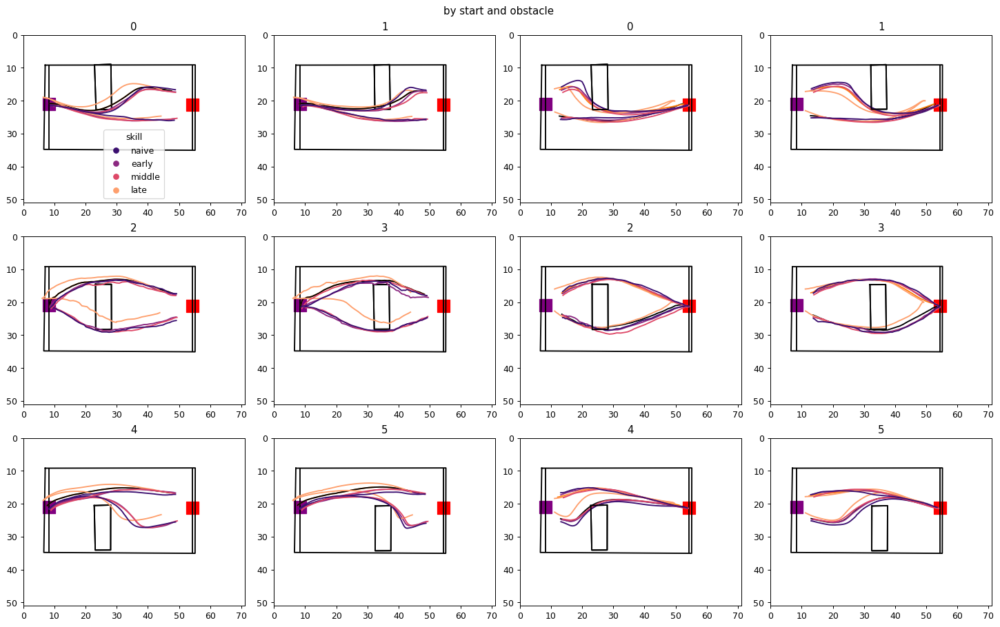

In [1840]:
data = drop_nans_in_columns(oa_df,'skill')
by_start_obstalce_average(data,'skill')

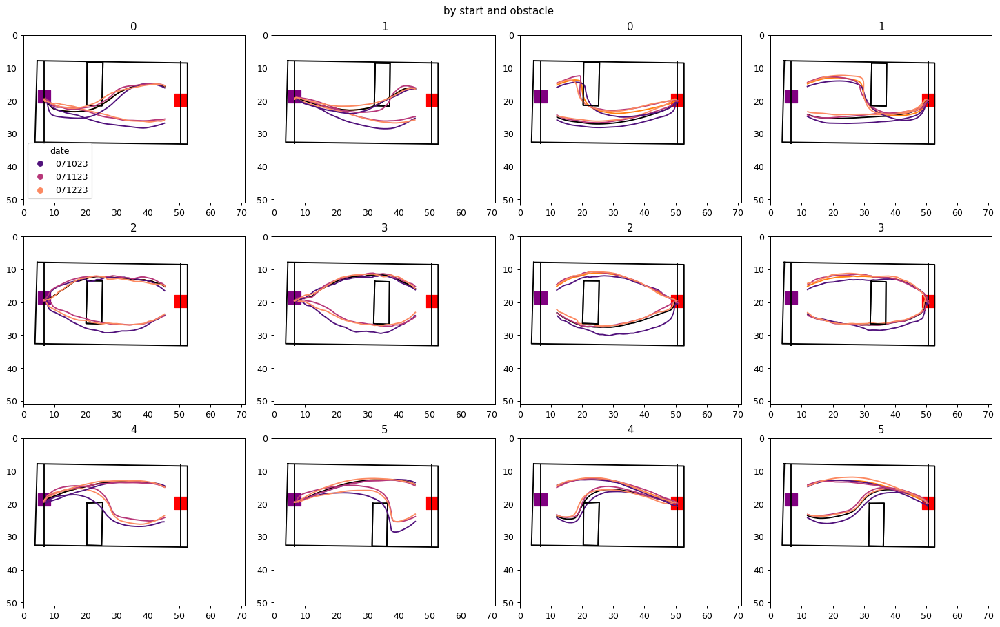

In [344]:
by_start_obstalce_average(dark_oa_df,'date')

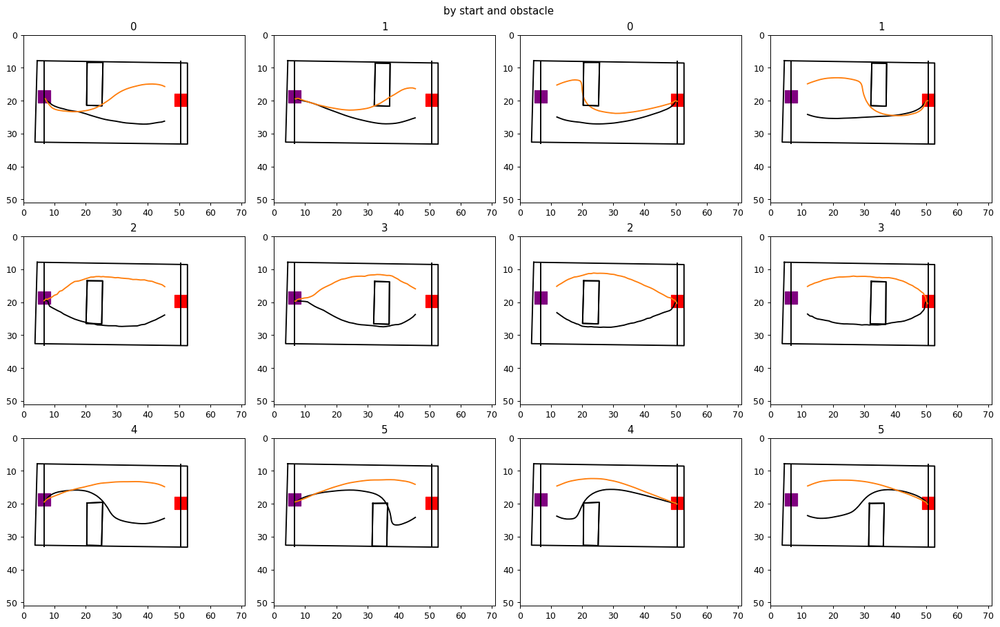

In [323]:
by_start_obstalce_average(dark_oa_df)

In [54]:
def plot_trials_sample(df,sample):
    """Direction by key obstalce trials"""
   
    fig = plt.figure(constrained_layout=False, figsize=(20, 10),dpi=90)
    
    spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
    """Right"""
    panel_1 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[0])
    ax1 = fig.add_subplot(panel_1[0,0])
    plot_arena(df,ax1)
    ax2 = fig.add_subplot(panel_1[0,1])
    plot_arena(df,ax2)
    ax2.set_title('right')
    ax3 = fig.add_subplot(panel_1[1,0])
    plot_arena(df,ax3)
    ax4 = fig.add_subplot(panel_1[1,1])
    plot_arena(df,ax4)
    ax5 = fig.add_subplot(panel_1[2,0])
    plot_arena(df,ax5)
    ax6 = fig.add_subplot(panel_1[2,1])
    plot_arena(df,ax6)
    right_axs = [ax1,ax2,ax3,ax4,ax5,ax6]

    """Left """
    panel_2 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[1])
    ax7 = fig.add_subplot(panel_2[0,0])
    plot_arena(df,ax7)
    ax8 = fig.add_subplot(panel_2[0,1])
    plot_arena(df,ax8)
    ax8.set_title('left')
    ax9 = fig.add_subplot(panel_2[1,0])
    plot_arena(df,ax9)
    ax10 = fig.add_subplot(panel_2[1,1])
    plot_arena(df,ax10)
    ax11= fig.add_subplot(panel_2[2,0])
    plot_arena(df,ax11)
    ax12 = fig.add_subplot(panel_2[2,1])
    plot_arena(df,ax12)
    left_axs = [ax7,ax8,ax9,ax10,ax11,ax12]
   
    
    

    """ plot trials"""
    right_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),right_axs))
    left_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),left_axs))
    for direction, direction_frame in df.groupby(['odd']):
        for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
            cluster_frame = cluster_frame.sample(sample)
            right_obstacle_axis = right_obstacle_dict.get(cluster)
            left_obstalce_axis = left_obstacle_dict.get(cluster)
            plot_orginal_obstacle(cluster_frame,right_obstacle_axis,cluster)
            plot_orginal_obstacle(cluster_frame,left_obstalce_axis,cluster)
            right_obstacle_axis.set_title(str(cluster))
            left_obstalce_axis.set_title(str(cluster))
            for ind,row in cluster_frame.iterrows():
                if direction == 'right':
                    if row.start == 'top':
                        which_axis = right_obstacle_dict.get(cluster)
                        which_axis.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'],c = 'red',alpha = .25)
                    if row.start == 'bottom':
                        which_axis = right_obstacle_dict.get(cluster)
                        which_axis.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'],c = 'black',alpha = .25)
                if direction == 'left':
                    if row.start == 'top':
                        which_axis = left_obstacle_dict.get(cluster)
                        which_axis.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'],c = 'red',alpha = .25)
                    if row.start == 'bottom':
                        which_axis = left_obstacle_dict.get(cluster)
                        which_axis.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'],c = 'black',alpha = .25)

In [62]:
df = oa_df 
arena_x = pd.unique(df[['arenaTL_x_cm',
    'arenaTR_x_cm','arenaBR_x_cm',
    'arenaBL_x_cm',
    'arenaTL_x_cm']].values.ravel('K'))

arena_y = pd.unique(df[['arenaTL_y_cm',
'arenaTR_y_cm','arenaBR_y_cm',
'arenaBL_y_cm',
'arenaTL_y_cm']].values.ravel('K'))

In [63]:
arena_x

array([ 6.08096829, 54.38577049, 54.49179474,  5.65369599])

In [ ]:
plot

In [ ]:
plot_orginal_obstacle

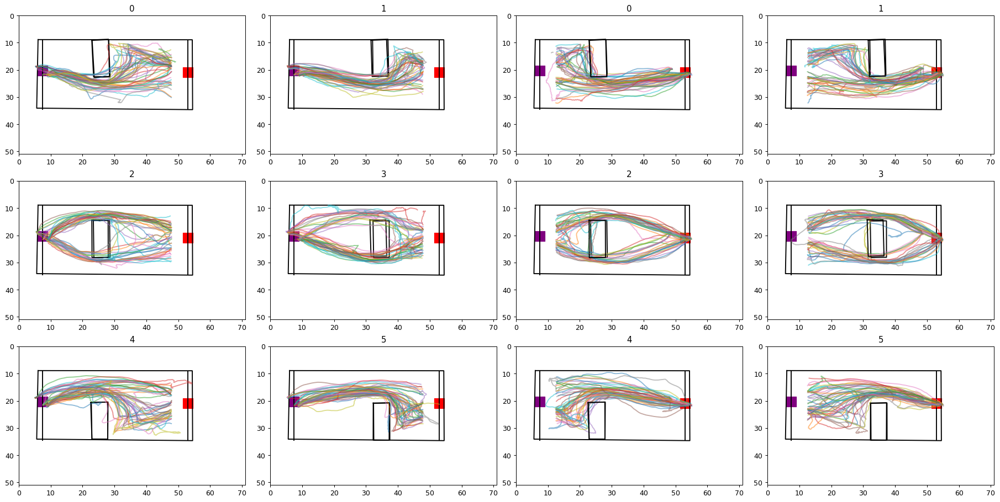

In [385]:
plot_trials_sample(oa_df,50)

071023
071123
071223
071323


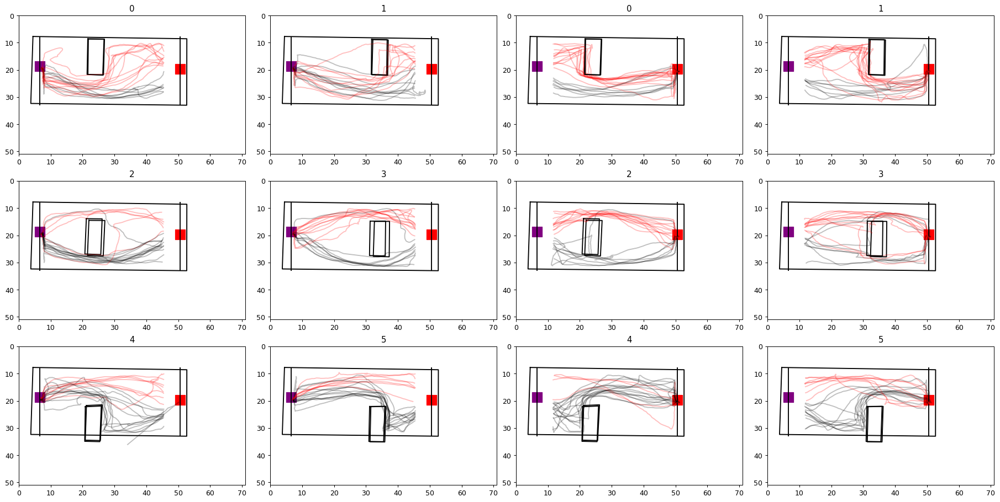

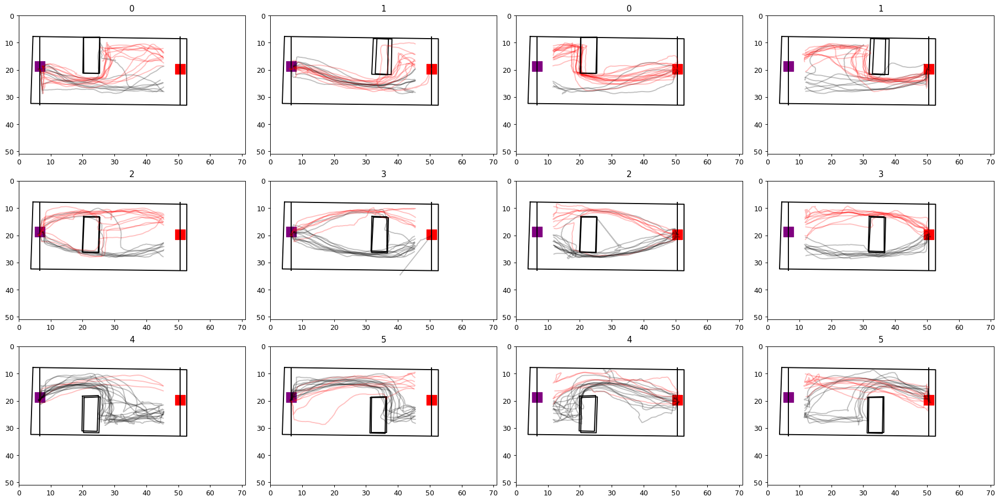

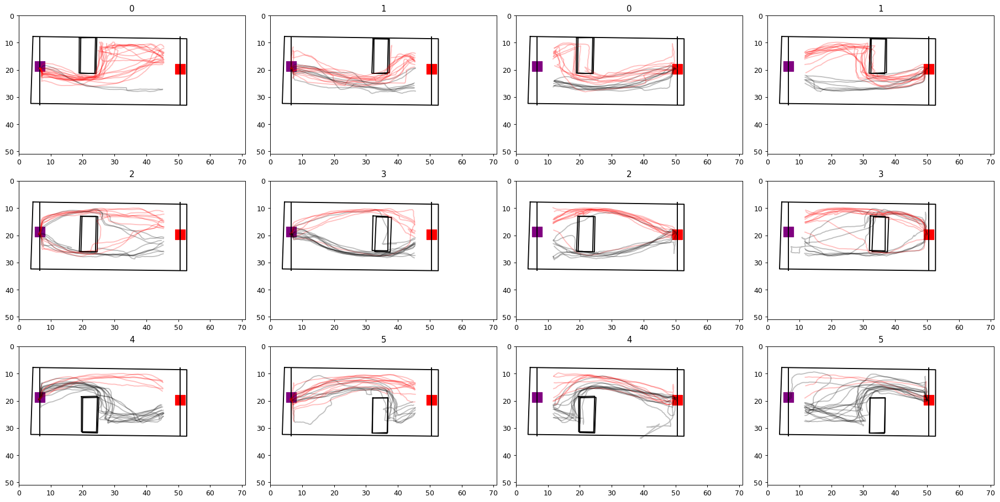

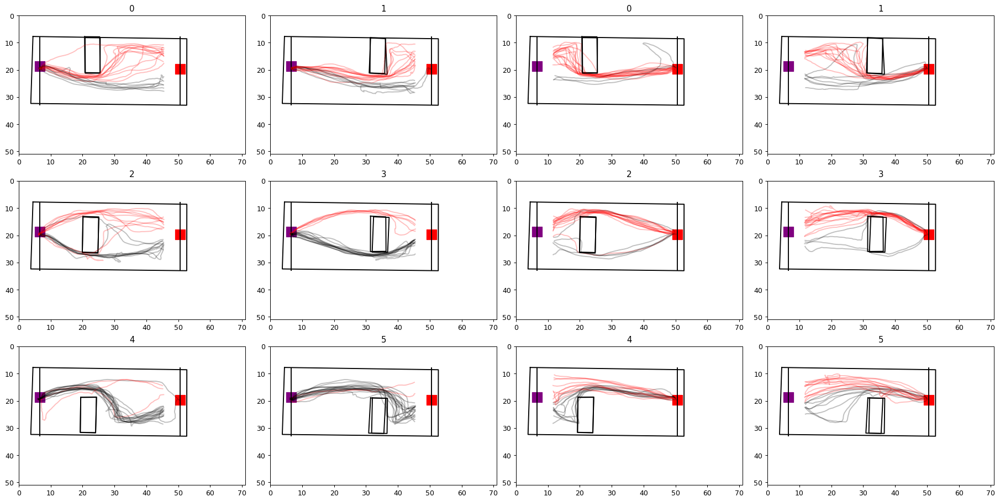

In [55]:
for skill,skill_frame in dark_oa_df.groupby(['date']):
    print(skill)
    plot_trials_sample(skill_frame,20)
    

In [60]:
skill_frame['skill'].unique()

array(['middle', 'late'], dtype=object)

042823
043023
050123
050223
050323
050423
050523
050923
051023
051723
051823
051923
052223
052323
052523
052623
061323
061423
071823
071923
072123


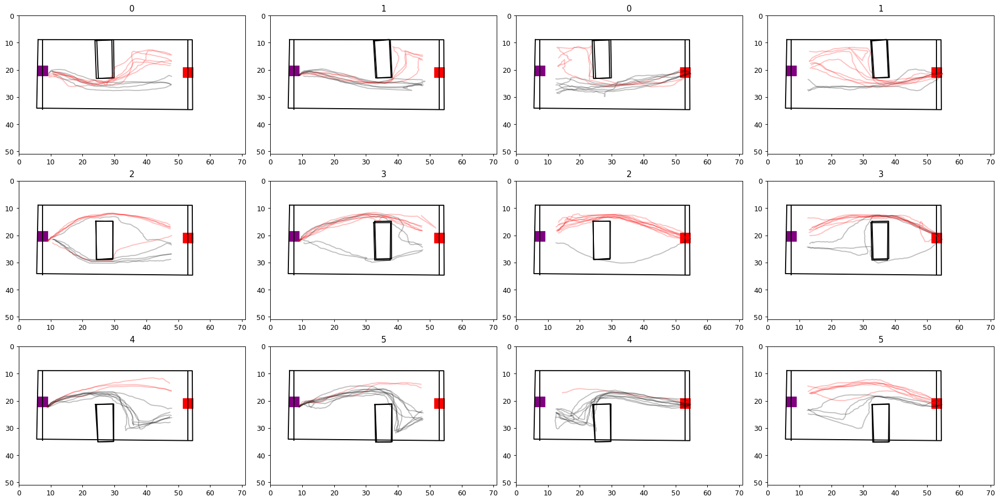

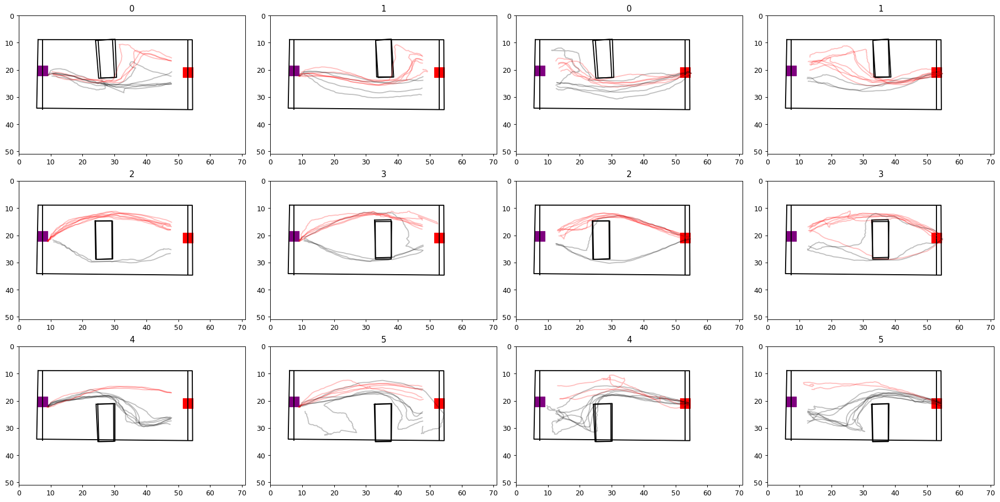

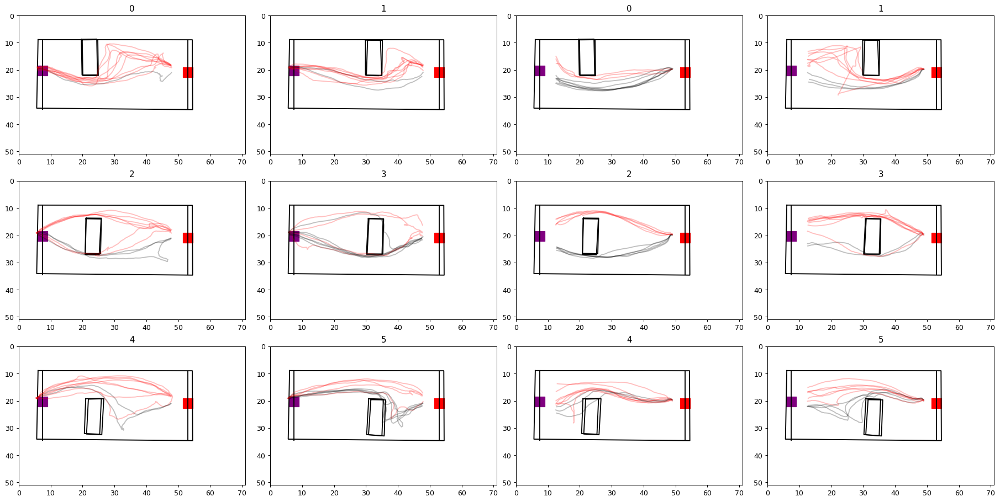

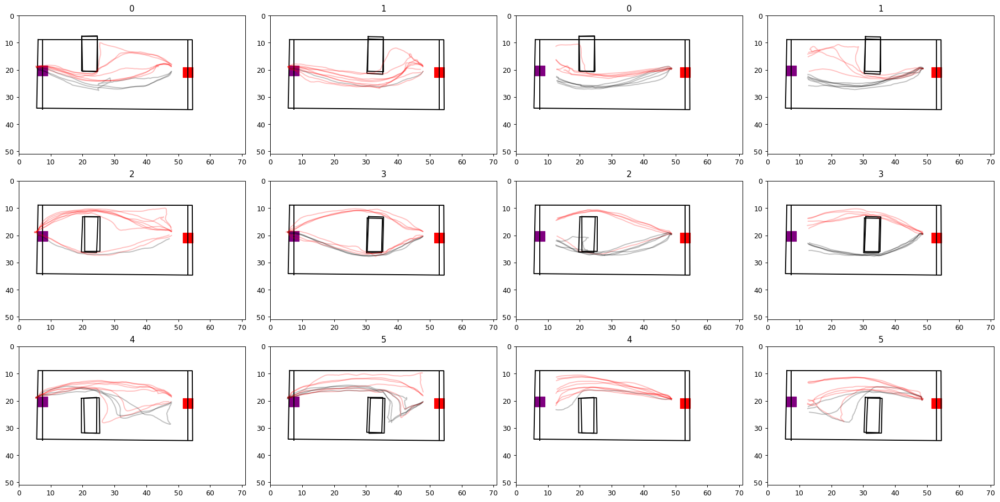

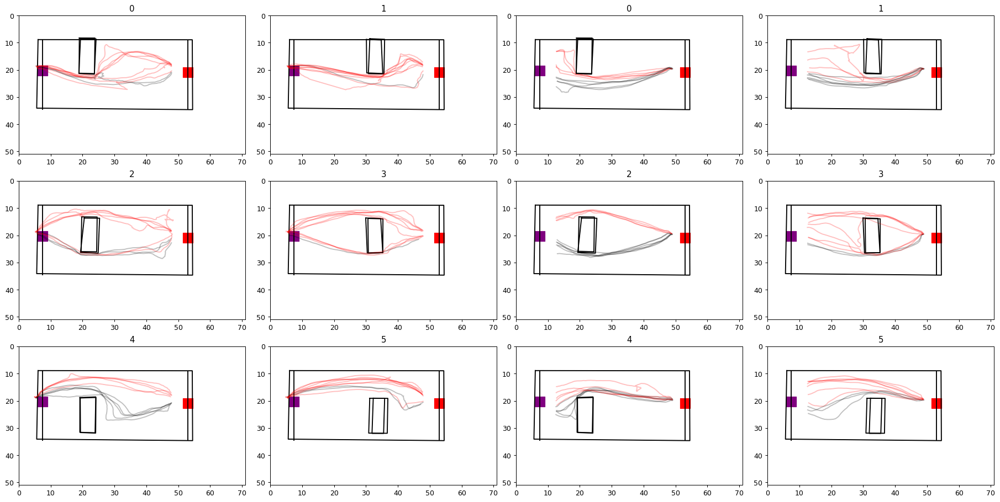

In [61]:
for skill,skill_frame in oa_df.groupby(['date']):
    print(skill)
    if 'late' in skill_frame['skill'].unique():
        plot_trials_sample(skill_frame,10)
    else:
        continue
    

In [2]:

test = oa_long[oa_long['ob_linearity']>.9]
plot_trials_sample(test,50)

NameError: name 'oa_long' is not defined

In [396]:
oa_long.groupby(['skill'])['ts_distance_from_edge']

In [397]:
naive = oa_long[oa_long['skill']=='naive']


,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,goal_basis_end_x,goal_basis_end_y,obstacle_devations,goal_devations,ob_tortuosity,ob_linearity,go_tortuosity,go_linearity,skill,ts_lateral_error
18,19,23.0,55968.446784,55972.150118,"[55968.457036, 55968.474214, 55968.490777, 559...","[[7724, 7725, 7726, 7727, 7728, 7729, 7730, 77...","[684.8956909179688, 685.5166625976562, 686.734...","[276.1261901855469, 276.2704162597656, 276.096...","[669.5835571289062, 670.5010375976562, 671.231...","[272.48040771484375, 271.9192810058594, 271.15...",...,9.206374,21.498607,"[nan, 64.75348288439682, 56.632386350392956, 5...","[nan, 18.539437798862654, 16.63680939629646, 1...",1.648423,0.606640,1.035650,0.965577,naive,NaN
29,30,35.0,56025.418905,56030.842496,"[56025.427046, 56025.443699, 56025.460428, 560...","[[11141, 11142, 11143, 11144, 11145, 11146, 11...","[681.3780517578125, nan, nan, nan, nan, nan, n...","[275.2206115722656, nan, nan, nan, nan, nan, n...","[669.8692626953125, 671.6943969726562, 674.338...","[268.4548034667969, 268.9363708496094, 268.745...",...,9.085787,22.391738,"[nan, 55.14409610406446, 39.655961889041315, 4...","[nan, 39.575898033332194, 32.19636281105566, 3...",1.649958,0.606076,1.060052,0.943350,naive,NaN
40,41,47.0,56089.383270,56096.416729,"[56089.399347, 56089.415577, 56089.432332, 560...","[[14978, 14979, 14980, 14981, 14982, 14983, 14...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[675.2911376953125, 677.028076171875, 678.3170...","[264.6787414550781, 265.697021484375, 266.2087...",...,7.699420,21.705703,"[nan, 83.19062452332662, 60.67378176503683, 68...","[nan, 36.08340033788272, 17.262240174275064, 1...",1.834629,0.545069,1.048259,0.953963,naive,NaN
42,43,49.0,56101.012761,56104.130214,"[56101.019648, 56101.036364, 56101.053452, 561...","[[15675, 15676, 15677, 15678, 15679, 15680, 15...","[686.4649658203125, 685.9793090820312, nan, na...","[275.90142822265625, 277.9461975097656, nan, n...","[670.5230712890625, 671.7032470703125, 672.822...","[271.092041015625, 270.7273864746094, 270.5169...",...,7.503805,21.916393,"[nan, 8.256879947189939, 23.680910013710047, 1...","[nan, 10.22227058844762, 8.620681727550952, 9....",1.064221,0.939654,1.076798,0.928680,naive,NaN
55,56,63.0,56172.563955,56176.160588,"[56172.578176, 56172.594867, 56172.612428, 561...","[[19967, 19968, 19969, 19970, 19971, 19972, 19...","[683.0909423828125, 684.2697143554688, 686.127...","[274.2113342285156, 273.2940673828125, 273.591...","[667.3619384765625, 669.4915771484375, 673.093...","[271.208740234375, 271.1734924316406, 270.4080...",...,8.853785,20.062080,"[nan, 37.43740915655736, 41.13648369802006, 36...","[nan, 16.968072488813373, 20.19123056367053, 2...",1.556092,0.642635,1.022401,0.978090,naive,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5701,30,30.0,47804.818956,47807.637248,"[47804.835379, 47804.851302, 47804.867916, 478...","[5190, 5191, 5192, 5193, 5194, 5195, 5196, 519...","[110.31377410888672, 110.43212127685547, 110.1...","[272.6701354980469, 273.0883483886719, 272.862...","[131.92759704589844, 132.38150024414062, 131.9...","[271.64404296875, 271.0944519042969, 271.02407...",...,54.321401,21.242951,"[nan, 64.85371481643107, 66.38561123755508, 72...","[nan, 19.92897068147206, 25.362814018804787, 2...",1.444155,0.692446,1.046780,0.955310,naive,NaN
5703,32,32.0,47810.721881,47813.216473,"[47810.736512, 47810.753254, 47810.770713, 478...","[5544, 5545, 5546, 5547, 5548, 5549, 5550, 555...","[111.91423797607422, 111.3005142211914, 110.89...","[272.45513916015625, 272.26861572265625, 272.4...","[131.2439727783203, 129.54550170898438, 128.60...","[271.7565612792969, 271.3213195800781, 271.603...",...,54.354355,21.169084,"[nan, 47.84453923886895, 47.26115969951011, 46...","[nan, 32.03285457583283, 28.928865707314674, 2...",1.514256,0.660390,1.032762,0.968277,naive,Na

In [43]:
def distance_to_edge_vector(df):
    distance_vec = []
    for ind,row in df.iterrows():
        try:
            obstacle_distances = row['ts_distance_from_edge'][:int(row['obstacle_ind'])].astype(float)
            distance_vec.append(obstacle_distances)
        except ValueError:
            continue
    return np.concatenate(distance_vec).ravel()

def variable_obstacle_vector(df,var):
    var_vec = []
    for ind,row in df.iterrows():
        try:
            obstacle_distances = row[var][:int(row['obstacle_ind'])].astype(float)
            var_vec.append(obstacle_distances)
        except ValueError:
            continue
    return np.concatenate(var_vec).ravel()

In [46]:
dark_long.date.unique()

array(['071023', '071123', '071223', '071323'], dtype=object)

In [41]:
naive = dark_long[dark_long['date']=='071023']
naive_distances = variable_obstacle_vector(naive,'ts_distance_from_edge')
naive_df = {'type': '071023', 'distances': naive_distances.astype(object)}
naive_df = pd.DataFrame.from_dict(naive_df)


early = dark_long[dark_long['date']=='071123']
early_distances = variable_obstacle_vector(early,'ts_distance_from_edge')
early_df = {'type': '071123', 'distances': early_distances.astype(object)}
early_df = pd.DataFrame.from_dict(early_df)


middle = dark_long[dark_long['date']=='071223']
middle_distances = variable_obstacle_vector(middle,'ts_distance_from_edge')
middle_df = {'type': '071223', 'distances': middle_distances.astype(object)}
middle_df = pd.DataFrame.from_dict(middle_df)



late = dark_long[dark_long['date']=='071323']
late_distances = variable_obstacle_vector(late,'ts_distance_from_edge')
late_distances_df = {'type': '071323', 'distances': late_distances.astype(object)}
late_distances_df = pd.DataFrame.from_dict(late_distances_df)

dark_distances = pd.concat([naive_df,early_df,middle_df,late_distances_df])

In [37]:
naive = oa_long[oa_long['skill']=='naive']
naive_distances = variable_obstacle_vector(naive,'ts_distance_from_edge')
naive_df = {'type': 'naive', 'distances': naive_distances.astype(object)}
naive_df = pd.DataFrame.from_dict(naive_df)


early = oa_long[oa_long['skill']=='early']
early_distances = variable_obstacle_vector(early,'ts_distance_from_edge')
early_df = {'type': 'early', 'distances': early_distances.astype(object)}
early_df = pd.DataFrame.from_dict(early_df)


middle = oa_long[oa_long['skill']=='middle']
middle_distances = variable_obstacle_vector(middle,'ts_distance_from_edge')
middle_df = {'type': 'middle', 'distances': middle_distances.astype(object)}
middle_df = pd.DataFrame.from_dict(middle_df)



late = oa_long[oa_long['skill']=='late']
late_distances = variable_obstacle_vector(late,'ts_distance_from_edge')
late_distances_df = {'type': 'late', 'distances': late_distances.astype(object)}
late_distances_df = pd.DataFrame.from_dict(late_distances_df)

light_distances = pd.concat([naive_df,early_df,middle_df,late_distances_df])


In [47]:
naive = oa_long[oa_long['skill']=='naive']
drop_nans_in_columns(naive,'lateral_error')
naive_lateral_error = variable_obstacle_vector(naive,'lateral_error')
naive_df = {'type': 'naive', 'lateral_error': naive_lateral_error.astype(object)}
naive_df = pd.DataFrame.from_dict(naive_df)


early = oa_long[oa_long['skill']=='early']
drop_nans_in_columns(early,'lateral_error')
early_lateral_error = variable_obstacle_vector(early,'lateral_error')
early_df = {'type': 'early', 'lateral_error': early_lateral_error.astype(object)}
early_df = pd.DataFrame.from_dict(early_df)


middle = oa_long[oa_long['skill']=='middle']
drop_nans_in_columns(middle,'lateral_error')
middle_lateral_error = variable_obstacle_vector(middle,'lateral_error')
middle_df = {'type': 'middle', 'lateral_error': middle_lateral_error.astype(object)}
middle_df = pd.DataFrame.from_dict(middle_df)



late = oa_long[oa_long['skill']=='late']
drop_nans_in_columns(late,'lateral_error')
late_lateral_error = variable_obstacle_vector(late,'lateral_error')
late_lateral_error_df = {'type': 'late', 'lateral_error': late_lateral_error.astype(object)}
late_lateral_error_df = pd.DataFrame.from_dict(late_lateral_error_df)

light_lateral_error = pd.concat([naive_df,early_df,middle_df,late_lateral_error_df])

In [432]:
naive_df = {'type': 'naive', 'distances': naive_distances.astype(object)}
naive_df = pd.DataFrame.from_dict(naive_df)

In [48]:
light_lateral_error

,type,lateral_error
0,naive,-9.372508
1,naive,-9.633113
2,naive,-9.833089
3,naive,-10.014191
4,naive,-10.119523
...,...,...
33390,late,1.174453
33391,late,1.487712
33392,late,1.747951
33393,late,1.907841


In [74]:
light_speed = light_speed.loc[:,~light_speed.columns.duplicated()]

In [68]:
light_speed[light_speed.index.duplicated()]

,type,distances
0,early,3.6524
1,early,2.040313
2,early,1.57107
3,early,1.646944
4,early,0.703047
...,...,...
39100,late,49.626369
39101,late,49.66364
39102,late,39.442027
39103,late,63.946173


In [70]:
light_speed = light_speed.reindex()

In [85]:
light_speed

,type,distances
0,naive,28.036855
1,naive,35.383456
2,naive,22.429455
3,naive,19.202659
4,naive,41.779673
...,...,...
41046,late,57.962305
41047,late,49.058459
41048,late,43.108428
41049,late,59.438759


<AxesSubplot: xlabel='type', ylabel='distances'>

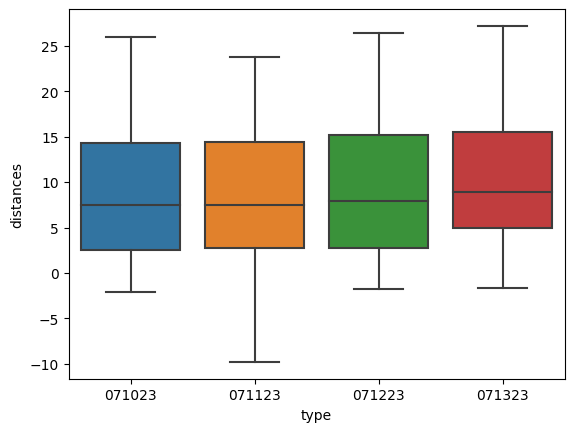

In [42]:
fig,ax = plt.subplots()
sns.boxplot(x =dark_distances.type, y=dark_distances.distances, data=dark_distances,ax = ax)

<AxesSubplot: xlabel='type', ylabel='distances'>

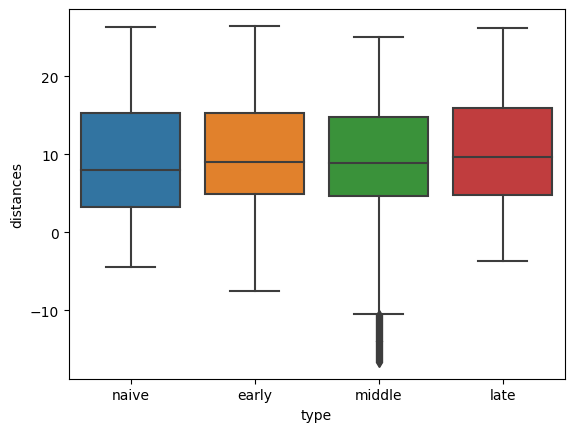

In [40]:
fig,ax = plt.subplots()
sns.boxplot(x =light_distances.type, y=light_distances.distances, data=light_distances,ax = ax)

<AxesSubplot: xlabel='type', ylabel='lateral_error'>

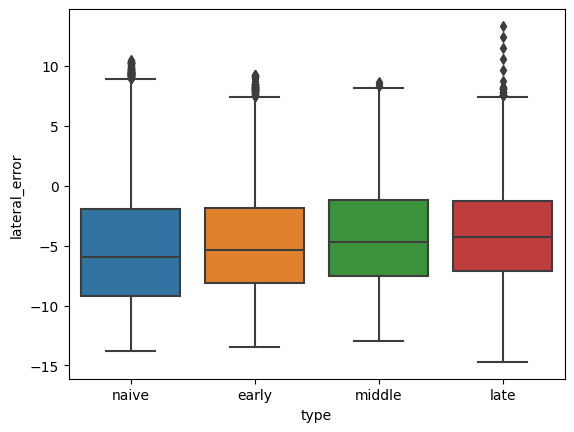

In [50]:
fig,ax = plt.subplots()
sns.boxplot(x =light_lateral_error.type, y=light_lateral_error.lateral_error, data=light_lateral_error,ax = ax)

<AxesSubplot: xlabel='lateral_error', ylabel='Density'>

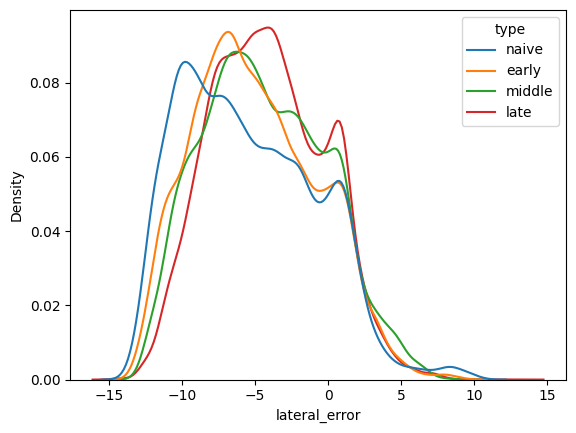

In [51]:
fig,ax = plt.subplots()
sns.kdeplot(hue =light_lateral_error.type, x=light_lateral_error.lateral_error, data=light_lateral_error,ax = ax,common_norm=False)

<AxesSubplot: xlabel='distances', ylabel='Density'>

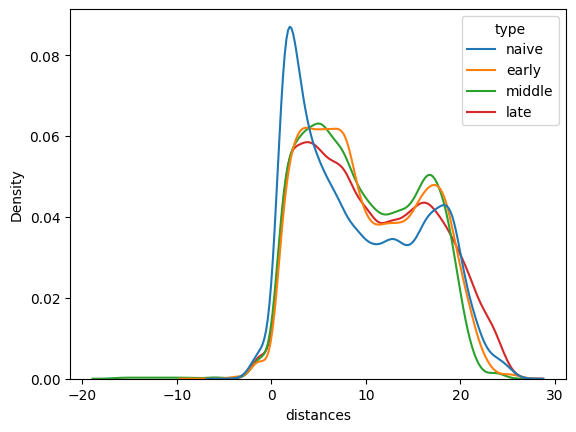

In [38]:
fig,ax = plt.subplots()
sns.kdeplot(hue =light_distances.type, x=light_distances.distances, data=light_distances,ax = ax,common_norm=False)

<AxesSubplot: xlabel='distances', ylabel='Density'>

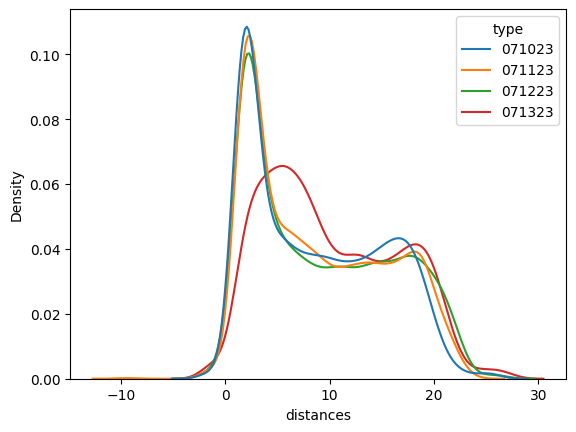

In [43]:
fig,ax = plt.subplots()
sns.kdeplot(hue =dark_distances.type, x=dark_distances.distances, data=dark_distances,ax = ax,common_norm=False)

In [41]:
ns_oa_long[ns_oa_long]

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,goal_basis_start_y,goal_basis_end_x,goal_basis_end_y,obstacle_devations,goal_devations,ob_tortuosity,ob_linearity,go_tortuosity,go_linearity,skill
18,19,23.0,55968.446784,55972.150118,"[55968.457036, 55968.474214, 55968.490777, 559...","[[7724, 7725, 7726, 7727, 7728, 7729, 7730, 77...","[684.8956909179688, 685.5166625976562, 686.734...","[276.1261901855469, 276.2704162597656, 276.096...","[669.5835571289062, 670.5010375976562, 671.231...","[272.48040771484375, 271.9192810058594, 271.15...",...,25.445465,9.206374,21.498607,"[nan, 64.75348288439682, 56.632386350392956, 5...","[nan, 18.539437798862654, 16.63680939629646, 1...",1.648423,0.606640,1.035650,0.965577,naive
29,30,35.0,56025.418905,56030.842496,"[56025.427046, 56025.443699, 56025.460428, 560...","[[11141, 11142, 11143, 11144, 11145, 11146, 11...","[681.3780517578125, nan, nan, nan, nan, nan, n...","[275.2206115722656, nan, nan, nan, nan, nan, n...","[669.8692626953125, 671.6943969726562, 674.338...","[268.4548034667969, 268.9363708496094, 268.745...",...,27.454632,9.085787,22.391738,"[nan, 55.14409610406446, 39.655961889041315, 4...","[nan, 39.575898033332194, 32.19636281105566, 3...",1.649958,0.606076,1.060052,0.943350,naive
40,41,47.0,56089.383270,56096.416729,"[56089.399347, 56089.415577, 56089.432332, 560...","[[14978, 14979, 14980, 14981, 14982, 14983, 14...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[675.2911376953125, 677.028076171875, 678.3170...","[264.6787414550781, 265.697021484375, 266.2087...",...,24.435673,7.699420,21.705703,"[nan, 83.19062452332662, 60.67378176503683, 68...","[nan, 36.08340033788272, 17.262240174275064, 1...",1.834629,0.545069,1.048259,0.953963,naive
42,43,49.0,56101.012761,56104.130214,"[56101.019648, 56101.036364, 56101.053452, 561...","[[15675, 15676, 15677, 15678, 15679, 15680, 15...","[686.4649658203125, 685.9793090820312, nan, na...","[275.90142822265625, 277.9461975097656, nan, n...","[670.5230712890625, 671.7032470703125, 672.822...","[271.092041015625, 270.7273864746094, 270.5169...",...,24.324423,7.503805,21.916393,"[nan, 8.256879947189939, 23.680910013710047, 1...","[nan, 10.22227058844762, 8.620681727550952, 9....",1.064221,0.939654,1.076798,0.928680,naive
55,56,63.0,56172.563955,56176.160588,"[56172.578176, 56172.594867, 56172.612428, 561...","[[19967, 19968, 19969, 19970, 19971, 19972, 19...","[683.0909423828125, 684.2697143554688, 686.127...","[274.2113342285156, 273.2940673828125, 273.591...","[667.3619384765625, 669.4915771484375, 673.093...","[271.208740234375, 271.1734924316406, 270.4080...",...,25.035215,8.853785,20.062080,"[nan, 37.43740915655736, 41.13648369802006, 36...","[nan, 16.968072488813373, 20.19123056367053, 2...",1.556092,0.642635,1.022401,0.978090,naive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13167,29,30.0,34314.557619,34317.101376,"[34314.560665, 34314.57751, 34314.594841, 3431...","[4691, 4692, 4693, 4694, 4695, 4696, 4697, 469...","[78.39656829833984, 77.59469604492188, 77.8112...","[255.009765625, 254.42198181152344, 253.093536...","[83.70624542236328, 82.67115020751953, 82.5404...","[263.9029235839844, 263.5953063964844, 262.486...",...,12.705331,48.605285,19.539564,"[nan, 25.485242404861115, 23.636259101573952, ...","[nan, 13.331256481984587, 12.568625811744004, ...",1.014361,0.985843,1.028703,0.972098,late
13169,31,32.0,34319.423948,34321.668684,"[34319.429184, 34319.446489, 34319.462848, 343...","[4983, 4984, 4985, 4986, 4987, 4988, 4989, 499...","[75.58148193359375, 74.70291900634766, 74.7823...","[257.4228210449219, 256.7760925292969, 257.376...","[90.63947296142578, 88.8265151977539, 88.23897...","[254.66358947753906, 254.55325317382812, 254.2...",...,13.579741,48.661819,19.413572,"[nan, 4.611366013212092, 1.730681570894103, 0....","[nan, 6.72200026208888, 6.417630810019453, 2.6

In [448]:
ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 

In [447]:
ob_mean_x

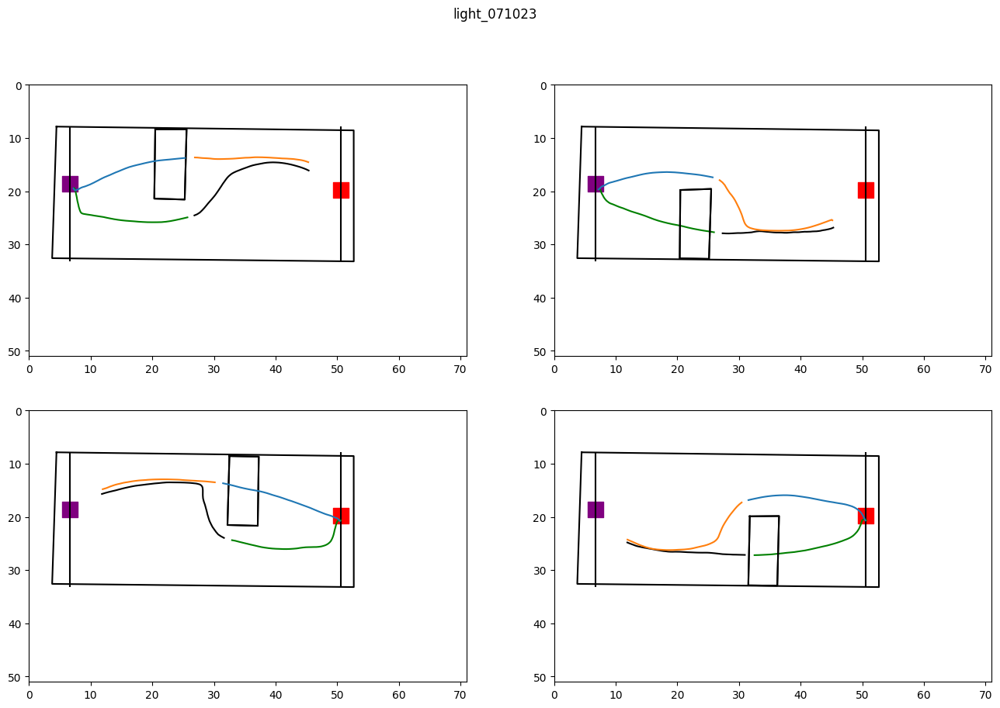

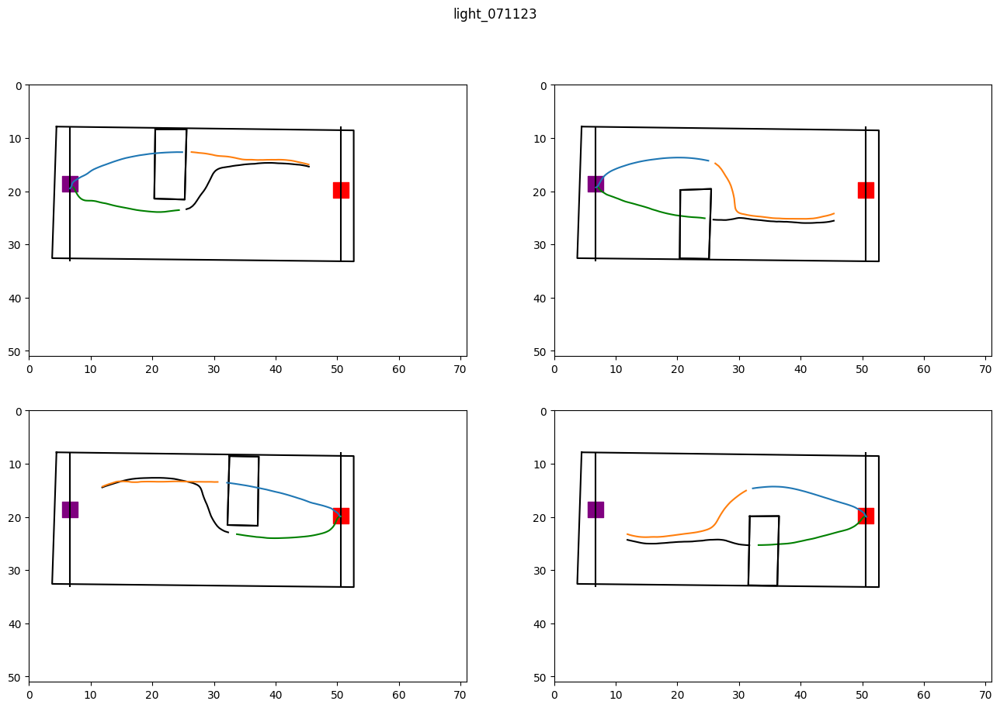

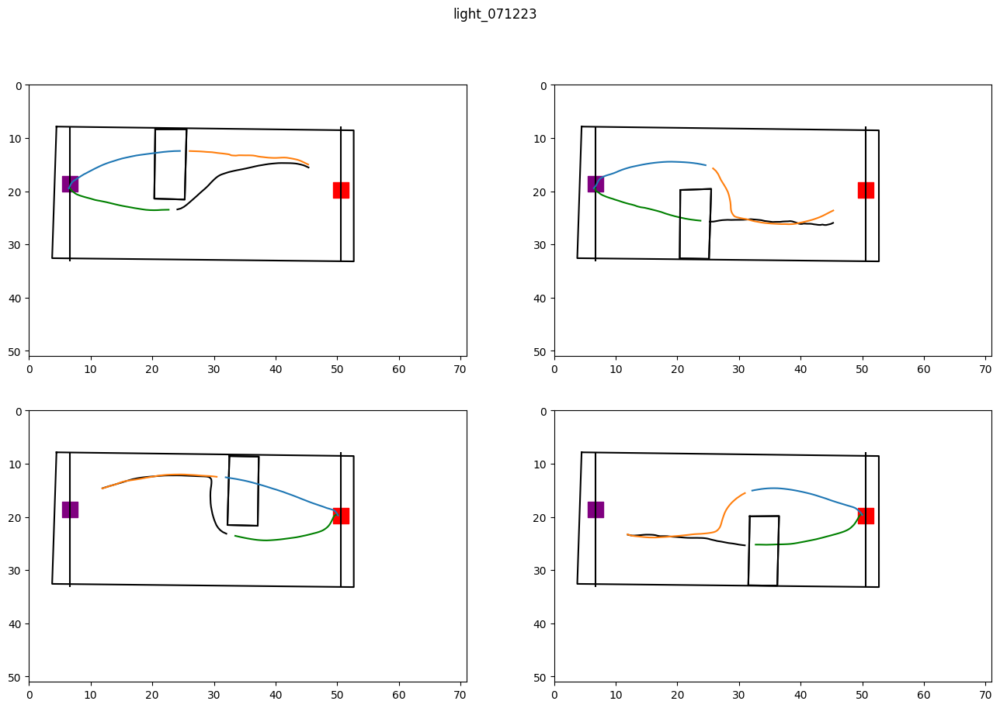

In [13]:
right = ns_dark_long
right = drop_nans_in_columns(right,'obstacle_devations')
by_date = right.groupby(['date'])
for date,date_df in by_date:

    fig,ax = plt.subplots(2,2,figsize = (16,10))

    fig.suptitle('light_' +date)
    plot_arena(right,ax[0,0])
    plot_arena(right,ax[0,1])
    plot_arena(right,ax[1,0])
    plot_arena(right,ax[1,1])
    by_start = date_df.groupby(['start'])
    for start,start_df in by_start:
        by_cluster = start_df.groupby(['obstacle_cluster'])
        for cluster,cluster_df in by_cluster:
            if cluster == 4:
                plot_obstacle(cluster_df,ax[0,1],cluster)
            if cluster == 0:
                plot_obstacle(cluster_df,ax[0,0],cluster)
            if cluster == 1:
                plot_obstacle(cluster_df,ax[1,0],cluster)
            if cluster == 5:
                plot_obstacle(cluster_df,ax[1,1],cluster)

            df = cluster_df
            if cluster == 0 and start == 'top':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[0,0].plot(ob_mean_x,ob_mean_y,color = 'black')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[0,0].plot(goal_mean_x,goal_mean_y,color = 'green')


            if cluster == 4 and start == 'top':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[0,0].plot(ob_mean_x,ob_mean_y,color = 'tab:orange')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[0,0].plot(goal_mean_x,goal_mean_y,color = 'tab:blue')


            if cluster == 4 and start == 'bottom':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[0,1].plot(ob_mean_x,ob_mean_y,color = 'tab:orange')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[0,1].plot(goal_mean_x,goal_mean_y,color = 'tab:blue')


            if cluster == 0 and start == 'bottom':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[0,1].plot(ob_mean_x,ob_mean_y,color = 'black')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[0,1].plot(goal_mean_x,goal_mean_y,color = 'green')

            if cluster == 1 and start == 'top':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[1,0].plot(ob_mean_x,ob_mean_y,color = 'black')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[1,0].plot(goal_mean_x,goal_mean_y,color = 'green')


            if cluster == 5 and start == 'top':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[1,0].plot(ob_mean_x,ob_mean_y,color = 'tab:orange')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[1,0].plot(goal_mean_x,goal_mean_y,color = 'tab:blue')

            if cluster == 1 and start == 'bottom':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[1,1].plot(ob_mean_x,ob_mean_y,color = 'black')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[1,1].plot(goal_mean_x,goal_mean_y,color = 'green')


            if cluster == 5 and start == 'bottom':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[1,1].plot(ob_mean_x,ob_mean_y,color = 'tab:orange')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[1,1].plot(goal_mean_x,goal_mean_y,color = 'tab:blue')

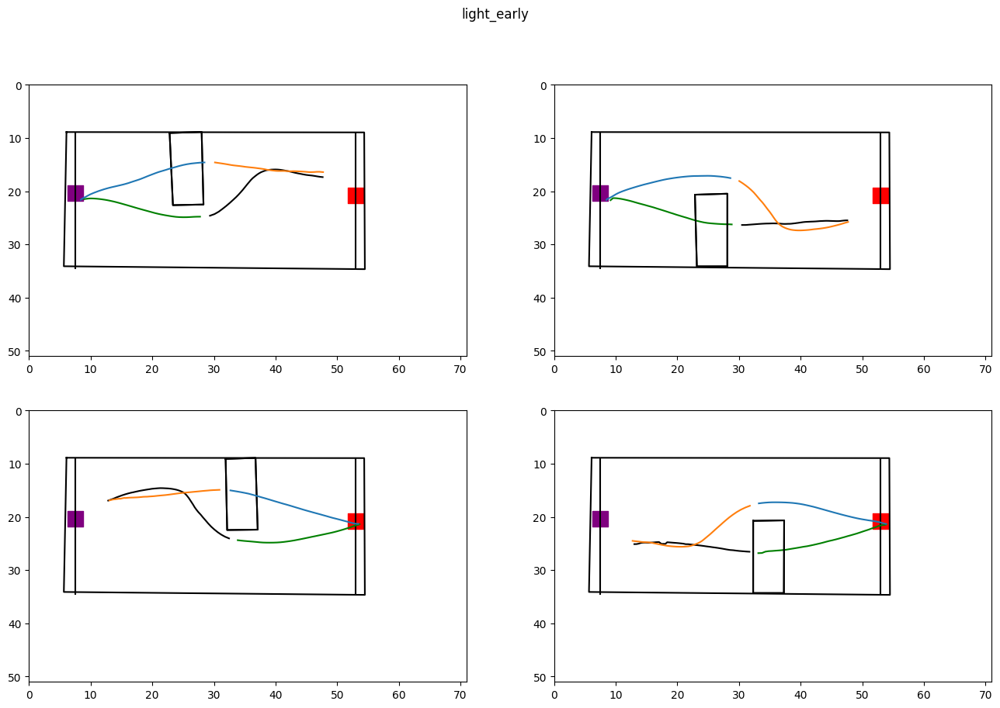

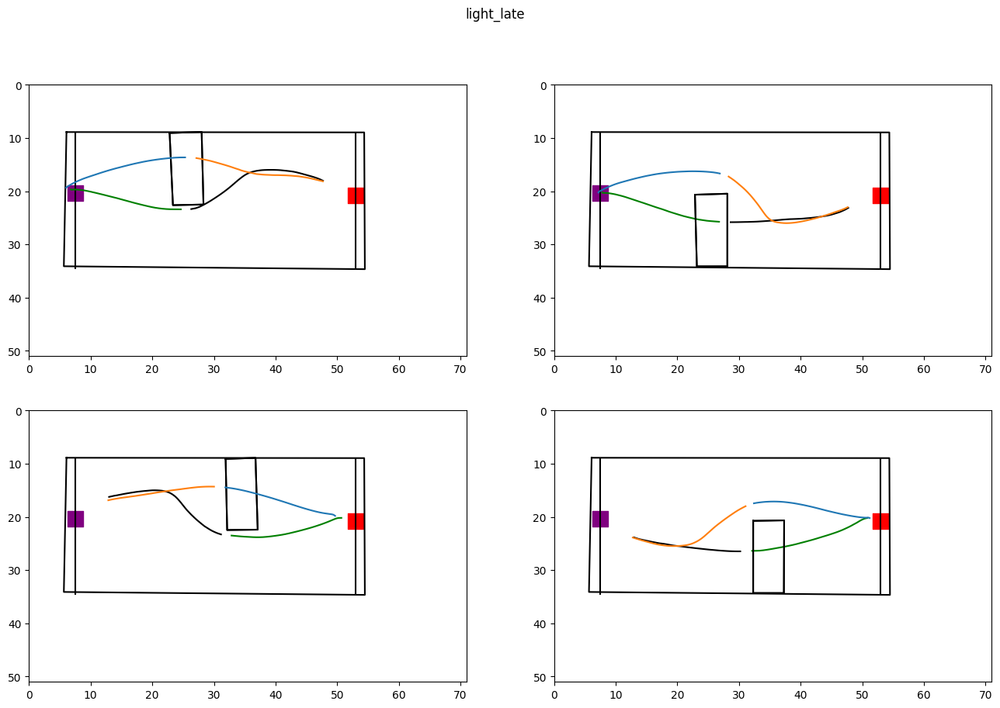

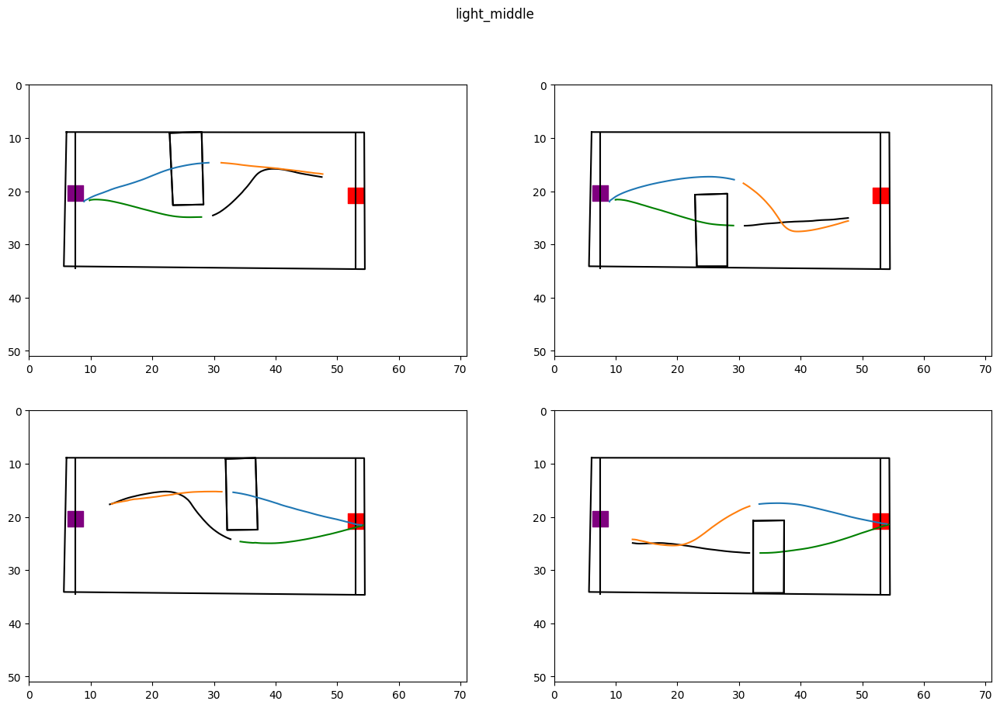

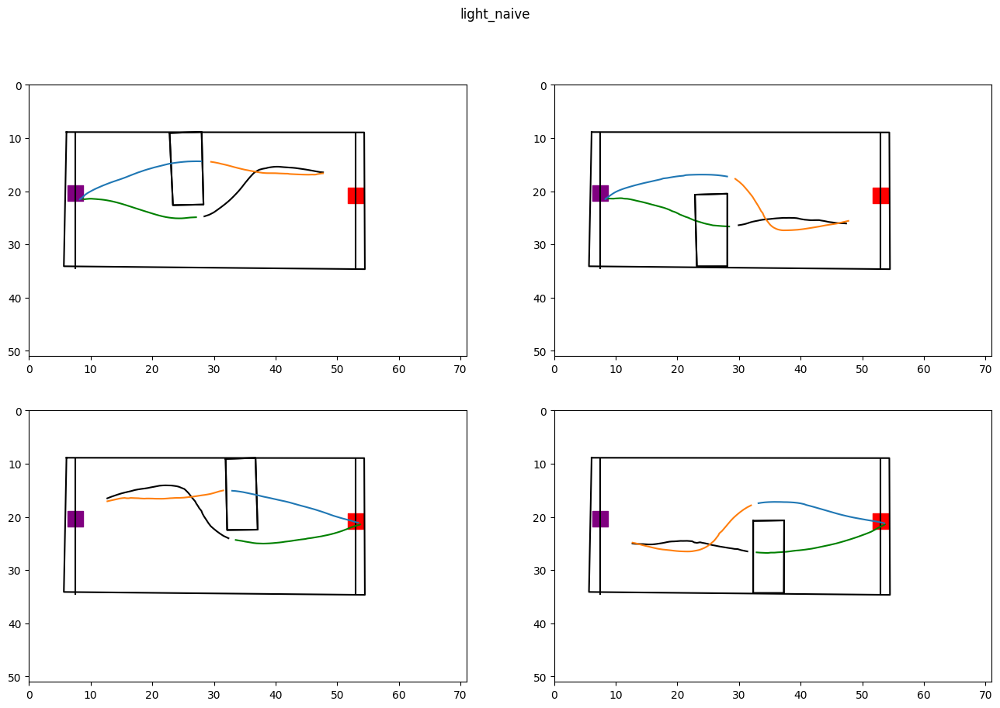

In [12]:
right = ns_oa_long
right = drop_nans_in_columns(right,'obstacle_devations')
by_date = right.groupby(['skill'])
for date,date_df in by_date:

    fig,ax = plt.subplots(2,2,figsize = (16,10))

    fig.suptitle('light_' +date)
    plot_arena(right,ax[0,0])
    plot_arena(right,ax[0,1])
    plot_arena(right,ax[1,0])
    plot_arena(right,ax[1,1])
    by_start = date_df.groupby(['start'])
    for start,start_df in by_start:
        by_cluster = start_df.groupby(['obstacle_cluster'])
        for cluster,cluster_df in by_cluster:
            if cluster == 4:
                plot_obstacle(cluster_df,ax[0,1],cluster)
            if cluster == 0:
                plot_obstacle(cluster_df,ax[0,0],cluster)
            if cluster == 1:
                plot_obstacle(cluster_df,ax[1,0],cluster)
            if cluster == 5:
                plot_obstacle(cluster_df,ax[1,1],cluster)

            df = cluster_df
            if cluster == 0 and start == 'top':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[0,0].plot(ob_mean_x,ob_mean_y,color = 'black')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[0,0].plot(goal_mean_x,goal_mean_y,color = 'green')


            if cluster == 4 and start == 'top':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[0,0].plot(ob_mean_x,ob_mean_y,color = 'tab:orange')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[0,0].plot(goal_mean_x,goal_mean_y,color = 'tab:blue')


            if cluster == 4 and start == 'bottom':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[0,1].plot(ob_mean_x,ob_mean_y,color = 'tab:orange')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[0,1].plot(goal_mean_x,goal_mean_y,color = 'tab:blue')


            if cluster == 0 and start == 'bottom':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[0,1].plot(ob_mean_x,ob_mean_y,color = 'black')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[0,1].plot(goal_mean_x,goal_mean_y,color = 'green')

            if cluster == 1 and start == 'top':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[1,0].plot(ob_mean_x,ob_mean_y,color = 'black')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[1,0].plot(goal_mean_x,goal_mean_y,color = 'green')


            if cluster == 5 and start == 'top':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[1,0].plot(ob_mean_x,ob_mean_y,color = 'tab:orange')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[1,0].plot(goal_mean_x,goal_mean_y,color = 'tab:blue')

            if cluster == 1 and start == 'bottom':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[1,1].plot(ob_mean_x,ob_mean_y,color = 'black')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[1,1].plot(goal_mean_x,goal_mean_y,color = 'green')


            if cluster == 5 and start == 'bottom':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[1,1].plot(ob_mean_x,ob_mean_y,color = 'tab:orange')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[1,1].plot(goal_mean_x,goal_mean_y,color = 'tab:blue')



           # raw = df
           # for ind,row in raw.iterrows():
           #     if cluster==4 and start=='top'  :
           #         ax[0,0].plot(row.goal_nose_x,row.goal_nose_y,color = 'tab:blue',alpha = .2)
           #         ax[0,0].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'tab:orange',alpha = .2)
           #     if cluster==4 and start=='bottom'  :
           #         ax[0,1].plot(row.goal_nose_x,row.goal_nose_y,color = 'tab:blue',alpha = .2)
           #         ax[0,1].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'tab:orange',alpha = .2)
           #     if cluster==0 and start=='bottom'  :
           #         ax[0,1].plot(row.goal_nose_x,row.goal_nose_y,color = 'green',alpha = .2)
           #         ax[0,1].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'black',alpha = .2)
           #     if cluster==0 and start=='top'  :
           #         ax[0,0].plot(row.goal_nose_x,row.goal_nose_y,color = 'green',alpha = .2)
           #         ax[0,0].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'black',alpha = .2)
           #     if cluster==1 and start=='bottom'  :
           #         ax[1,1].plot(row.goal_nose_x,row.goal_nose_y,color = 'green',alpha = .2)
           #         ax[1,1].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'black',alpha = .2)
           #     if cluster==1 and start=='top'  :
           #         ax[1,0].plot(row.goal_nose_x,row.goal_nose_y,color = 'green',alpha = .2)
           #         ax[1,0].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'black',alpha = .2)
           #     if cluster==5 and start=='bottom'  :
           #         ax[1,1].plot(row.goal_nose_x,row.goal_nose_y,color = 'tab:blue',alpha = .2)
           #         ax[1,1].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'tab:orange',alpha = .2)
           #     if cluster==5 and start=='top'  :
           #         ax[1,0].plot(row.goal_nose_x,row.goal_nose_y,color = 'tab:blue',alpha = .2)
           #         ax[1,0].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'tab:orange',alpha = .2)

In [234]:
def create_consective_df_new(df):
        """get df from data of groups of 3 trials that are consecutive """
        con_df = pd.DataFrame()
        copy = df.copy(deep=True)
        copy = copy.reset_index(drop=True)
        for animal,animal_frame in copy.groupby('animal'):
            for date, date_frame in animal_frame.groupby('date'):
                repeats_list = find_consecutive_repeats(date_frame['obstacle_cluster'])
                for i in range(len(repeats_list)):
                    check = date_frame.loc[repeats_list[i][0]:repeats_list[i][1]]
                    #print(np.diff(check['index'].to_numpy()).sum())
                    if np.diff(check['index'].to_numpy()).sum()==2:
                        trial_df = pd.DataFrame()
                        trial_df = trial_df.append(date_frame.loc[repeats_list[i][0]:repeats_list[i][1]])
                        trial_df['consective_inds'] = str(list(range(repeats_list[i][0], repeats_list[i][1]+1)))
                        trial_df['consective_num'] = [0,1,2]

                        con_df = con_df.append(trial_df) 
                    else:
                        continue
                       
        return con_df

In [235]:
con_oa = create_consective_df_new(oa_df)
con_dark = create_consective_df_new(dark_oa_df)

In [103]:
con_df = pd.DataFrame()
copy = oa_long.copy(deep=True)
copy = copy.reset_index(drop=True)
for animal,animal_frame in copy.groupby('animal'):
    for date, date_frame in animal_frame.groupby('date'):
        repeats_list = find_consecutive_repeats(date_frame['obstacle_cluster'])
        for i in range(len(repeats_list)):
            check = date_frame.loc[repeats_list[i][0]:repeats_list[i][1]]
            #print(np.diff(check['index'].to_numpy()).sum())
            if np.diff(check['index'].to_numpy()).sum()==2:
                trial_df = pd.DataFrame()
                trial_df = trial_df.append(date_frame.loc[repeats_list[i][0]:repeats_list[i][1]])
                trial_df['consective_inds'] = str(list(range(repeats_list[i][0], repeats_list[i][1]+1)))
                con_df = con_df.append(trial_df) 
            else:
                continue

In [236]:
con_oa

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,goal_basis_end_y,obstacle_devations,goal_devations,ob_tortuosity,ob_linearity,go_tortuosity,go_linearity,skill,consective_inds,consective_num
4420,1,2.0,51733.436979,51736.800371,"[51733.450265, 51733.466969, 51733.483609, 517...","[627, 628, 629, 630, 631, 632, 633, 634, 635, ...","[115.17922973632812, 114.62762451171875, 114.1...","[277.7922668457031, 277.6312561035156, 276.780...","[135.65768432617188, 135.46556091308594, 136.2...","[263.0269470214844, 263.662109375, 264.2120361...",...,21.407368,"[nan, 17.73216603002215, 27.48797017504544, 28...","[nan, 19.04624242112778, 167.9383332292366, 1....",1.394319,0.717196,1.288644,0.776010,naive,"[4420, 4421, 4422]",0
4421,2,3.0,51736.800371,51739.737318,"[51736.801395, 51736.818009, 51736.83616, 5173...","[[828, 829, 830, 831, 832, 833, 834, 835, 836,...","[690.3485717773438, 691.3297119140625, 691.859...","[272.8236999511719, 272.7662353515625, 272.574...","[674.8673706054688, 676.4848022460938, 677.831...","[268.2221984863281, 266.8993835449219, 266.997...",...,21.758821,"[nan, 82.7082061586921, 70.74915155412452, 67....","[nan, 77.41616542108095, 72.05836951701917, 74...",1.234777,0.809863,1.150185,0.869425,naive,"[4420, 4421, 4422]",1
4422,3,4.0,51739.737318,51743.403571,"[51739.752409, 51739.769945, 51739.785907, 517...","[1005, 1006, 1007, 1008, 1009, 1010, 1011, 101...","[113.86015319824219, 113.49015808105469, 113.8...","[277.7652282714844, 277.37164306640625, 276.92...","[134.6192169189453, 133.83827209472656, 134.42...","[264.1770935058594, 264.1122741699219, 263.946...",...,21.449824,"[nan, 38.34463057700683, 28.234273682415544, 3...","[nan, 25.02675241152418, 25.026752411524207, 2...",1.207442,0.828197,1.081818,0.924370,naive,"[4420, 4421, 4422]",2
4423,4,5.0,51743.403571,51748.085696,"[51743.40471, 51743.420364, 51743.437158, 5174...","[[1224, 1225, 1226, 1227, 1228, 1229, 1230, 12...","[689.9378051757812, 691.3955688476562, 691.495...","[272.37847900390625, 272.63372802734375, 273.2...","[673.7486572265625, 675.6795043945312, 677.072...","[268.76220703125, 268.4595642089844, 267.65228...",...,21.449800,"[nan, 34.46555051424477, 41.18713062798951, 41...","[nan, 32.83107534513433, 48.11808991760365, 48...",2.960203,0.337815,1.244472,0.803554,naive,"[4423, 4424, 4425]",0
4424,5,6.0,51748.085696,51750.449280,"[51748.088588, 51748.106636, 51748.122291, 517...","[1505, 1506, 1507, 1508, 1509, 1510, 1511, 151...","[112.85887908935547, 111.88679504394531, 111.8...","[272.9649353027344, 274.082763671875, 274.5699...","[135.9404296875, 135.2183380126953, 134.646545...","[267.20086669921875, 267.6318054199219, 268.02...",...,21.440680,"[nan, 39.28812093076865, 58.68368899750625, 62...","[nan, 21.82109552856958, 23.6015077134929, 22....",1.055251,0.947642,1.093029,0.914889,naive,"[4423, 4424, 4425]",1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11760,123,133.0,34040.085632,34042.555750,"[34040.09038, 34040.107046, 34040.124966, 3404...","[[23069, 23070, 23071, 23072, 23073, 23074, 23...","[663.2940063476562, 664.87744140625, 664.94000...","[265.98956298828125, 266.52752685546875, 266.9...","[650.1190795898438, 652.5831298828125, 653.266...","[259.5257873535156, 259.1162414550781, 258.676...",...,18.934346,"[nan, 80.55007310564406, 55.90781451486292, 56...","[nan, 4.332036188649652, 4.1138405978835735, 3...",1.088887,0.918369,1.019259,0.981105,late,"[11759, 11760, 11761]",1
11761,124,134.0,34042.555750,34044.993497,"[34042.557811, 34042.574515, 34042.591385, 340...","[23217, 23218, 23219, 23220, 23221, 23222, 232...","[78.57891082763672, 78.03726959228516, 77.7393...","[256.66253662109375, 256.55084228515625, 254.8...","[84.59412384033203, 84.24015808105469, 83.6739...","[256.3631286621094, 256.1745300292969, 255.352...",...,19.629408,"[nan, 5.126949698570914, 1.3261174426191749, 2...","[nan, 2.874700877762177, 2.86782390827758

In [205]:
con_dark

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,goal_basis_start_y,goal_basis_end_x,goal_basis_end_y,obstacle_devations,goal_devations,ob_tortuosity,ob_linearity,go_tortuosity,go_linearity,consective_inds
364,22,26,66198.992985,66201.631052,"[66199.000128, 66199.016947, 66199.034419, 661...","[5143, 5144, 5145, 5146, 5147, 5148, 5149, 515...","[97.67029571533203, 96.27679443359375, 96.4216...","[254.74505615234375, 254.86314392089844, 254.3...","[111.18936157226562, 110.1370849609375, 109.53...","[250.5020294189453, 250.5352020263672, 250.180...",...,30.215314,51.154768,20.554398,"[nan, 5.017474753522806, 5.028563618895965, 0....","[nan, 3.8413709472073, 0.6154037904058854, 5.1...",1.079866,0.926041,1.088616,0.918597,"[364, 365, 366]"
365,23,27,66201.631052,66203.904563,"[66201.63456, 66201.651072, 66201.667724, 6620...","[[5301, 5302, 5303, 5304, 5305, 5306, 5307, 53...","[680.4717407226562, 680.3138427734375, 681.211...","[272.8453369140625, 272.47515869140625, 272.45...","[666.2562255859375, 667.3164672851562, 668.394...","[268.30029296875, 266.2351379394531, 266.28469...",...,28.665252,7.387445,18.884484,"[nan, 44.45167751562576, 38.75294211447826, 31...","[nan, 40.005271233513746, 35.55811028897517, 3...",1.030090,0.970789,1.573229,0.635635,"[364, 365, 366]"
366,24,28,66203.904563,66205.969152,"[66203.918412, 66203.935257, 66203.952665, 662...","[5438, 5439, 5440, 5441, 5442, 5443, 5444, 544...","[98.80525970458984, 98.52615356445312, 98.5082...","[252.7589569091797, 252.75856018066406, 253.55...","[103.93075561523438, 104.03253936767578, 104.1...","[262.3072204589844, 261.89984130859375, 262.01...",...,26.307263,51.127410,20.505769,"[nan, 50.63012210001367, 53.22498374002678, 54...","[nan, 22.296577639750765, 25.408561996833164, ...",1.184572,0.844187,1.081040,0.925035,"[364, 365, 366]"
372,31,36,66224.709964,66228.089446,"[66224.725798, 66224.742476, 66224.759193, 662...","[6686, 6687, 6688, 6689, 6690, 6691, 6692, 669...","[95.10435485839844, 95.10294342041016, 94.9379...","[253.26795959472656, 253.17581176757812, 252.6...","[117.29747772216797, 116.39342498779297, 116.2...","[246.71018981933594, 247.16543579101562, 247.2...",...,17.486638,51.081603,20.765092,"[nan, 59.587433621550126, 61.77856554732494, 6...","[nan, 14.145187150523487, 15.786298261532371, ...",1.238111,0.807682,1.766814,0.565991,"[372, 373, 374]"
373,32,37,66228.089446,66230.674201,"[66228.094041, 66228.110105, 66228.126988, 662...","[[6888, 6889, 6890, 6891, 6892, 6893, 6894, 68...","[679.86962890625, 680.7517700195312, 682.08245...","[276.6849670410156, 276.9551696777344, 276.433...","[665.7922973632812, 672.9000244140625, 676.091...","[271.13330078125, 266.7198791503906, 261.61166...",...,18.910002,7.390914,18.890093,"[nan, 71.16363637224532, 65.25829382216035, 61...","[nan, 31.06801913328233, 23.733987886034175, 2...",1.259886,0.793723,1.036799,0.964507,"[372, 373, 374]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3050,156,175,56638.725017,56641.547187,"[56638.726489, 56638.742272, 56638.759104, 566...","[35823, 35824, 35825, 35826, 35827, 35828, 358...","[95.32965850830078, 95.18034362792969, 95.1661...","[259.46624755859375, 259.0491943359375, 258.55...","[99.5850601196289, 99.23958587646484, 98.97994...","[261.96929931640625, 260.8766174316406, 259.94...",...,21.546702,50.062736,19.769158,"[nan, 53.06552685408794, 65.31978212470929, 68...","[nan, 17.63976696506852, 16.952843614889606, 1...",1.420278,0.704088,1.026086,0.974577,"[3049, 3050, 3051]"
3051,157,176,56641.547187,56644.324774,"[56641.559769, 56641.57719, 56641.593267, 5664...","[[35993, 35994, 35995, 35996, 35997, 35998, 35...","[673.911865234375, 674.2533569335938, 674.6394...","[265.8172607421875, 266.4691467285156, 266.246...","[663.5034790039062, 664.7691040039062, 665.285...","[255.22454833984375, 255.9174346923828, 255.80...",...,21.819194,6.822385,19.289515,"[nan, 38.89624150

In [132]:
con_0 = con_oa[con_oa['obstacle_cluster']==0]

In [139]:
test = con_0[con_0['consective_inds']=='[4476, 4477, 4478]']

In [ ]:
df  = con_dark[con_dark['obstacle_cluster']==1]
for skill, skill_df in df.groupby(['date']):

    fig,ax = plt.subplots(2,3,figsize = (24,10))
    fig.suptitle(skill)
    for axi in ax.reshape(-1):
        plot_arena(skill_df,axi)
        plot_orginal_obstacle(skill_df,axi,skill_df.obstacle_cluster.unique()[0])
    for i in skill_df.consective_inds.unique():
        trials_df = skill_df[skill_df['consective_inds']==i]
        if trials_df.iloc[0].odd == 'right':
            for j,row in enumerate(trials_df.iterrows()):
                if row[1].start == 'top':
                    ax[0,j].plot(row[1].ts_nose_x_cm,row[1].ts_nose_y_cm,c = 'red')
                else:
                    ax[0,j].plot(row[1].ts_nose_x_cm,row[1].ts_nose_y_cm,c = 'black')
        else:
            for j,row in enumerate(trials_df.iterrows()):
                if row[1].start == 'top':
                    ax[1,j].plot(row[1].ts_nose_x_cm,row[1].ts_nose_y_cm,c = 'red')
                else:
                    ax[1,j].plot(row[1].ts_nose_x_cm,row[1].ts_nose_y_cm,c = 'black')


: 

In [214]:
np.random.choice(skill_df.consective_inds.unique(), size=3, replace=False)

array(['[2751, 2752, 2753]', '[3042, 3043, 3044]', '[2976, 2977, 2978]'],
      dtype=object)

In [213]:
skill_df.consective_inds.unique()

array(['[2751, 2752, 2753]', '[2789, 2790, 2791]', '[2611, 2612, 2613]',
       '[2644, 2645, 2646]', '[2667, 2668, 2669]', '[3069, 3070, 3071]',
       '[3110, 3111, 3112]', '[3131, 3132, 3133]', '[2883, 2884, 2885]',
       '[2839, 2840, 2841]', '[2945, 2946, 2947]', '[2954, 2955, 2956]',
       '[2976, 2977, 2978]', '[2997, 2998, 2999]', '[3042, 3043, 3044]'],
      dtype=object)

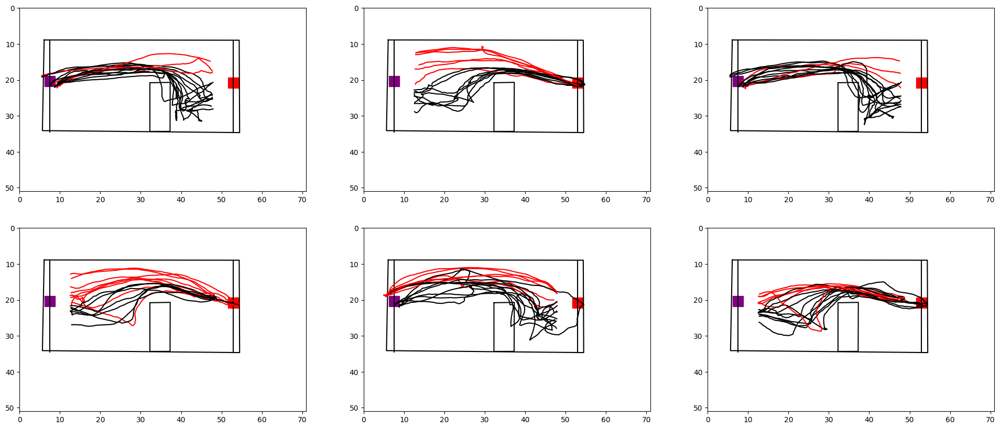

In [284]:
df  = con_oa[con_oa['obstacle_cluster']==5]
fig,ax = plt.subplots(2,3,figsize = (24,10))

for axi in ax.reshape(-1):
    plot_arena(df,axi)
    plot_orginal_obstacle(df,axi,df.obstacle_cluster.unique()[0])
for i in np.random.choice(df.consective_inds.unique(), size=30, replace=False):
    trials_df = df[df['consective_inds']==i]
    if trials_df.iloc[0].odd == 'right':
        for j,row in enumerate(trials_df.iterrows()):
            if row[1].start == 'top':
                ax[0,j].plot(row[1].ts_nose_x_cm,row[1].ts_nose_y_cm,c = 'red')
            else:
                ax[0,j].plot(row[1].ts_nose_x_cm,row[1].ts_nose_y_cm,c = 'black')
    else:
        for j,row in enumerate(trials_df.iterrows()):
            if row[1].start == 'top':
                ax[1,j].plot(row[1].ts_nose_x_cm,row[1].ts_nose_y_cm,c = 'red')
            else:
                ax[1,j].plot(row[1].ts_nose_x_cm,row[1].ts_nose_y_cm,c = 'black')

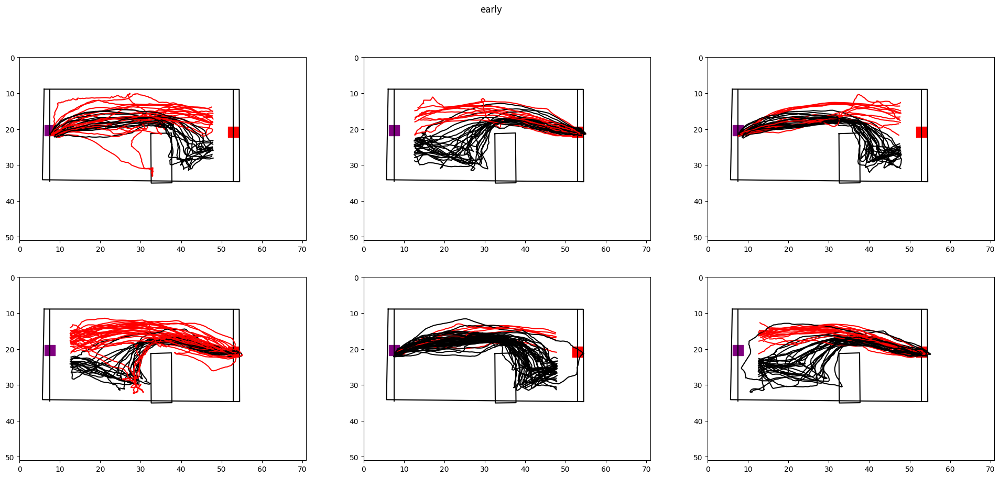

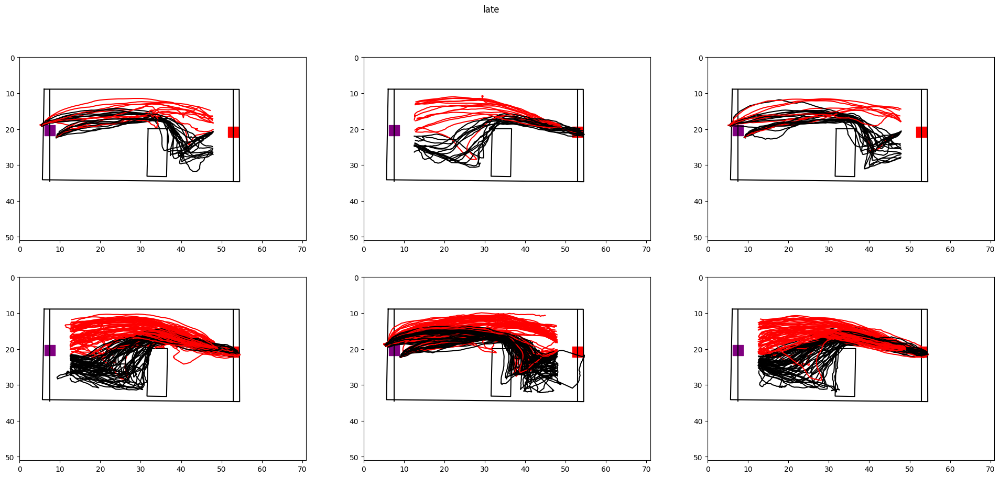

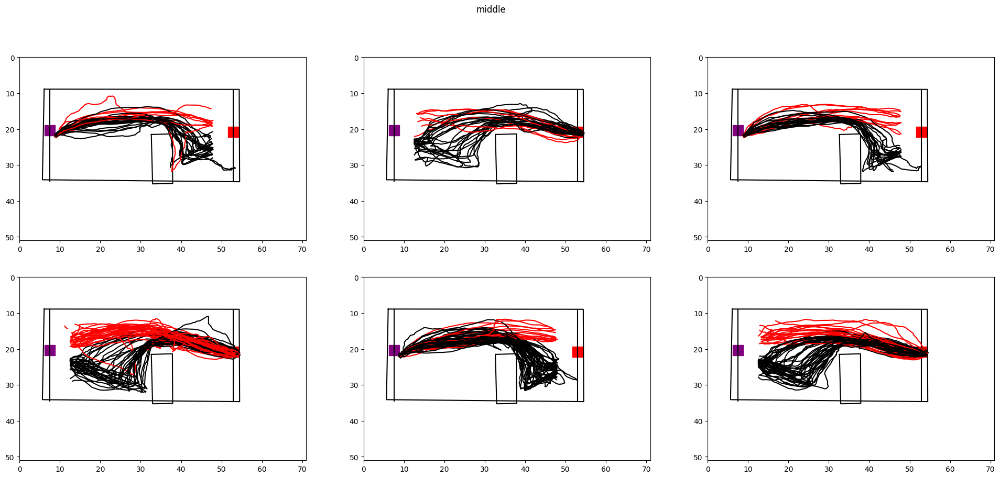

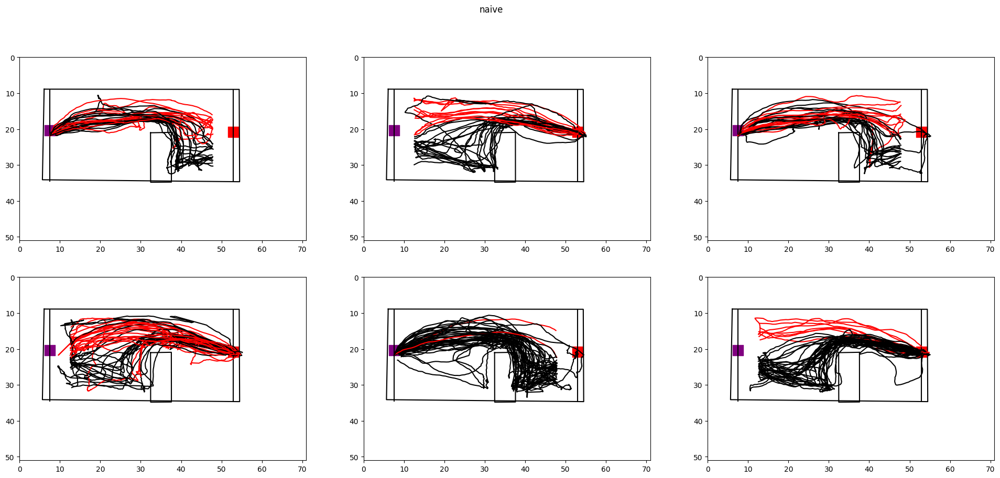

In [285]:
df  = con_oa[con_oa['obstacle_cluster']==5]
for skill, skill_df in df.groupby(['skill']):

    fig,ax = plt.subplots(2,3,figsize = (24,10))
    fig.suptitle(skill)
    for axi in ax.reshape(-1):
        plot_arena(skill_df,axi)
        plot_orginal_obstacle(skill_df,axi,skill_df.obstacle_cluster.unique()[0])
    #for i in np.random.choice(skill_df.consective_inds.unique(), size=30, replace=False):
    for i in skill_df.consective_inds.unique():
        trials_df = skill_df[skill_df['consective_inds']==i]
        if trials_df.iloc[0].odd == 'right':
            for j,row in enumerate(trials_df.iterrows()):
                if row[1].start == 'top':
                    ax[0,j].plot(row[1].ts_nose_x_cm,row[1].ts_nose_y_cm,c = 'red')
                else:
                    ax[0,j].plot(row[1].ts_nose_x_cm,row[1].ts_nose_y_cm,c = 'black')
        else:
            for j,row in enumerate(trials_df.iterrows()):
                if row[1].start == 'top':
                    ax[1,j].plot(row[1].ts_nose_x_cm,row[1].ts_nose_y_cm,c = 'red')
                else:
                    ax[1,j].plot(row[1].ts_nose_x_cm,row[1].ts_nose_y_cm,c = 'black')

            
           





   
      
    



In [237]:
con_oa[(con_oa['skill']=='late') &(con_oa['obstacle_cluster']==0) ]

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,goal_basis_end_y,obstacle_devations,goal_devations,ob_tortuosity,ob_linearity,go_tortuosity,go_linearity,skill,consective_inds,consective_num
9038,8,8.0,45937.627571,45939.794560,"[45937.632064, 45937.649766, 45937.665484, 459...","[1864, 1865, 1866, 1867, 1868, 1869, 1870, 187...","[71.91383361816406, 72.91688537597656, 73.0786...","[257.2359313964844, 257.9974670410156, 257.287...","[89.94235229492188, 90.50008392333984, 91.0998...","[254.77003479003906, 255.17471313476562, 254.6...",...,19.598016,"[nan, 2.4068813160797213, 2.79015191264788, 0....","[nan, 45.9872284778799, 43.966994665043735, 36...",1.004763,0.995259,1.050666,0.951777,late,"[9038, 9039, 9040]",0
9039,9,9.0,45939.794560,45942.121254,"[45939.799859, 45939.816409, 45939.834009, 459...","[[1994, 1995, 1996, 1997, 1998, 1999, 2000, 20...","[660.4149169921875, 661.2981567382812, 661.387...","[264.35223388671875, 265.5616455078125, 265.20...","[644.20166015625, 646.3103637695312, 647.02526...","[256.4029846191406, 257.1985778808594, 257.470...",...,19.135799,"[nan, 50.962659296352506, 44.59102725622446, 4...","[nan, 8.315780187970391, 7.833411893586071, 7....",1.196812,0.835553,1.035470,0.965745,late,"[9038, 9039, 9040]",1
9040,10,10.0,45942.121254,45944.447872,"[45942.133593, 45942.150668, 45942.167372, 459...","[2134, 2135, 2136, 2137, 2138, 2139, 2140, 214...","[79.9565200805664, 79.15933227539062, 79.04382...","[258.01763916015625, 257.66973876953125, 256.5...","[86.40315246582031, 85.46745300292969, 84.1047...","[259.37744140625, 259.45050048828125, 259.7621...",...,19.804212,"[nan, 1.1879150110670658, 1.4179165025222895, ...","[nan, 16.63453056416149, 14.944225994367647, 1...",1.001866,0.998137,1.018189,0.982136,late,"[9038, 9039, 9040]",2
9059,32,32.0,45997.380992,45999.302169,"[45997.386201, 45997.402905, 45997.419648, 459...","[5448, 5449, 5450, 5451, 5452, 5453, 5454, 545...","[74.2301025390625, 74.40645599365234, 74.55317...","[259.1195983886719, 260.0742492675781, 259.692...","[85.4162826538086, 85.37340545654297, 85.38877...","[256.3214111328125, 256.7225036621094, 256.546...",...,19.759336,"[nan, 40.274352973078166, 25.300532791681338, ...","[nan, 28.51418249894819, 28.51418249894819, 27...",1.066072,0.938023,1.050592,0.951844,late,"[9059, 9060, 9061]",0
9060,33,33.0,45999.302169,46001.813273,"[45999.303488, 45999.32078, 45999.337024, 4599...","[[5563, 5564, 5565, 5566, 5567, 5568, 5569, 55...","[660.5672607421875, 661.294189453125, 661.9236...","[266.60284423828125, 266.552734375, 266.963470...","[643.55712890625, 645.5770263671875, 646.98553...","[261.51031494140625, 260.5938720703125, 260.14...",...,19.220509,"[nan, 27.633307055737514, 27.944887396923406, ...","[nan, 14.23294666700676, 14.815807828281315, 9...",1.255859,0.796268,1.036044,0.965210,late,"[9059, 9060, 9061]",1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11721,73,79.0,33877.145088,33879.967500,"[33877.150566, 33877.16736, 33877.184704, 3387...","[[13296, 13297, 13298, 13299, 13300, 13301, 13...","[663.6260375976562, 664.2550659179688, 664.546...","[265.9091796875, 265.3763122558594, 265.359436...","[649.2998046875, 650.4547729492188, 650.964599...","[258.4216613769531, 257.5831604003906, 256.890...",...,18.898498,"[nan, 77.30037392091066, 62.23808235033123, 62...","[nan, 9.642223962336484, 7.224957366345953, 3....",1.077713,0.927890,1.044320,0.957561,late,"[11720, 11721, 11722]",1
11722,74,80.0,33879.967500,33882.179558,"[33879.969267, 33879.984908, 33880.001651, 338...","[13465, 13466, 13467, 13468, 13469, 13470, 134...","[78.251953125, 77.65413665771484, 77.484725952...","[256.2657470703125, 255.87034606933594, 255.72...","[86.33631134033203, 84.72282409667969, 84.3138...","[253.55252075195312, 254.8681182861328, 255.28...",...,19.640780,"[nan, 5.551721533240898, 1.5666332657914241, 3...","[nan, 25.120025122775424, 19.83895857261032,

In [232]:
con_oa.start.to_numpy()

array(['bottom', 'bottom', 'bottom', ..., 'top', 'bottom', 'top'],
      dtype=object)

In [ ]:
con_oa['ob_linearity'][(con_oa['consective_num']==0) & (con_oa['obstacle_cluster']==0)&(con_oa['skill']=='naive')&(con_oa['odd']=='right')].hist(bins=5)

In [331]:
test_naive = con_oa_long[(con_oa_long['ob_linearity']>.8)& (con_oa['skill']=='naive')]

test_late = con_oa_long[(con_oa_long['ob_linearity']>.8)& (con_oa['skill']=='late')]


In [334]:
con_oa['skill']=='naive'

4420      True
4421      True
4422      True
4423      True
4424      True
         ...  
11760    False
11761    False
11766    False
11767    False
11768    False
Name: skill, Length: 6135, dtype: bool

In [339]:
len(con_oa_long['skill']=='naive')

2398

In [346]:
test_naive.groupby(['consective_num']).count()/sum(con_oa_long['skill']=='naive')

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,goal_basis_end_x,goal_basis_end_y,obstacle_devations,goal_devations,ob_tortuosity,ob_linearity,go_tortuosity,go_linearity,skill,consective_inds
consective_num,,,,,,,,,,,,,,,,,,,,,
0,0.165289,0.165289,0.165289,0.165289,0.165289,0.165289,0.165289,0.165289,0.165289,0.165289,...,0.165289,0.165289,0.165289,0.165289,0.165289,0.165289,0.165289,0.165289,0.165289,0.165289
1,0.148760,0.148760,0.148760,0.148760,0.148760,0.148760,0.148760,0.148760,0.148760,0.148760,...,0.148760,0.148760,0.148760,0.148760,0.148760,0.148760,0.148760,0.148760,0.148760,0.148760
2,0.201102,0.201102,0.201102,0.201102,0.201102,0.201102,0.201102,0.201102,0.201102,0.201102,...,0.201102,0.201102,0.201102,0.201102,0.201102,0.201102,0.201102,0.201102,0.201102,0.201102


In [347]:
test_late.groupby(['consective_num']).count()/sum(con_oa_long['skill']=='middle')

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,goal_basis_end_x,goal_basis_end_y,obstacle_devations,goal_devations,ob_tortuosity,ob_linearity,go_tortuosity,go_linearity,skill,consective_inds
consective_num,,,,,,,,,,,,,,,,,,,,,
0,0.389545,0.389545,0.389545,0.389545,0.389545,0.389545,0.389545,0.389545,0.389545,0.389545,...,0.389545,0.389545,0.389545,0.389545,0.389545,0.389545,0.389545,0.389545,0.389545,0.389545
1,0.269815,0.269815,0.269815,0.269815,0.269815,0.269815,0.269815,0.269815,0.269815,0.269815,...,0.269815,0.269815,0.269815,0.269815,0.269815,0.269815,0.269815,0.269815,0.269815,0.269815
2,0.436762,0.436762,0.436762,0.436762,0.436762,0.436762,0.436762,0.436762,0.436762,0.436762,...,0.436762,0.436762,0.436762,0.436762,0.436762,0.436762,0.436762,0.436762,0.436762,0.436762


In [342]:
sum(con_oa_long['skill']=='late')

910

In [320]:
test.groupby(['consective_num']).count()

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,goal_basis_end_x,goal_basis_end_y,obstacle_devations,goal_devations,ob_tortuosity,ob_linearity,go_tortuosity,go_linearity,skill,consective_inds
consective_num,,,,,,,,,,,,,,,,,,,,,
0,457,457,457,457,457,457,457,457,457,457,...,457,457,457,457,457,457,457,457,457,457
1,402,402,402,402,402,402,402,402,402,402,...,402,402,402,402,402,402,402,402,402,402
2,334,334,334,334,334,334,334,334,334,334,...,334,334,334,334,334,334,334,334,334,334


In [363]:
for i in clusters:
    print(len(i))

90
26
2


In [516]:
from dipy.tracking.streamline import set_number_of_points
from scipy.spatial.distance import cdist

In [810]:
streamline_distances = []
for streamline in streamlines:
    distances = mean_euclidean_distance(streamline, clusters.centroids[0])  # Calculate distances from the streamline to all centroids
        # Find the minimum distance
    streamline_distances.append(distances)


In [760]:
from dipy.segment.featurespeed import ResampleFeature
from dipy.segment.metricspeed import *

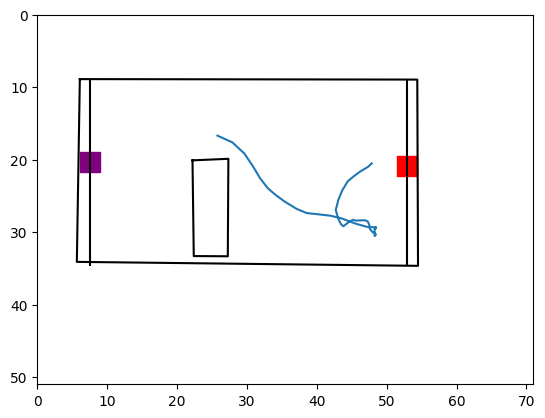

In [1005]:
fix,ax = plt.subplots()
plot_arena(data,ax)
plot_orginal_obstacle(data,ax,cluster)
for i in high_distance:
    plt.plot(matx[i],maty[i])

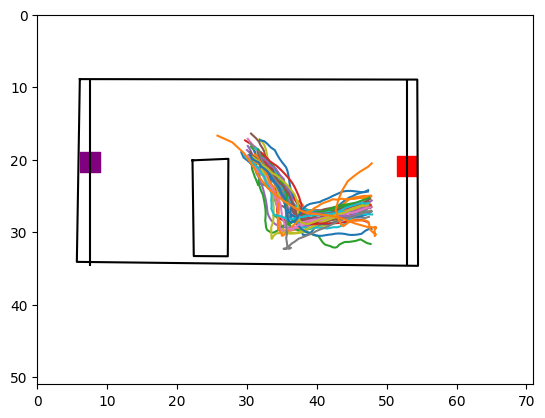

In [995]:
fix,ax = plt.subplots()
plot_arena(data,ax)
plot_orginal_obstacle(data,ax,cluster)
for i in clusters[-1].indices:
    plt.plot(matx[i],maty[i])

In [968]:
all_distances = []
for i in list(range(len(clusters))):
    streamline_distances = mean_euclidean_distance([streamlines[x] for x in clusters[i].indices], clusters.centroids[i])
    interpolate_array(streamline_distances)
    all_distances.append(streamline_distances)
np.nanmean(np.concatenate(all_distances).ravel().tolist())

1.9418319109702145

In [969]:
all_distances

[array([2.09326437, 1.93477726, 1.18621968, 2.03134825, 1.58594197,
        2.45275981, 1.9144443 , 2.81681147, 2.27200361, 1.99663327,
        2.46146352, 1.67312399, 1.57751251]),
 array([4.63022494, 3.77388143, 4.02267756, 0.75811752, 1.27169629,
        4.79584394, 3.03628035, 3.04179083, 3.36951194, 2.67852318,
        3.40714855, 2.36744247, 2.30134047, 1.9252337 , 1.40640272,
        1.94871352, 1.75295851, 2.16966992, 2.0492628 , 1.92885567,
        2.86941964, 2.19090257, 0.83728589, 1.95298578, 2.2590273 ,
        1.80295663, 1.91685448, 2.47997063, 5.11961702, 1.38523163,
        3.13260574, 2.54206721, 1.67114107, 1.97645123, 1.13229775,
        2.67504752, 1.24919533, 1.53456059, 1.36753164, 0.84848062,
        1.35520225, 0.86442576, 0.73816184, 1.25440443, 1.66940041,
        0.86895804, 1.36300509, 2.49884207, 2.06537354, 1.44201413,
        1.52464105, 1.34060928, 1.22309083, 1.43067814, 4.45242975,
        1.23739156, 1.36446976, 1.31843884, 1.06728687, 5.51534113,
  

In [1007]:

streamline_distances = []
for streamline in [streamlines[x] for x in clusters[0].indices]:
    distances = mean_euclidean_distance(streamline, clusters.centroids[0])  # Calculate distances from the streamline to all centroids
        # Find the minimum distance
    streamline_distances.append(distances)


In [1009]:
all_distances = []
for i in list(range(len(clusters))):
    streamline_distances = mean_euclidean_distance([streamlines[x] for x in clusters[i].indices], clusters.centroids[i])
    interpolate_array(streamline_distances)
    all_distances.append(streamline_distances)
np.nanmean(np.concatenate(all_distances).ravel().tolist())

1.9418319109702145

In [1265]:
list(range(len(clusters.get_small_clusters(1))))

[]

In [1276]:
clusters.get_small_clusters(1)[0]

Cluster([8])

In [1278]:
i

3

In [1277]:
clusters.remove_cluster(clusters.get_small_clusters(1)[i])

IndexError: list index out of range

In [1279]:
clusters.get_small_clusters(1)

[Cluster([8])]

In [1274]:
list(range(len(clusters.get_small_clusters(1))))

[0]

In [1287]:
clusters

ClusterMap([[0, 1, 2, 3, 5, 7, 10, 19, 23, 36], [4, 6, 9, 11, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44], [8]])

In [1286]:
clusters = qb.cluster(streamlines)

In [1326]:
cluster = 1
skill = '071123'
data = dark_long[(dark_long['obstacle_cluster']==cluster) &(dark_long['date']==skill) ]
streamlines,matx,maty = create_streamlines(data)
#cluster_streamlines(streamlines, num_cluster = 4,threshold = 2)

In [1334]:
clusters.clusters

[Cluster([0, 1, 9, 16, 19, 21, 25, 27, 50, 65]),
 Cluster([2, 4, 6, 7, 20, 28, 29, 30, 31, 32, 34, 37, 38, 39, 41, 42, 43, 44, 45, 51, 52, 54, 55, 59, 60, 63, 64, 67]),
 Cluster([3, 14, 22, 23, 24, 26, 35, 40, 47, 53, 62, 68, 69, 70, 71]),
 Cluster([5, 8, 10, 11, 12, 13, 15, 17, 18, 33, 36, 46, 48, 49, 56, 57, 58, 61, 66])]

In [1342]:
clusters.get_small_clusters(15)[0]

Cluster([0, 1, 9, 16, 19, 21, 25, 27, 50, 65])

In [1341]:
for i in clusters.get_small_clusters(15):
    print(i)
                                     

[0, 1, 9, 16, 19, 21, 25, 27, 50, 65]
[3, 14, 22, 23, 24, 26, 35, 40, 47, 53, 62, 68, 69, 70, 71]


In [1340]:
clusters.remove_cluster(clusters.get_small_clusters(15))

ValueError: list.remove(x): x not in list

In [1264]:
for i in list(range(len(clusters.get_small_clusters(1)))):
            clusters.remove_cluster(clusters.get_small_clusters(1)[i])

In [1852]:
def create_streamlines(df):
    """input df of a single cluster"""
    _,matx = get_mean_of_df(df,'obstacle_nose_x',50,matx=True)
    _,maty = get_mean_of_df(df,'obstacle_nose_y',50,matx=True)

    cluster_array = []

    for i in list(range(len(matx))):
        trial_array = pair_elements(matx[i],maty[i])
        cluster_array.append(trial_array)
    streamlines = cluster_array

    return streamlines,matx,maty

def cluster_streamlines(streamlines, num_cluster = 4,threshold = 2):
    feature = ResampleFeature(nb_points=50)
    metric = AveragePointwiseEuclideanMetric(feature)
    qb = QuickBundles(max_nb_clusters = num_cluster ,threshold=threshold,metric =metric )
    clusters = qb.cluster(streamlines)
    if len(clusters.get_small_clusters(5)) >=1:
        for i in list(range(len(clusters.get_small_clusters(5)))):
            clusters.remove_cluster(clusters.get_small_clusters(5)[0])
    else:
        None
    #clusters = sorted(clusters, key=len, reverse=True)

    return clusters
def create_cluster_distances(streamlines,clusters):
    cluster_distances = []
    for i in list(range(len(clusters))):
        streamline_distances = mean_euclidean_distance([streamlines[x] for x in clusters[i].indices], clusters.centroids[i])
        interpolate_array(streamline_distances)
        cluster_distances.append(streamline_distances)
    return cluster_distances


def create_cluster_dict(df, Date=False, Skill=False):
    if Date == True:
        var = 'date'
    else:
        var = 'skill'
    streamlines,matx,maty = create_streamlines(df)
    clusters = cluster_streamlines(streamlines)
    cluster_distances = create_cluster_distances(streamlines,clusters)
    
    cluster_dict = dict(type = df[var].unique(),obstacle_cluster= df['obstacle_cluster'].unique() ,cluster_object = clusters,obstalce_nose_x = matx, obstacle_nose_y = maty,cluster_distances = cluster_distances, dataframe = df)
    return cluster_dict

def flatten_list_of_arrays(array_list):
    flatten_array_list = np.concatenate(array_list).ravel().tolist()
    return np.asarray(flatten_array_list)
        


    



In [1422]:
streamlines,matx,maty = create_streamlines(data)
clusters = cluster_streamlines(streamlines)
clusters.get_small_clusters(4)

[]
[]


TypeError: only integer scalar arrays can be converted to a scalar index

In [1380]:
del dict

In [1144]:
streamlines,matx,maty = create_streamlines(data)
clusters = cluster_streamlines(streamlines)

29
76
22
30


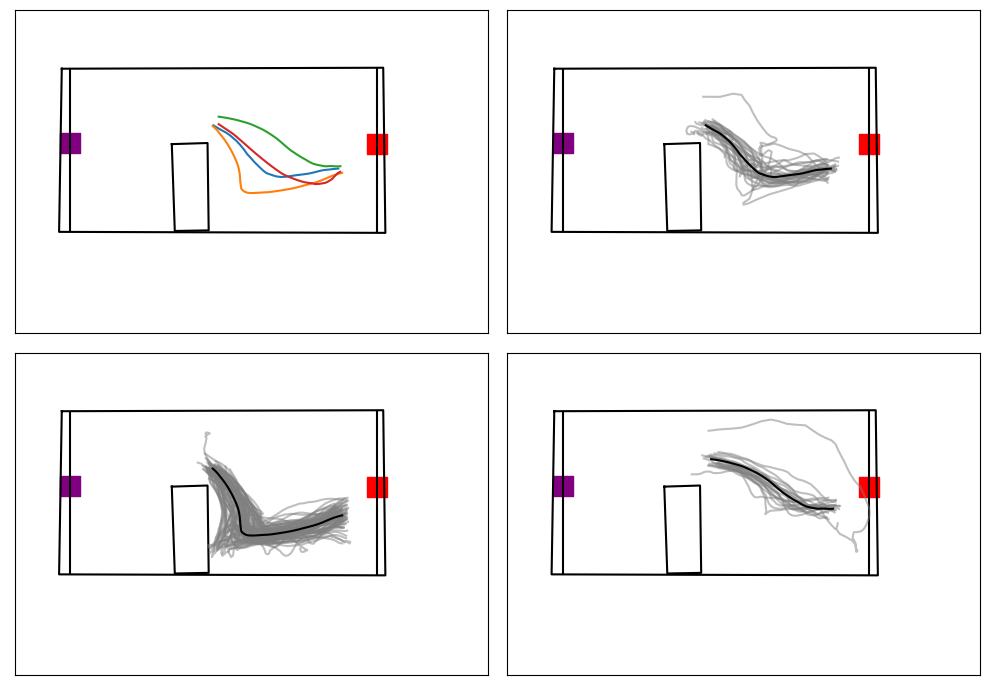

In [1862]:
cluster = 4
skill = 'early'
data = oa_long[(oa_long['obstacle_cluster']==cluster) &(oa_long['skill']==skill) ]
fig,axs = plt.subplots(2,2, figsize = (10,7),tight_layout =True)
for ax in axs.reshape(-1):
    ax.set_xticks([], [])
    ax.set_yticks([], [])
    plot_arena(data,ax,obstacle=False)
    plot_orginal_obstacle(data,ax,cluster)
streamlines,matx,maty = create_streamlines(data)
clusters = cluster_streamlines(streamlines)
for i in clusters:
    print(len(i))



for i in list(range(len(clusters.centroids))):
    axs[0,0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1])

for ind in clusters[0].indices:
    axs[0,1].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
axs[0,1].plot(clusters.centroids[0][:,0],clusters.centroids[0][:,1],c = 'black')

for ind in clusters[1].indices:
    axs[1,0].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
axs[1,0].plot(clusters.centroids[1][:,0],clusters.centroids[1][:,1],c = 'black')

for ind in clusters[2].indices:
    axs[1,1].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
axs[1,1].plot(clusters.centroids[2][:,0],clusters.centroids[2][:,1],c = 'black')

42
49
77
14


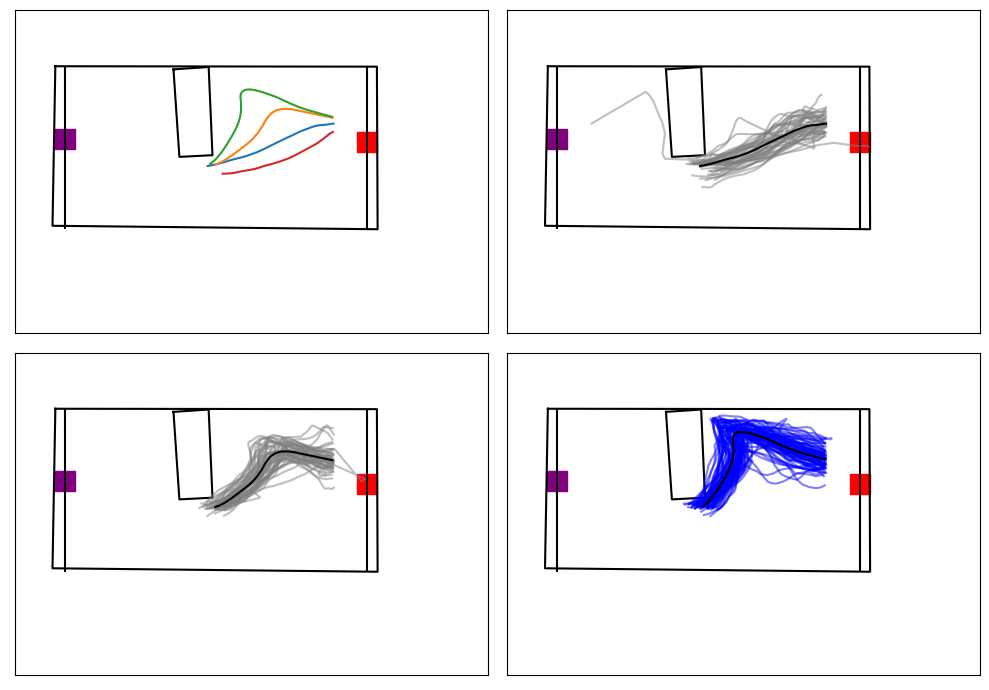

In [1391]:
cluster = 0
skill = 'middle'
data = oa_long[(oa_long['obstacle_cluster']==cluster) &(oa_long['skill']==skill) ]
fig,axs = plt.subplots(2,2, figsize = (10,7),tight_layout =True)
for ax in axs.reshape(-1):
    ax.set_xticks([], [])
    ax.set_yticks([], [])
    plot_arena(data,ax,obstacle=False)
    plot_orginal_obstacle(data,ax,cluster)
streamlines,matx,maty = create_streamlines(data)
clusters = cluster_streamlines(streamlines)
for i in clusters:
    print(len(i))



for i in list(range(len(clusters.centroids))):
    axs[0,0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1])

for ind in clusters[0].indices:
    axs[0,1].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
axs[0,1].plot(clusters.centroids[0][:,0],clusters.centroids[0][:,1],c = 'black')

for ind in clusters[1].indices:
    axs[1,0].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
axs[1,0].plot(clusters.centroids[1][:,0],clusters.centroids[1][:,1],c = 'black')

for ind in clusters[2].indices:
    axs[1,1].plot(matx[ind],maty[ind],c = 'blue',alpha = .5)
axs[1,1].plot(clusters.centroids[2][:,0],clusters.centroids[2][:,1],c = 'black')

96
38
157
6


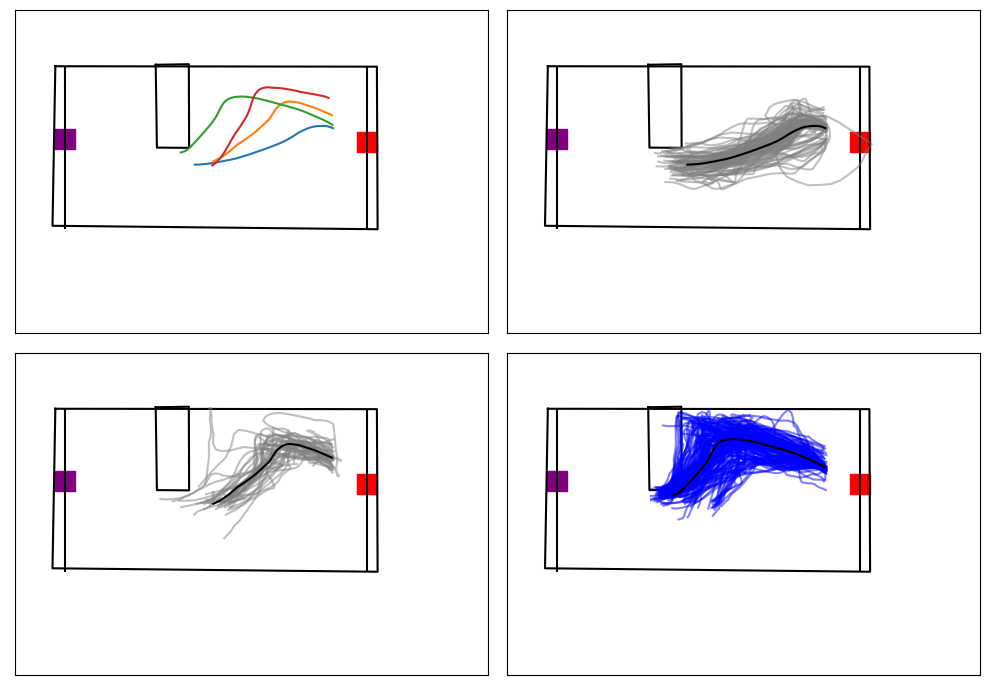

In [1390]:
cluster = 0
skill = 'late'
data = oa_long[(oa_long['obstacle_cluster']==cluster) &(oa_long['skill']==skill) ]
fig,axs = plt.subplots(2,2, figsize = (10,7),tight_layout =True)
for ax in axs.reshape(-1):
    ax.set_xticks([], [])
    ax.set_yticks([], [])
    plot_arena(data,ax,obstacle=False)
    plot_orginal_obstacle(data,ax,cluster)
streamlines,matx,maty = create_streamlines(data)
clusters = cluster_streamlines(streamlines)
for i in clusters:
    print(len(i))



for i in list(range(len(clusters.centroids))):
    axs[0,0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1])

for ind in clusters[0].indices:
    axs[0,1].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
axs[0,1].plot(clusters.centroids[0][:,0],clusters.centroids[0][:,1],c = 'black')

for ind in clusters[1].indices:
    axs[1,0].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
axs[1,0].plot(clusters.centroids[1][:,0],clusters.centroids[1][:,1],c = 'black')

for ind in clusters[2].indices:
    axs[1,1].plot(matx[ind],maty[ind],c = 'blue',alpha = .5)
axs[1,1].plot(clusters.centroids[2][:,0],clusters.centroids[2][:,1],c = 'black')

17
3
15
16
3
13
10
8


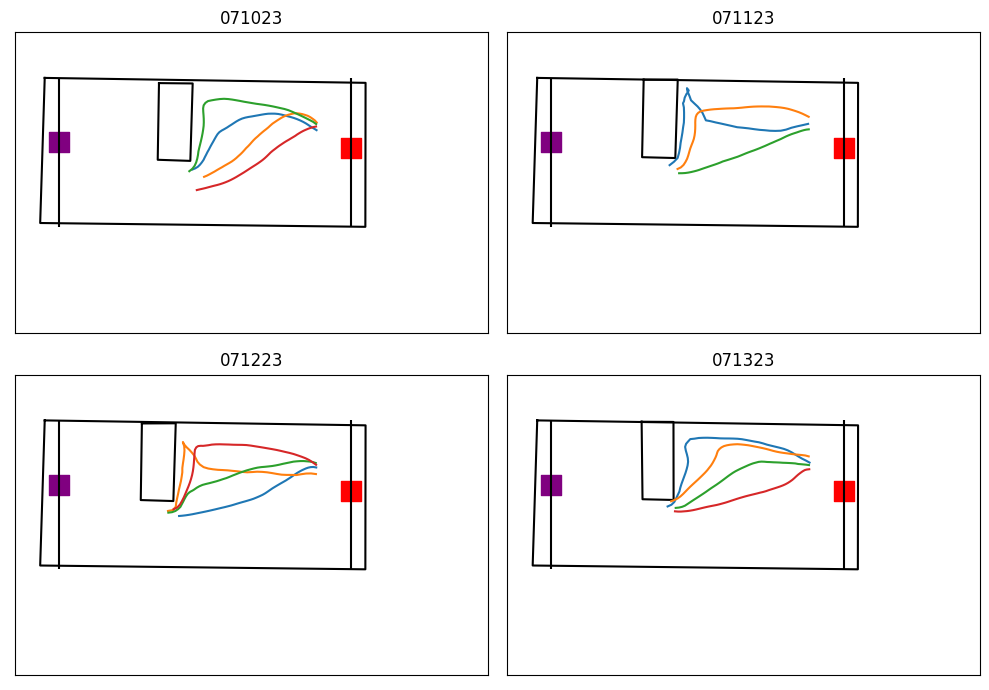

In [1176]:
cluster = 0

data = dark_long[(dark_long['obstacle_cluster']==cluster) ]
fig,axs = plt.subplots(2,2, figsize = (10,7),tight_layout =False)
for skill,skill_df in data.groupby(['date']):
    for ax in axs.reshape(-1):
        ax.set_xticks([], [])
        ax.set_yticks([], [])
        #plot_arena(data,ax,obstacle=False)
    if skill == '071023':
        axs[0,0].set_title(skill)
        plot_arena(skill_df,axs[0,0],obstacle=False)
        plot_orginal_obstacle(skill_df,axs[0,0],cluster=cluster)
        streamlines,matx,maty = create_streamlines(skill_df)
        clusters = cluster_streamlines(streamlines)
        for i in clusters:
            print(len(i))
        for i in list(range(len(clusters.centroids))):
            axs[0,0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1])
    elif skill == '071123':
        axs[0,1].set_title(skill)
        plot_arena(skill_df,axs[0,1],obstacle=False)
        plot_orginal_obstacle(skill_df,axs[0,1],cluster=cluster)
        streamlines,matx,maty = create_streamlines(skill_df)
        clusters = cluster_streamlines(streamlines)
        for i in list(range(len(clusters.centroids))):
            axs[0,1].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1])
    elif skill == '071223':
        axs[1,0].set_title(skill)
        plot_arena(skill_df,axs[1,0],obstacle=False)
        plot_orginal_obstacle(skill_df,axs[1,0],cluster=cluster)
        streamlines,matx,maty = create_streamlines(skill_df)
        clusters = cluster_streamlines(streamlines)
        for i in list(range(len(clusters.centroids))):
            axs[1,0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1])
    elif skill == '071323':
        axs[1,1].set_title(skill)
        plot_arena(skill_df,axs[1,1],obstacle=False)
        plot_orginal_obstacle(skill_df,axs[1,1],cluster=cluster)
        streamlines,matx,maty = create_streamlines(skill_df)
        clusters = cluster_streamlines(streamlines)
        for i in clusters:
            print(len(i))
        for i in list(range(len(clusters.centroids))):
            axs[1,1].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1])

In [1312]:
skill_df.obstacle_nose_x

7759     [47.438875667712516, 46.84122599567091, 46.058...
7761     [47.372829659653824, 46.68072667707894, 45.798...
7780     [47.48263630221104, 46.84181781447246, 45.9461...
7782     [47.427635961456765, 46.54282319436925, 45.519...
7787     [47.212708717016945, 46.27518526880084, 45.547...
                               ...                        
13189    [47.89898004477973, 47.844271742717716, 47.868...
13203    [47.802442051283776, 47.534619882161714, 47.37...
13221    [47.78064575416018, 47.64670999793128, 47.5477...
13223    [47.86996167760695, 47.65108809753874, 47.6399...
13229    [47.91944855759614, 47.83400384312605, 47.6814...
Name: obstacle_nose_x, Length: 440, dtype: object

In [1514]:
len(clusters[1])/sum(clusters.clusters_sizes())

0.08955223880597014

In [1518]:
len(clusters[i])/sum(clusters.clusters_sizes())*.5

0.22875816993464052

In [1766]:
arena_y = df[['arenaTL_y_cm',
    'arenaTR_y_cm','arenaBR_y_cm',
    'arenaBL_y_cm',
    'arenaTL_y_cm']].mean().values.ravel('K')

array([ 6.22585906, 54.53245375, 54.67216043,  5.77194255,  6.22585906])

In [ ]:
arena_x = df[['arenaTL_x_cm',
    'arenaTR_x_cm','arenaBR_x_cm',
    'arenaBL_x_cm',
    'arenaTL_x_cm']].mean().values.ravel('K')

    arena_y = pd.unique(df[['arenaTL_y_cm',
    'arenaTR_y_cm','arenaBR_y_cm',
    'arenaBL_y_cm',
    'arenaTL_y_cm']].values.ravel('K'))

In [1781]:
late.arenaTR_x_cm.unique(),

(array([52.56221881, 52.67141559, 52.62610967, 52.63772104, 52.83596057,
        52.64333036, 52.61643624, 52.4171101 , 52.56360251, 52.28926341,
        52.23064027, 52.23996699, 52.17905873, 51.9441494 , 51.8726808 ,
        52.03596644, 52.01948506, 52.17235475, 53.09639056, 52.82099097,
        52.88852106, 52.90756285, 52.9538877 , 52.51770643, 52.68418895,
        52.97984627, 53.01846616]),)

In [1785]:
late = oa_df[oa_df['skill']=='late']

middle = oa_df[oa_df['skill']!='late']

print(np.diff([late.arenaTR_x_cm.unique().mean(),middle.arenaTR_x_cm.unique().mean()]))

print(np.diff([late.arenaTL_x_cm.unique().mean(),middle.arenaTL_x_cm.unique().mean()]))


print(np.diff([late.arenaBR_x_cm.unique().mean(),middle.arenaBR_x_cm.unique().mean()]))

print(np.diff([late.arenaBL_x_cm.unique().mean(),middle.arenaBL_x_cm.unique().mean()]))


print(np.diff([late.arenaTR_y_cm.unique().mean(),middle.arenaTR_y_cm.unique().mean()]))

print(np.diff([late.arenaTL_y_cm.unique().mean(),middle.arenaTL_y_cm.unique().mean()]))

print(np.diff([late.arenaBR_y_cm.unique().mean(),middle.arenaBR_y_cm.unique().mean()]))

print(np.diff([late.arenaBL_y_cm.unique().mean(),middle.arenaBL_y_cm.unique().mean()]))


[2.73695069]
[2.78553797]
[3.7428201]
[3.68979733]
[-0.3157923]
[1.66798161]
[2.32395623]
[3.10790696]


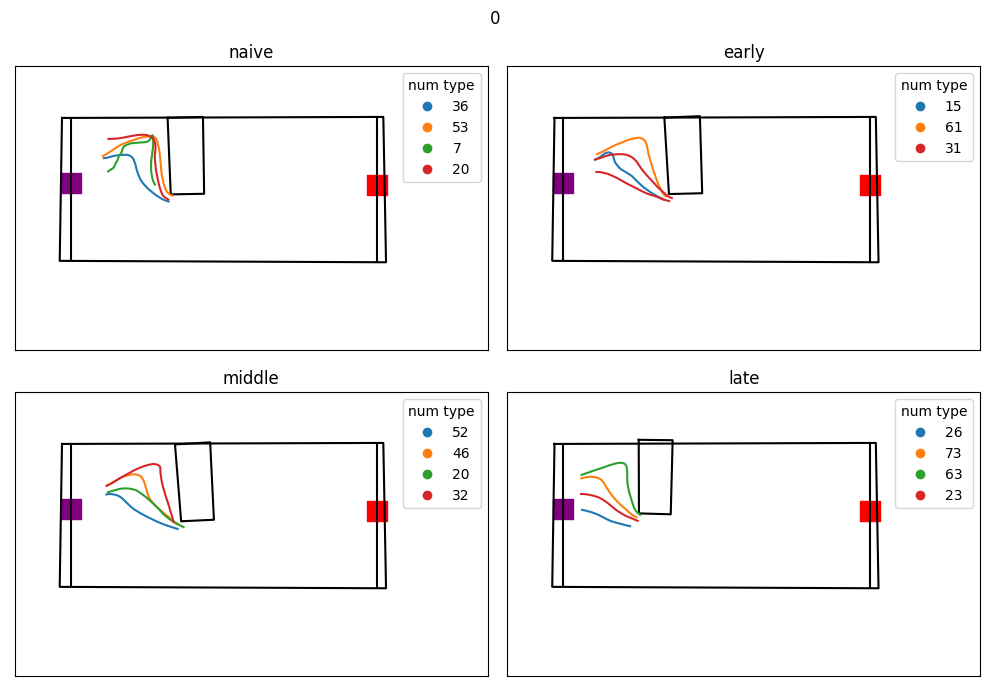

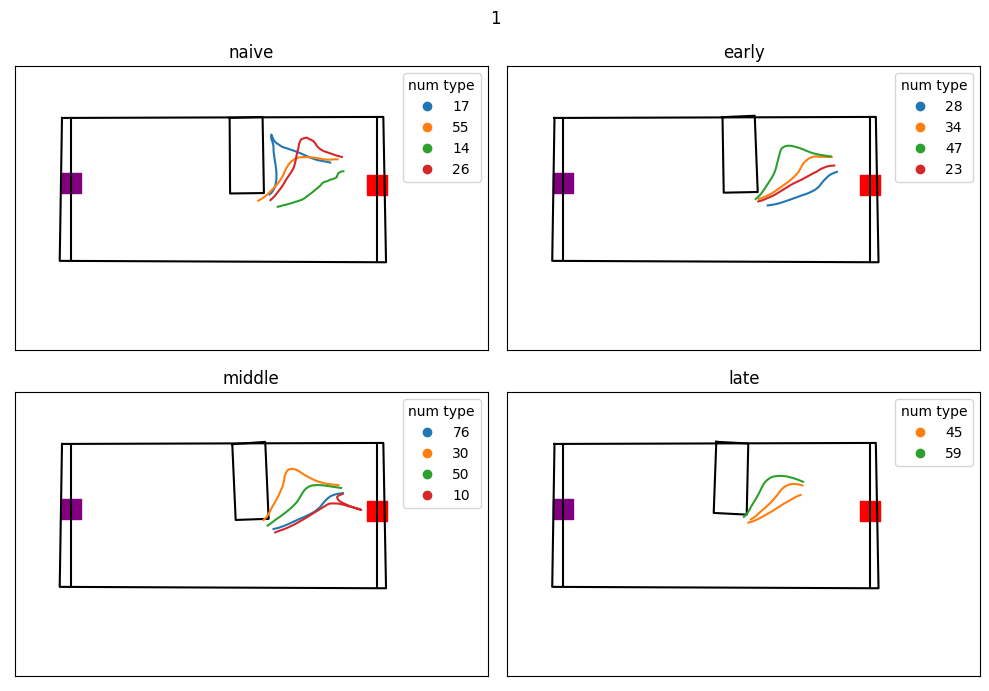

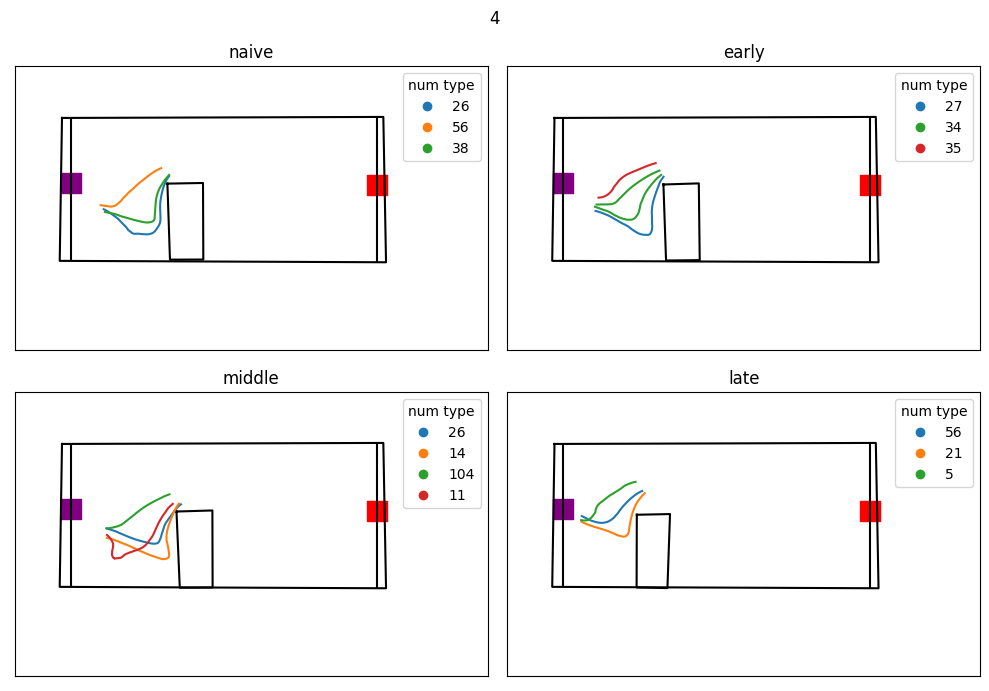

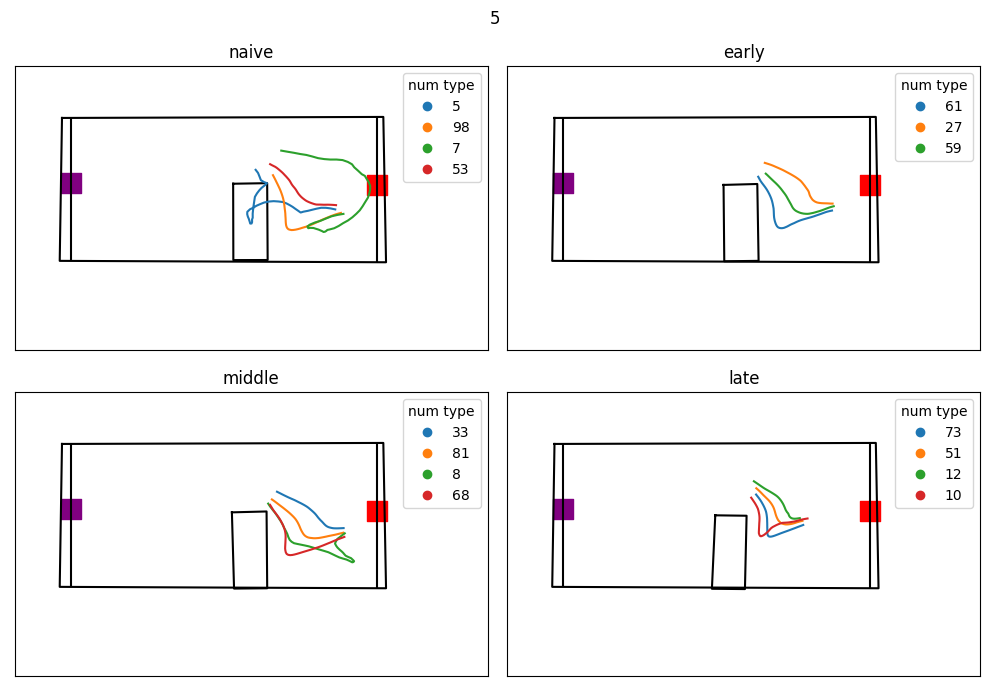

In [1841]:
for cluster in oa_short.obstacle_cluster.unique():

    data = oa_short[(oa_short['obstacle_cluster']==cluster) ]
    data = drop_nans_in_columns(data,'obstacle_devations')
    data = drop_nans_in_columns(data,'skill')
    fig,axs = plt.subplots(2,2, figsize = (10,7),tight_layout =False)
    fig.suptitle(cluster)
    for skill,skill_df in data.groupby(['skill']):
        for ax in axs.reshape(-1):
            ax.set_xticks([], [])
            ax.set_yticks([], [])
            #plot_arena(data,ax,obstacle=False)
        if skill == 'naive':
            axs[0,0].set_title(skill)
            plot_arena(oa_short,axs[0,0],obstacle=False)
            plot_orginal_obstacle(skill_df,axs[0,0],cluster=cluster)
            streamlines,matx,maty = create_streamlines(skill_df)
            clusters = cluster_streamlines(streamlines)
            color_pallete = 'tab10'
            color_labels = [len(cluster) for cluster in clusters]
            rgb_values = sns.color_palette(color_pallete, len(color_labels))
            color_map = dict(zip(color_labels, rgb_values))
            markers = [plt.Line2D([0,0],[0,0],c=color, marker='o', linestyle='') for color in color_map.values()]
            axs[0,0].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
            for i in list(range(len(clusters.centroids))):
                color = color_map.get(len(clusters[i]))
                axs[0,0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)
        elif skill == 'early':
            axs[0,1].set_title(skill)
            plot_arena(oa_short,axs[0,1],obstacle=False)
            plot_orginal_obstacle(skill_df,axs[0,1],cluster=cluster)
            streamlines,matx,maty = create_streamlines(skill_df)
            clusters = cluster_streamlines(streamlines)
            color_pallete = 'tab10'
            color_labels = [len(cluster) for cluster in clusters]
            rgb_values = sns.color_palette(color_pallete, len(color_labels))
            color_map = dict(zip(color_labels, rgb_values))
            markers = [plt.Line2D([0,0],[0,0],c=color, marker='o', linestyle='') for color in color_map.values()]
            axs[0,1].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
            for i in list(range(len(clusters.centroids))):
                color = color_map.get(len(clusters[i]))
                axs[0,1].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)
        elif skill == 'middle':
            axs[1,0].set_title(skill)
            plot_arena(oa_short,axs[1,0],obstacle=False)
            plot_orginal_obstacle(skill_df,axs[1,0],cluster=cluster)
            streamlines,matx,maty = create_streamlines(skill_df)
            clusters = cluster_streamlines(streamlines)
            color_pallete = 'tab10'
            color_labels = [len(cluster) for cluster in clusters]
            rgb_values = sns.color_palette(color_pallete, len(color_labels))
            color_map = dict(zip(color_labels, rgb_values))
            markers = [plt.Line2D([0,0],[0,0],c=color, marker='o', linestyle='') for color in color_map.values()]
            axs[1,0].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
            for i in list(range(len(clusters.centroids))):
                color = color_map.get(len(clusters[i]))
                axs[1,0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)
        elif skill == 'late':
            axs[1,1].set_title(skill)
            plot_arena(oa_short,axs[1,1],obstacle=False)
            if cluster in [4,5]:
                plot_orginal_obstacle(skill_df,axs[1,1],cluster=cluster,correct=True)
            else:
                plot_orginal_obstacle(skill_df,axs[1,1],cluster=cluster)
            streamlines,matx,maty = create_streamlines(skill_df)
            clusters = cluster_streamlines(streamlines)
            color_pallete = 'tab10'
            color_labels = [len(cluster) for cluster in clusters]
            rgb_values = sns.color_palette(color_pallete, len(color_labels))
            color_map = dict(zip(color_labels, rgb_values))
            markers = [plt.Line2D([0,0],[0,0],c=color, marker='o', linestyle='') for color in color_map.values()]
            axs[1,1].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
            for i in list(range(len(clusters.centroids))):
                color = color_map.get(len(clusters[i]))
                axs[1,1].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)

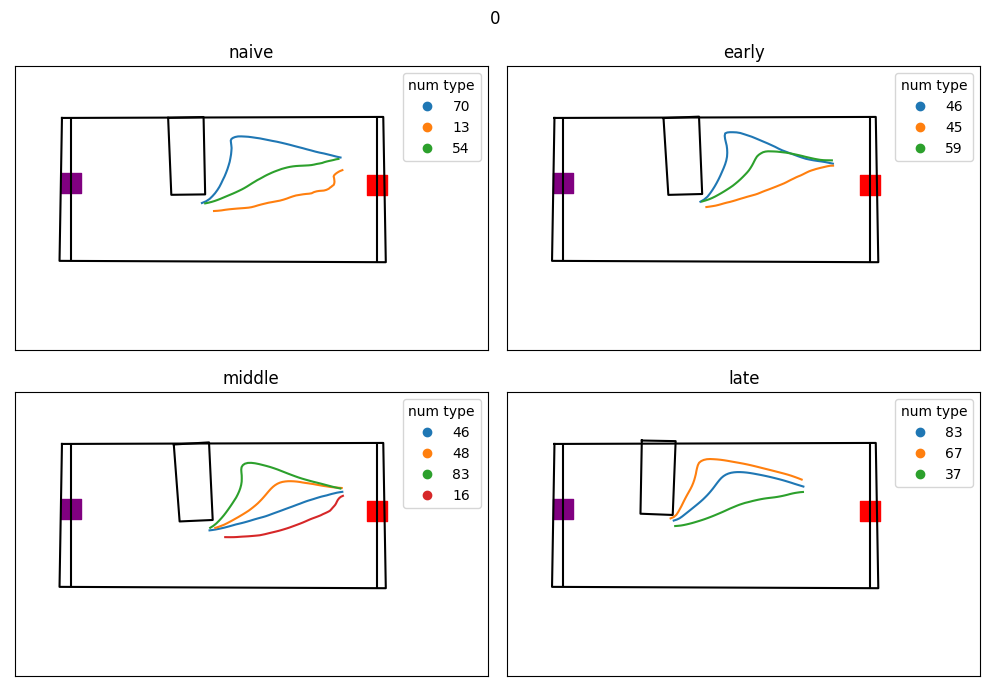

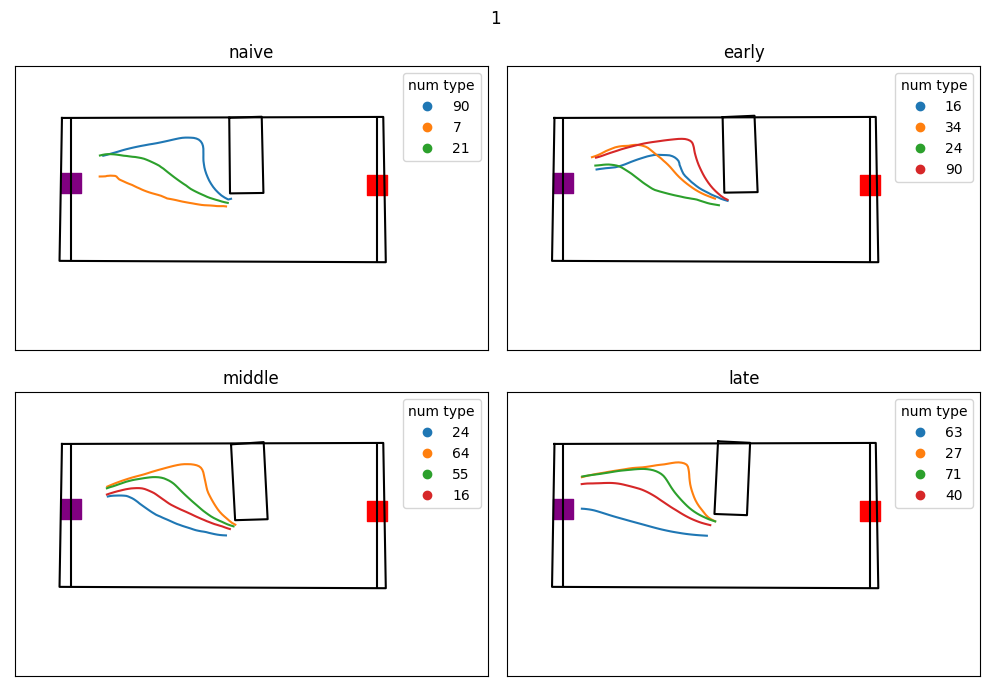

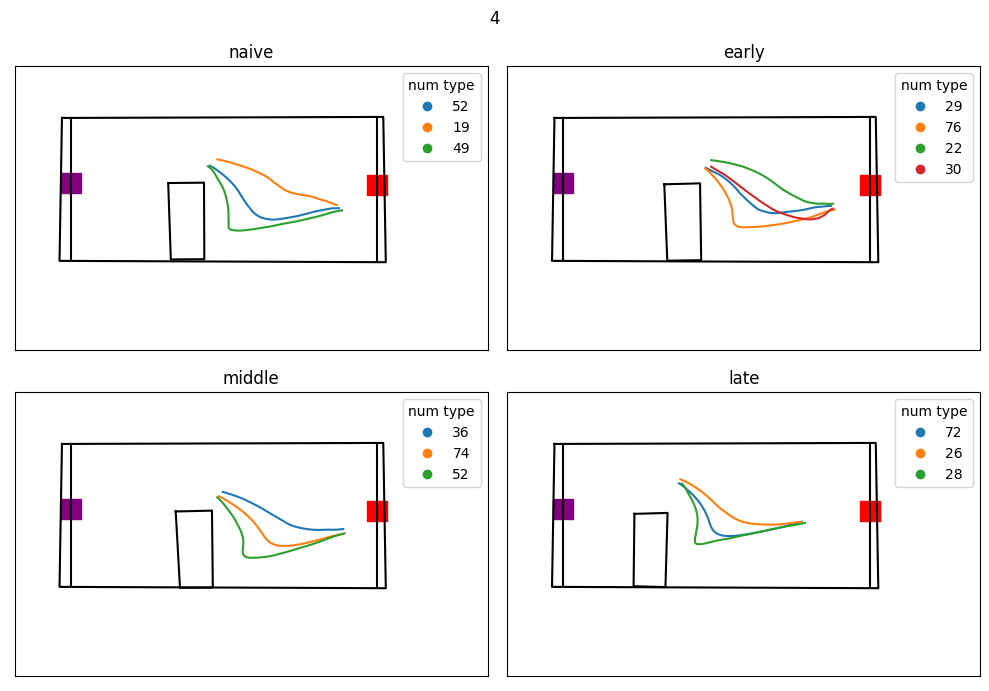

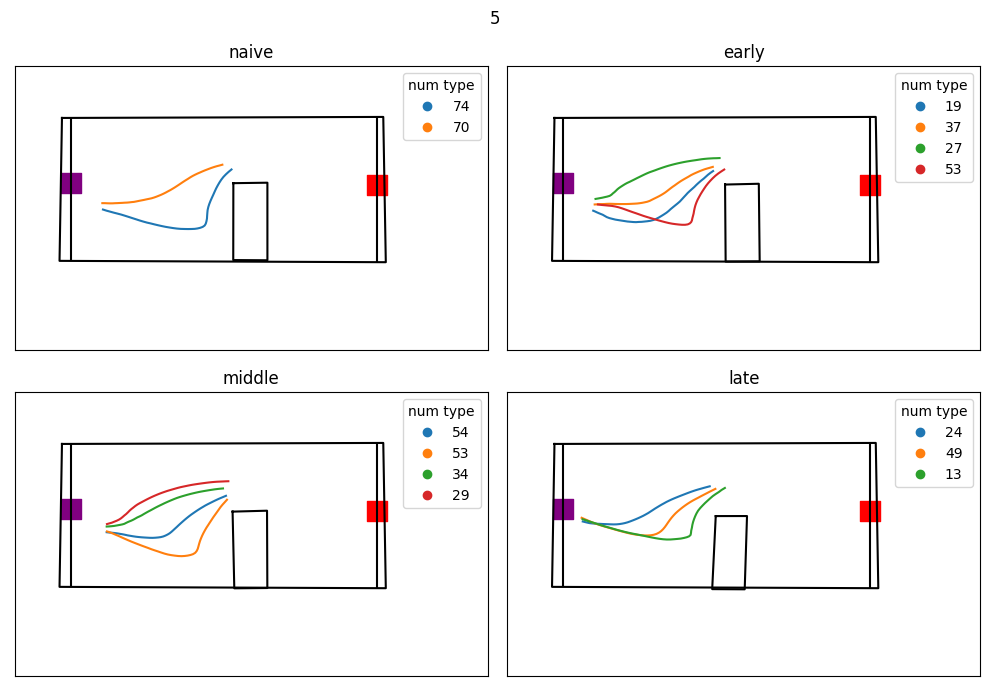

In [1853]:
for cluster in oa_long.obstacle_cluster.unique():

    data = oa_long[(oa_long['obstacle_cluster']==cluster) ]
    data = drop_nans_in_columns(data,'obstacle_devations')
    data = drop_nans_in_columns(data,'skill')
    fig,axs = plt.subplots(2,2, figsize = (10,7),tight_layout =False)
    fig.suptitle(cluster)
    for skill,skill_df in data.groupby(['skill']):
        for ax in axs.reshape(-1):
            ax.set_xticks([], [])
            ax.set_yticks([], [])
            #plot_arena(data,ax,obstacle=False)
        if skill == 'naive':
            axs[0,0].set_title(skill)
            plot_arena(oa_long,axs[0,0],obstacle=False)
            plot_orginal_obstacle(skill_df,axs[0,0],cluster=cluster)
            streamlines,matx,maty = create_streamlines(skill_df)
            clusters = cluster_streamlines(streamlines)
            color_pallete = 'tab10'
            color_labels = [len(cluster) for cluster in clusters]
            rgb_values = sns.color_palette(color_pallete, len(color_labels))
            color_map = dict(zip(color_labels, rgb_values))
            markers = [plt.Line2D([0,0],[0,0],c=color, marker='o', linestyle='') for color in color_map.values()]
            axs[0,0].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
            for i in list(range(len(clusters.centroids))):
                color = color_map.get(len(clusters[i]))
                axs[0,0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)
        elif skill == 'early':
            axs[0,1].set_title(skill)
            plot_arena(oa_long,axs[0,1],obstacle=False)
            plot_orginal_obstacle(skill_df,axs[0,1],cluster=cluster)
            streamlines,matx,maty = create_streamlines(skill_df)
            clusters = cluster_streamlines(streamlines)
            color_pallete = 'tab10'
            color_labels = [len(cluster) for cluster in clusters]
            rgb_values = sns.color_palette(color_pallete, len(color_labels))
            color_map = dict(zip(color_labels, rgb_values))
            markers = [plt.Line2D([0,0],[0,0],c=color, marker='o', linestyle='') for color in color_map.values()]
            axs[0,1].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
            for i in list(range(len(clusters.centroids))):
                color = color_map.get(len(clusters[i]))
                axs[0,1].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)
        elif skill == 'middle':
            axs[1,0].set_title(skill)
            plot_arena(oa_long,axs[1,0],obstacle=False)
            plot_orginal_obstacle(skill_df,axs[1,0],cluster=cluster)
            streamlines,matx,maty = create_streamlines(skill_df)
            clusters = cluster_streamlines(streamlines)
            color_pallete = 'tab10'
            color_labels = [len(cluster) for cluster in clusters]
            rgb_values = sns.color_palette(color_pallete, len(color_labels))
            color_map = dict(zip(color_labels, rgb_values))
            markers = [plt.Line2D([0,0],[0,0],c=color, marker='o', linestyle='') for color in color_map.values()]
            axs[1,0].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
            for i in list(range(len(clusters.centroids))):
                color = color_map.get(len(clusters[i]))
                axs[1,0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)
        elif skill == 'late':
            axs[1,1].set_title(skill)
            plot_arena(oa_long,axs[1,1],obstacle=False)
            if cluster in [4,5]:
                plot_orginal_obstacle(skill_df,axs[1,1],cluster=cluster,correct=True)
            else:
                plot_orginal_obstacle(skill_df,axs[1,1],cluster=cluster)
            streamlines,matx,maty = create_streamlines(skill_df)
            clusters = cluster_streamlines(streamlines)
            color_pallete = 'tab10'
            color_labels = [len(cluster) for cluster in clusters]
            rgb_values = sns.color_palette(color_pallete, len(color_labels))
            color_map = dict(zip(color_labels, rgb_values))
            markers = [plt.Line2D([0,0],[0,0],c=color, marker='o', linestyle='') for color in color_map.values()]
            axs[1,1].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
            for i in list(range(len(clusters.centroids))):
                color = color_map.get(len(clusters[i]))
                axs[1,1].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)




In [1412]:
oa_long.skill.unique()

array(['naive', 'early', 'middle', nan, 'late'], dtype=object)

In [1478]:
np.nanmean(flatten_list_of_arrays(dictionary.get('cluster_distances')))/len(flatten_list_of_arrays(dictionary.get('cluster_distances')))

0.013309473506875256

In [1479]:
 cluster_dict = dict( type = [dictionary.get('type')[0] for _ in range(flatten_list_of_arrays(dictionary.get('cluster_distances')).astype(object).size)]
                      , obstacle_cluster  = [dictionary.get('obstacle_cluster')[0] for _ in range(flatten_list_of_arrays(dictionary.get('cluster_distances')).astype(object).size)] ,
                      mean_inter_cluster_distance = flatten_list_of_arrays(dictionary.get('cluster_distances')).astype(object))

In [1618]:
oa_long.date.unique()

array(['042823', '043023', '050123', '050223', '050323', '050423',
       '050523', '050923', '051023', '051723', '051823', '051923',
       '052223', '052323', '052523', '052623', '061323', '061423',
       '072323', '072023', '072123', '072523'], dtype=object)

In [1842]:
oa_cluster_list = [ ]
data = drop_nans_in_columns(oa_short,'skill')
for cluster in data.obstacle_cluster.unique():
    for skill in data.skill.unique():
        df = data[(data['obstacle_cluster']==cluster) & (data['skill']==skill)]
        cluster_dict = create_cluster_dict(df,Skill=True)
        oa_cluster_list.append(cluster_dict)
cluster_df = pd.DataFrame([])
for dictionary in oa_cluster_list:
  cluster_dict = dict( type = [dictionary.get('type')[0] for _ in range(flatten_list_of_arrays(dictionary.get('cluster_distances')).astype(object).size)]
                      , obstacle_cluster  = [dictionary.get('obstacle_cluster')[0] for _ in range(flatten_list_of_arrays(dictionary.get('cluster_distances')).astype(object).size)] ,
                      inter_cluster_distance = flatten_list_of_arrays(dictionary.get('cluster_distances')).astype(object))
  series = pd.DataFrame(data=cluster_dict)
  cluster_df = cluster_df.append(pd.DataFrame(data=series))

<AxesSubplot: xlabel='obstacle_cluster', ylabel='ob_linearity'>

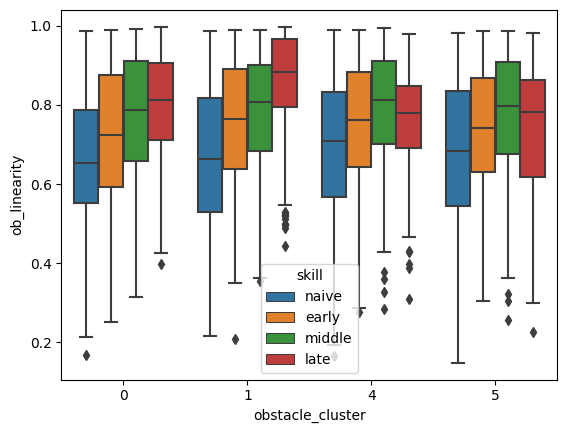

In [1849]:
data = pd.concat([oa_short,oa_long])
sns.boxplot(data=data, x="obstacle_cluster", y="ob_linearity", hue="skill")


<AxesSubplot: xlabel='obstacle_cluster', ylabel='inter_cluster_distance'>

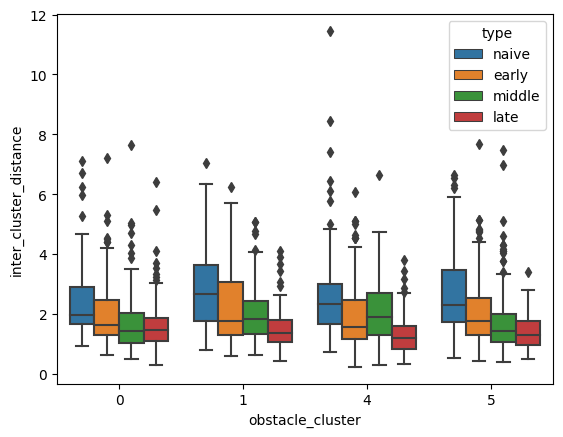

In [1843]:
data= cluster_df[cluster_df['inter_cluster_distance']<20]
sns.boxplot(data=data, x="obstacle_cluster", y="inter_cluster_distance", hue="type")

<AxesSubplot: xlabel='obstacle_cluster', ylabel='ob_linearity'>

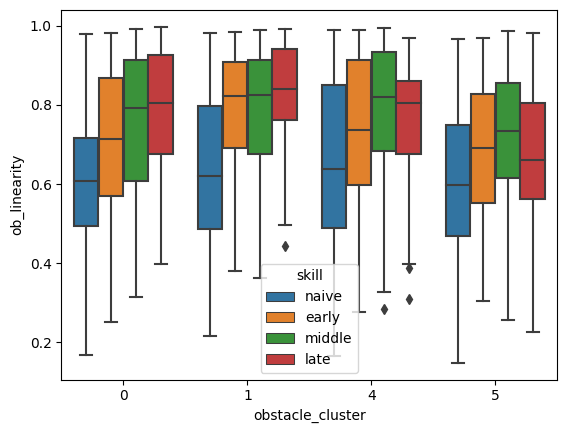

In [1846]:
data= oa_short
sns.boxplot(data=data, x="obstacle_cluster", y="ob_linearity", hue="skill")

In [1794]:
oa_cluster_list = [ ]
data = drop_nans_in_columns(oa_long,'skill')
for cluster in data.obstacle_cluster.unique():
    for skill in data.skill.unique():
        df = data[(data['obstacle_cluster']==cluster) & (data['skill']==skill)]
        cluster_dict = create_cluster_dict(df,Skill=True)
        oa_cluster_list.append(cluster_dict)
cluster_df = pd.DataFrame([])
for dictionary in oa_cluster_list:
  cluster_dict = dict( type = [dictionary.get('type')[0] for _ in range(flatten_list_of_arrays(dictionary.get('cluster_distances')).astype(object).size)]
                      , obstacle_cluster  = [dictionary.get('obstacle_cluster')[0] for _ in range(flatten_list_of_arrays(dictionary.get('cluster_distances')).astype(object).size)] ,
                      inter_cluster_distance = flatten_list_of_arrays(dictionary.get('cluster_distances')).astype(object))
  series = pd.DataFrame(data=cluster_dict)
  cluster_df = cluster_df.append(pd.DataFrame(data=series))

<AxesSubplot: xlabel='type', ylabel='inter_cluster_distance'>

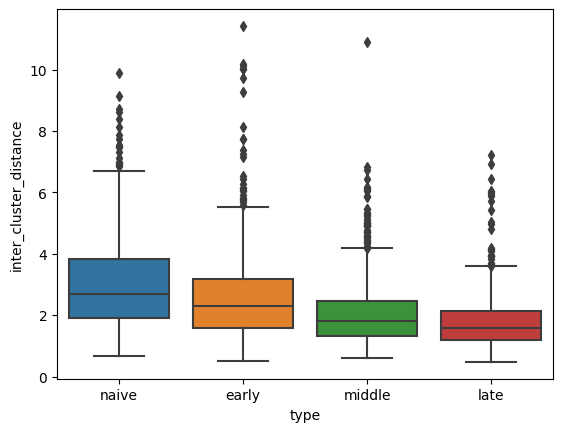

In [1797]:
data= cluster_df[cluster_df['inter_cluster_distance']<20]
sns.boxplot(data=data, x="type", y="inter_cluster_distance")

<AxesSubplot: xlabel='obstacle_cluster', ylabel='inter_cluster_distance'>

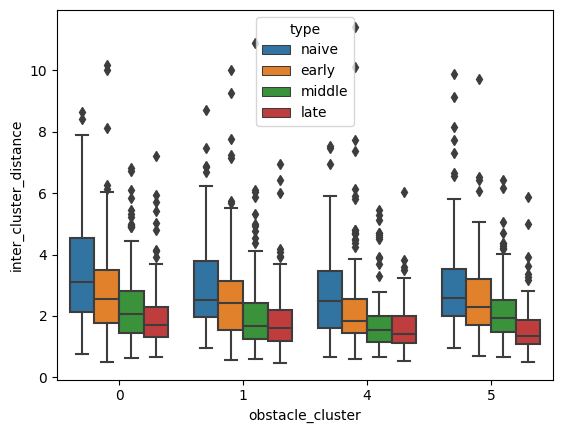

In [1796]:
data= cluster_df[cluster_df['inter_cluster_distance']<20]
sns.boxplot(data=data, x="obstacle_cluster", y="inter_cluster_distance", hue="type")

<AxesSubplot: xlabel='skill', ylabel='total_distance'>

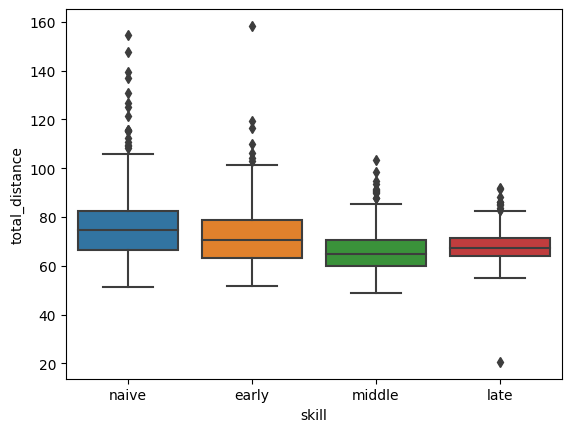

In [1798]:
data= oa_long
sns.boxplot(data=data, x="skill", y="_distance")

In [1801]:
data = oa_long
data = drop_nans_in_columns(data,'obstacle_ind')
for ind,row in data.iterrows():
    mean_obstacle_devations = np.nanmean(row.obstacle_devations)
    oa_long.at[ind,'mean_obstacle_devations'] = mean_obstacle_devations

In [1802]:
data = oa_long
data = drop_nans_in_columns(data,'obstacle_ind')
for ind,row in data.iterrows():
    ob_distance = sum(row.ts_distance[:int(row.obstacle_ind)])
    oa_long.at[ind,'total_ob_distance'] = ob_distance


In [1803]:
data = oa_long
data = drop_nans_in_columns(data,'obstacle_ind')
for ind,row in data.iterrows():
    mean_speed = np.nanmean(row.ts_speed[:int(row.obstacle_ind)])
    oa_long.at[ind,'ob_mean_speed'] = mean_speed

In [1804]:
data = oa_long
data = drop_nans_in_columns(data,'obstacle_ind')
for ind,row in data.iterrows():
    angle_to_corner = np.nanmean(row.ts_zero_out_angle_to_corner[:int(row.obstacle_ind)])
    oa_long.at[ind,'ob_angle_to_corner'] = angle_to_corner

In [1810]:
row.lateral_error

nan

In [1812]:
data = oa_long
data = drop_nans_in_columns(data,'obstacle_ind')
data = drop_nans_in_columns(data,'lateral_error')
for ind,row in data.iterrows():
    angle_to_corner = np.nanmean(row.lateral_error[:int(row.obstacle_ind)])
    oa_long.at[ind,'ob_lateral_error'] = angle_to_corner

<AxesSubplot: xlabel='obstacle_cluster', ylabel='ob_angle_to_corner'>

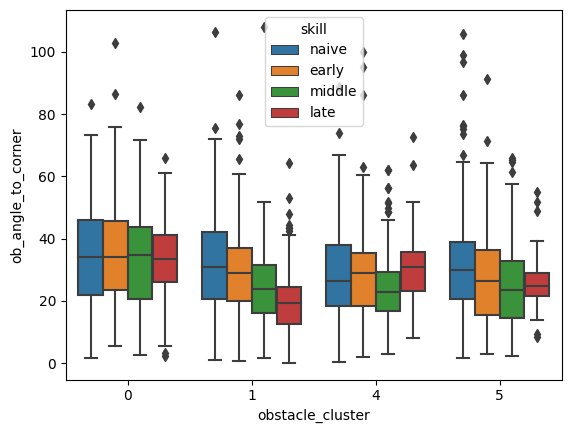

In [1805]:
data= oa_long
sns.boxplot(data=data, x="obstacle_cluster", y="ob_angle_to_corner", hue="skill")

<AxesSubplot: xlabel='obstacle_cluster', ylabel='ob_mean_speed'>

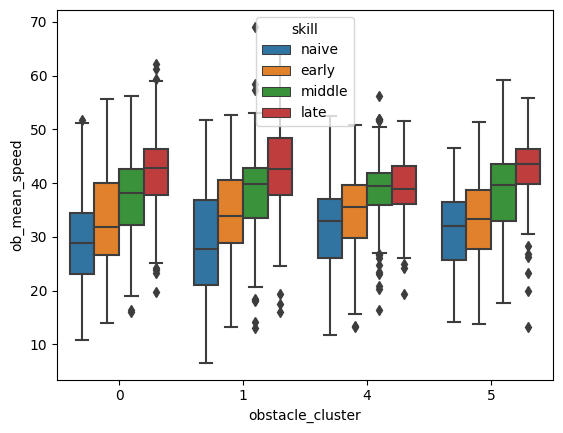

In [1806]:
data= oa_long
sns.boxplot(data=data, x="obstacle_cluster", y="ob_mean_speed", hue="skill")

<AxesSubplot: xlabel='obstacle_cluster', ylabel='mean_obstacle_devations'>

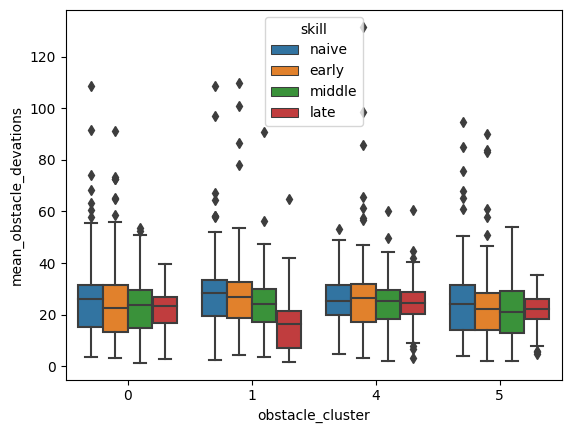

In [1807]:
data= oa_long
sns.boxplot(data=data, x="obstacle_cluster", y="mean_obstacle_devations", hue="skill")

<AxesSubplot: xlabel='obstacle_cluster', ylabel='ob_lateral_error'>

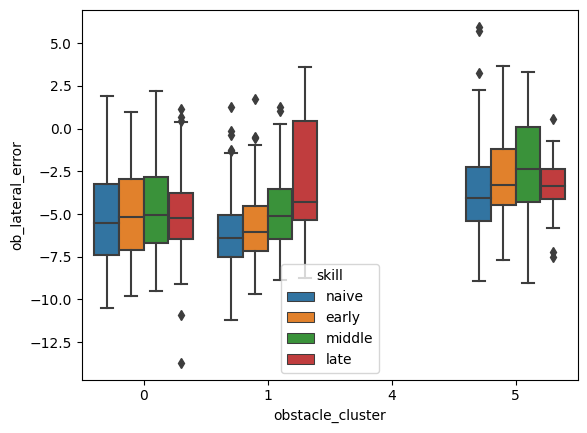

In [1813]:
data= oa_long
sns.boxplot(data=data, x="obstacle_cluster", y="ob_lateral_error", hue="skill")

<AxesSubplot: xlabel='obstacle_cluster', ylabel='total_ob_distance'>

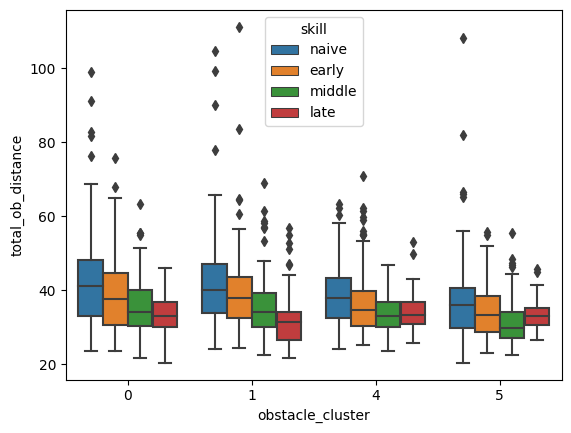

In [1819]:
data= oa_long
sns.boxplot(data=data, x="obstacle_cluster", y="total_ob_distance", hue="skill")

<AxesSubplot: xlabel='skill', ylabel='total_ob_distance'>

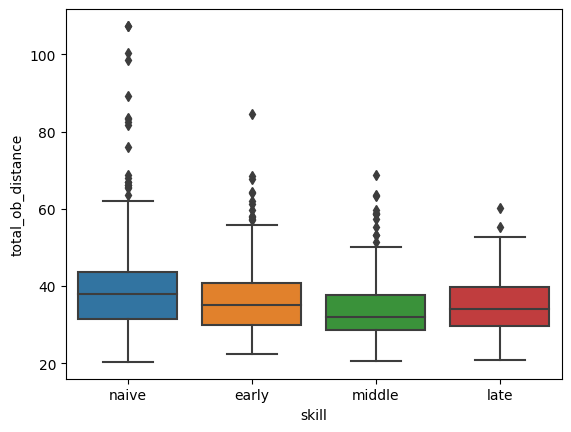

In [1728]:
data= data
sns.boxplot(data=data, x="skill", y="total_ob_distance")

<AxesSubplot: xlabel='skill', ylabel='ob_linearity'>

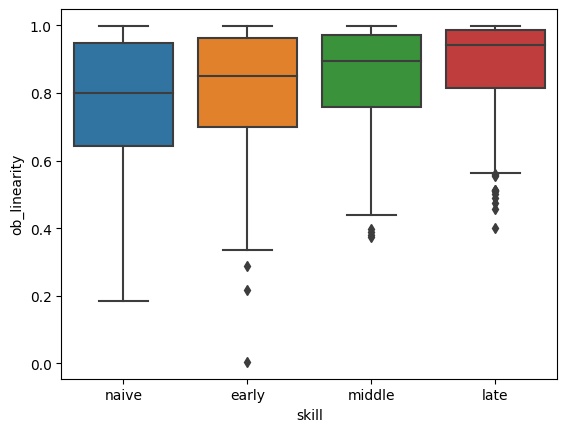

In [1741]:
data= oa_long
sns.boxplot(data=data, x="skill", y="ob_linearity")

In [1]:
data= pd.concat([oa_long,dark_long])
sns.boxplot(data=data, x="skill", y="ob_linearity")

NameError: name 'pd' is not defined

<AxesSubplot: xlabel='obstacle_cluster', ylabel='ob_linearity'>

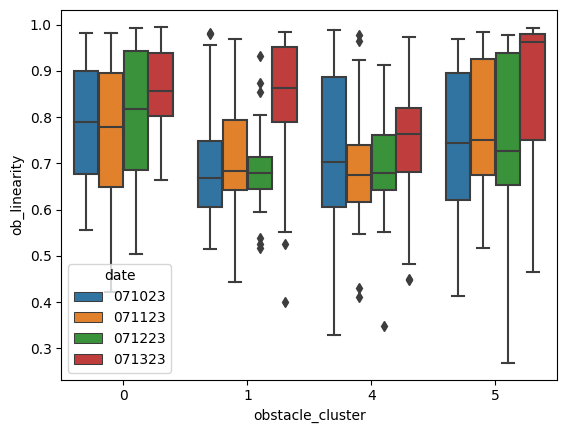

In [1826]:
data= dark_long
sns.boxplot(data=data, x="obstacle_cluster", y="ob_linearity", hue="date")

<AxesSubplot: xlabel='obstacle_cluster', ylabel='go_linearity'>

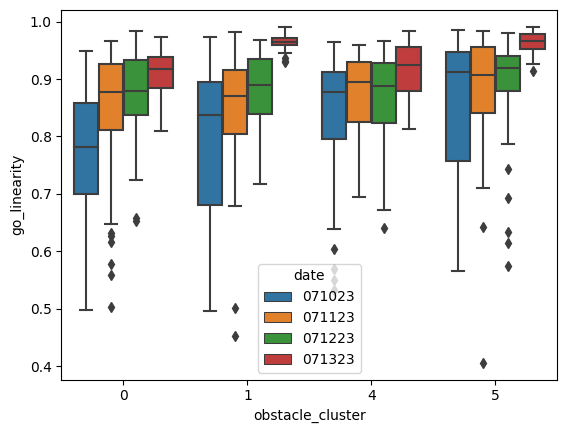

In [1825]:
data= dark_long
sns.boxplot(data=data, x="obstacle_cluster", y="go_linearity", hue="date")

<AxesSubplot: xlabel='obstacle_cluster', ylabel='go_linearity'>

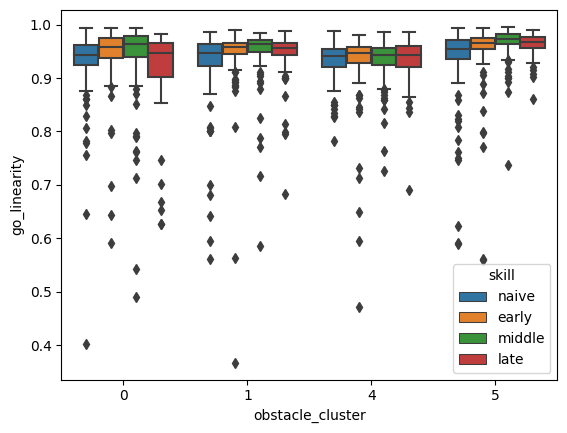

In [1823]:
data= oa_long
sns.boxplot(data=data, x="obstacle_cluster", y="go_linearity", hue="skill")

<AxesSubplot: xlabel='obstacle_cluster', ylabel='ob_linearity'>

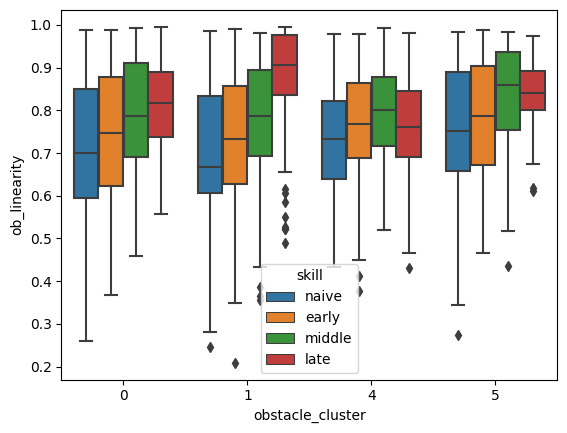

In [1820]:
data= oa_long
sns.boxplot(data=data, x="obstacle_cluster", y="ob_linearity", hue="skill")

<AxesSubplot: xlabel='obstacle_cluster', ylabel='ob_tortuosity'>

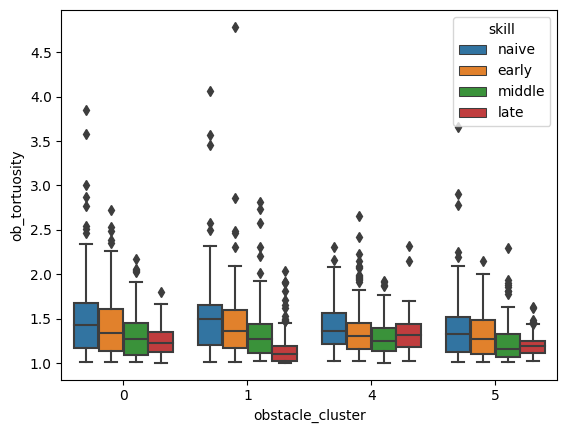

In [1822]:
data= oa_long
sns.boxplot(data=data, x="obstacle_cluster", y="ob_tortuosity", hue="skill")

In [ ]:
data= ns_oa_long
sns.boxplot(data=data, x="obstacle_cluster", y="ob_linearity", hue="skill")

<AxesSubplot: xlabel='obstacle_cluster', ylabel='total_distance'>

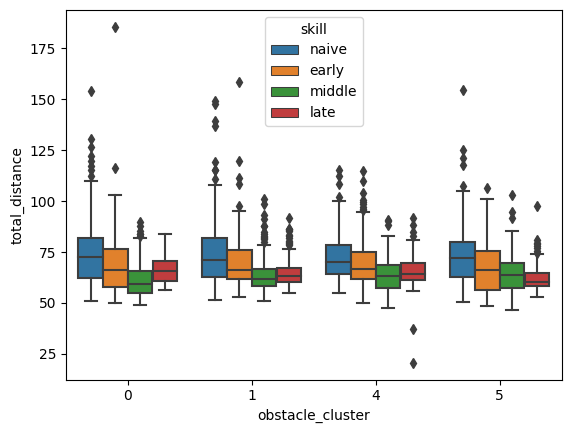

In [1742]:
data= ns_oa_long
sns.boxplot(data=data, x="obstacle_cluster", y="total_distance", hue="skill")

<AxesSubplot: xlabel='obstacle_cluster', ylabel='time'>

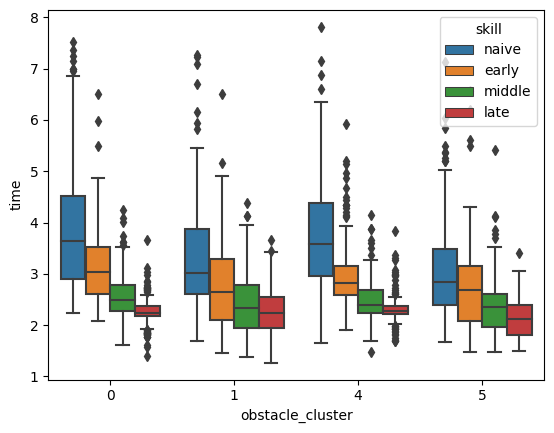

In [1711]:
data= oa_long
sns.boxplot(data=data, x="obstacle_cluster", y="time", hue="skill")

<AxesSubplot: xlabel='obstacle_cluster', ylabel='total_distance'>

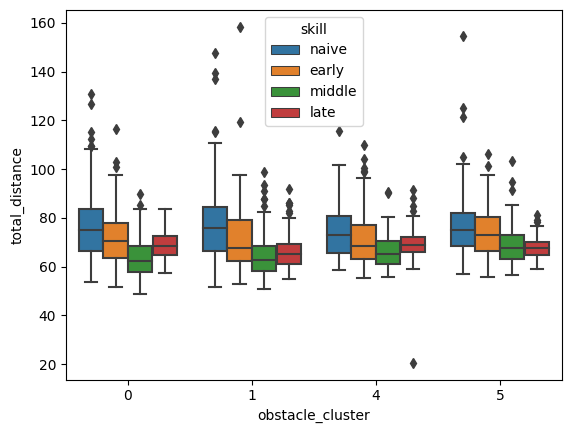

In [1818]:
data= oa_long
sns.boxplot(data=data, x="obstacle_cluster", y="total_distance", hue="skill")

<AxesSubplot: xlabel='skill', ylabel='time'>

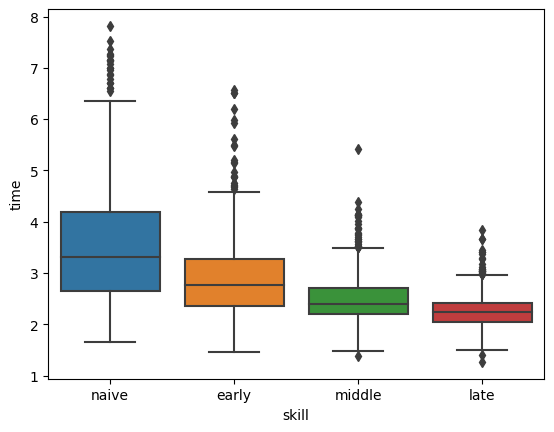

In [1713]:
data= oa_long
sns.boxplot(data=data, x="skill", y="time")

<AxesSubplot: xlabel='obstacle_cluster', ylabel='time'>

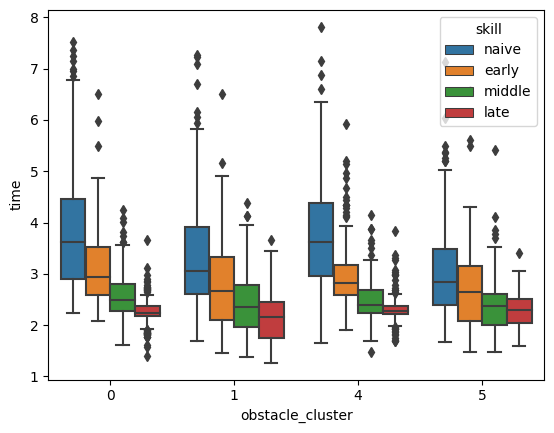

In [1817]:
data= oa_long
sns.boxplot(data=data, x="obstacle_cluster", y="time", hue="skill")

<AxesSubplot: xlabel='obstacle_cluster', ylabel='ob_linearity'>

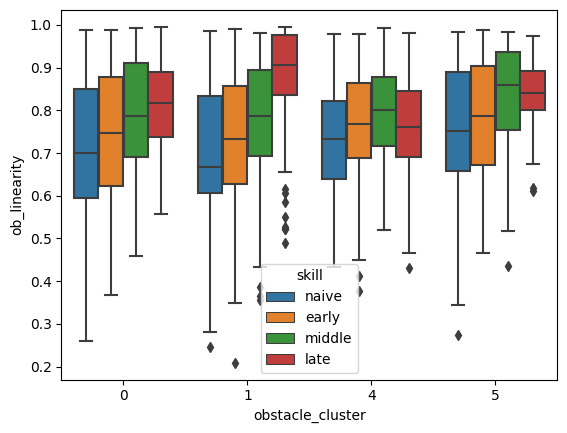

In [1816]:
data= oa_long
sns.boxplot(data=data, x="obstacle_cluster", y="ob_linearity", hue="skill")

<AxesSubplot: xlabel='obstacle_cluster', ylabel='time'>

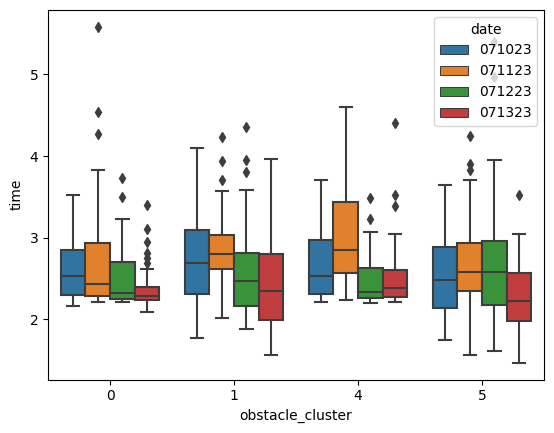

In [1541]:
data= dark_long
sns.boxplot(data=data, x="obstacle_cluster", y="time", hue="date")

<AxesSubplot: xlabel='obstacle_cluster', ylabel='time'>

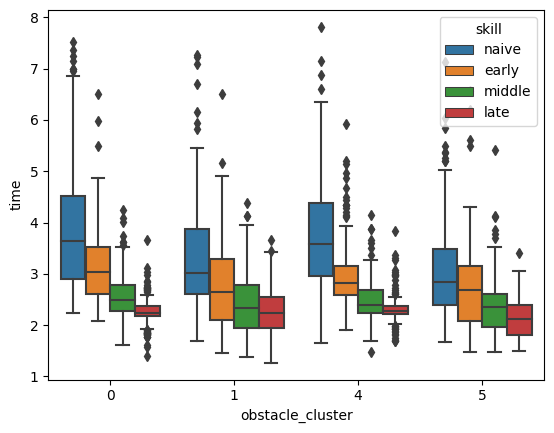

In [1739]:
data= oa_long
sns.boxplot(data=data, x="obstacle_cluster", y="time", hue="skill")

<AxesSubplot: xlabel='obstacle_cluster', ylabel='ob_linearity'>

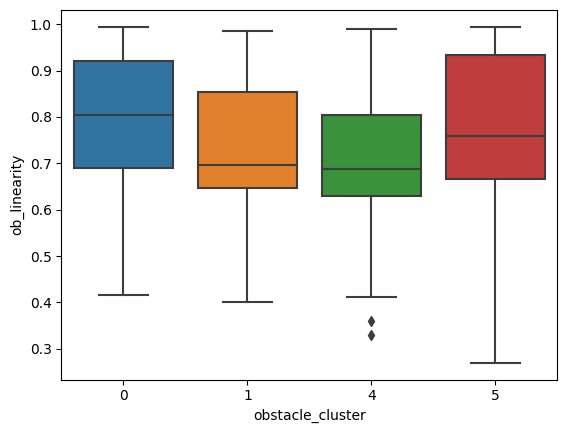

In [1531]:
data= dark_long
sns.boxplot(data=data, x="obstacle_cluster", y="ob_linearity")

[Text(0, 0, 'whitenoise'),
 Text(1, 0, 'blackwhite'),
 Text(2, 0, 'noisewhite'),
 Text(3, 0, 'whitewhite'),
 Text(4, 0, 'whiteblack'),
 Text(5, 0, 'noiseblack'),
 Text(6, 0, 'noisenoise')]

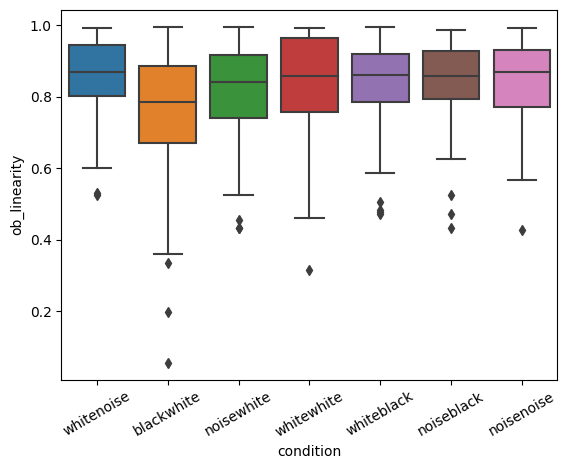

In [1576]:
data =con_long[con_long['date'].str.contains('07', regex=False)]
ax =sns.boxplot(data=data, x="condition", y="ob_linearity")
ax.set_xticklabels(ax.get_xticklabels(),rotation=30)

[Text(0, 0, 'white'), Text(1, 0, 'black'), Text(2, 0, 'noise')]

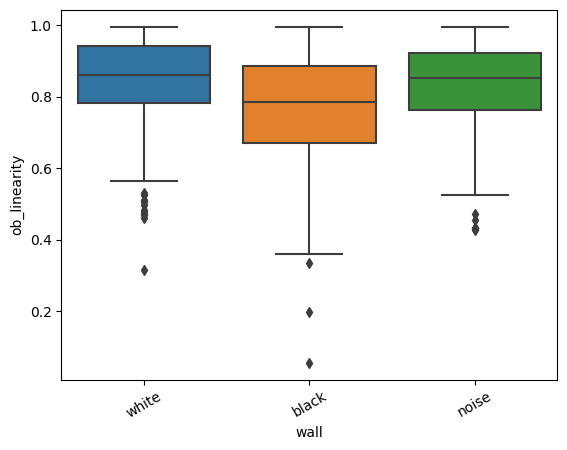

In [1575]:
data =con_long[con_long['date'].str.contains('07', regex=False)]
ax =sns.boxplot(data=data, x="wall", y="ob_linearity")
ax.set_xticklabels(ax.get_xticklabels(),rotation=30)

[Text(0, 0, 'noise'), Text(1, 0, 'white'), Text(2, 0, 'black')]

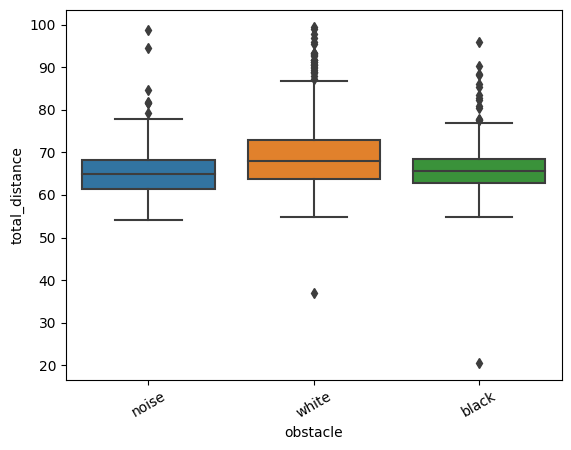

In [1581]:
data =con_long[con_long['date'].str.contains('07', regex=False)]
data= data[data['total_distance']<=100]
ax =sns.boxplot(data=data, x="obstacle", y="total_distance")
ax.set_xticklabels(ax.get_xticklabels(),rotation=30)

[Text(0, 0, '090523'),
 Text(1, 0, '090423'),
 Text(2, 0, '090123'),
 Text(3, 0, '083023'),
 Text(4, 0, '082923'),
 Text(5, 0, '082823'),
 Text(6, 0, '082723'),
 Text(7, 0, '082423'),
 Text(8, 0, '082323'),
 Text(9, 0, '082123'),
 Text(10, 0, '082023'),
 Text(11, 0, '081623'),
 Text(12, 0, '071523'),
 Text(13, 0, '071623'),
 Text(14, 0, '071723'),
 Text(15, 0, '071823'),
 Text(16, 0, '071923'),
 Text(17, 0, '072023'),
 Text(18, 0, '072123'),
 Text(19, 0, '072323'),
 Text(20, 0, '072523'),
 Text(21, 0, '072623'),
 Text(22, 0, '072823'),
 Text(23, 0, '073123'),
 Text(24, 0, '080123'),
 Text(25, 0, '080223'),
 Text(26, 0, '080423'),
 Text(27, 0, '080923'),
 Text(28, 0, '081023'),
 Text(29, 0, '081123'),
 Text(30, 0, '081523')]

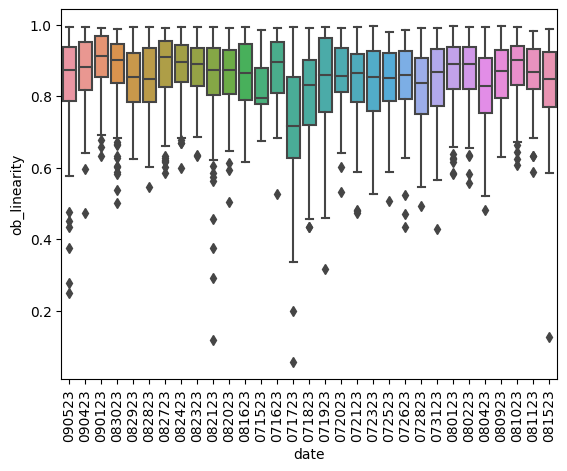

In [1582]:
data =con_long
ax =sns.boxplot(data=data, x="date", y="ob_linearity",
                )
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)

[Text(0, 0, 'black'), Text(1, 0, 'noise'), Text(2, 0, 'white')]

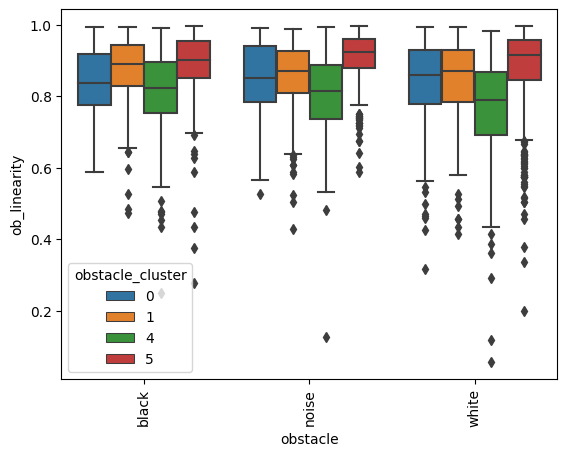

In [1566]:
data =con_long
ax =sns.boxplot(data=data, x="obstacle", y="ob_linearity",
                hue='obstacle_cluster')
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)

<AxesSubplot: xlabel='date', ylabel='ob_linearity'>

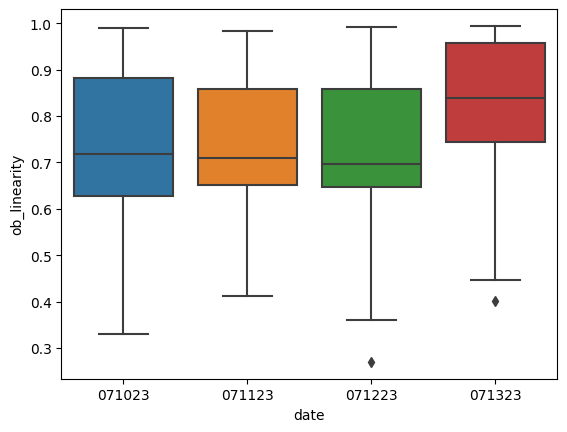

In [1538]:
data= dark_long
sns.boxplot(data=data, x="date", y="ob_linearity")

In [1542]:
oa_long.date.unique()

array(['042823', '043023', '050123', '050223', '050323', '050423',
       '050523', '050923', '051023', '051723', '051823', '051923',
       '052223', '052323', '052523', '052623', '061323', '061423',
       '072823', '071923', '072623'], dtype=object)

<AxesSubplot: xlabel='obstacle_cluster', ylabel='time'>

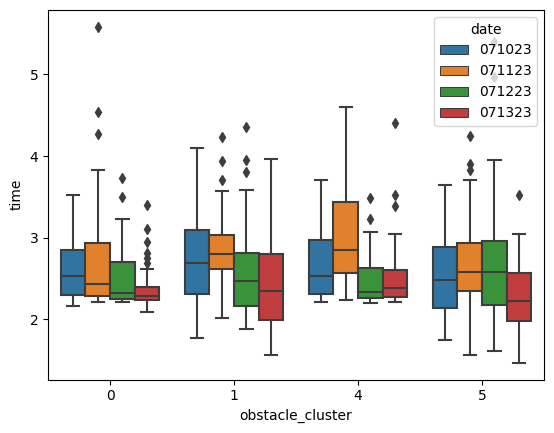

In [1738]:
data= dark_long
sns.boxplot(data=data, x="obstacle_cluster", y="time", hue="date")

<AxesSubplot: xlabel='obstacle_cluster', ylabel='ob_linearity'>

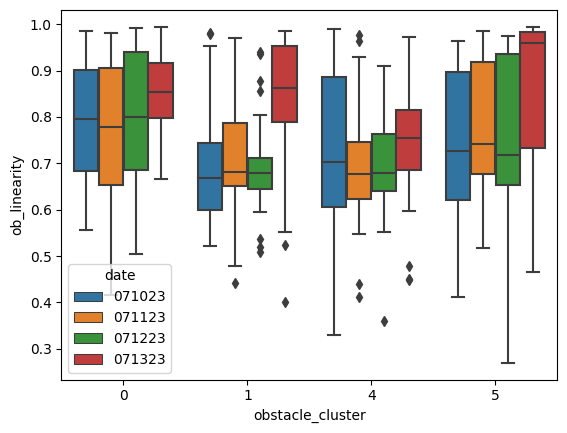

In [1736]:
data= dark_long
sns.boxplot(data=data, x="obstacle_cluster", y="ob_linearity", hue="date")

<AxesSubplot: xlabel='obstacle_cluster', ylabel='ob_linearity'>

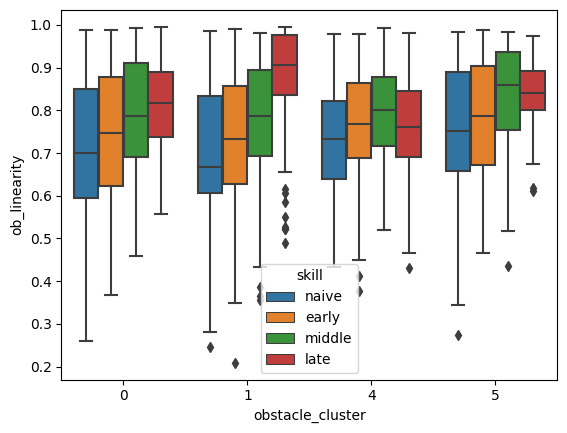

In [1837]:
data= oa_long
sns.boxplot(data=data, x="obstacle_cluster", y="ob_linearity", hue="skill")

In [1836]:
con_cluster_list = [ ]
data = drop_nans_in_columns(con_long,'date')
for cluster in data.obstacle_cluster.unique():
    for skill in data.date.unique():
        df = data[(data['obstacle_cluster']==cluster) & (data['date']==skill)]
        cluster_dict = create_cluster_dict(df,Date=True)
        oa_cluster_list.append(cluster_dict)
cluster_df = pd.DataFrame([])
for dictionary in oa_cluster_list:
  cluster_dict = dict( type = [dictionary.get('type')[0] for _ in range(flatten_list_of_arrays(dictionary.get('cluster_distances')).astype(object).size)]
                      , obstacle_cluster  = [dictionary.get('obstacle_cluster')[0] for _ in range(flatten_list_of_arrays(dictionary.get('cluster_distances')).astype(object).size)] ,
                      inter_cluster_distance = flatten_list_of_arrays(dictionary.get('cluster_distances')).astype(object))
  series = pd.DataFrame(data=cluster_dict)
  cluster_df = cluster_df.append(pd.DataFrame(data=series))

ValueError: need at least one array to concatenate

<AxesSubplot: xlabel='obstacle_cluster', ylabel='inter_cluster_distance'>

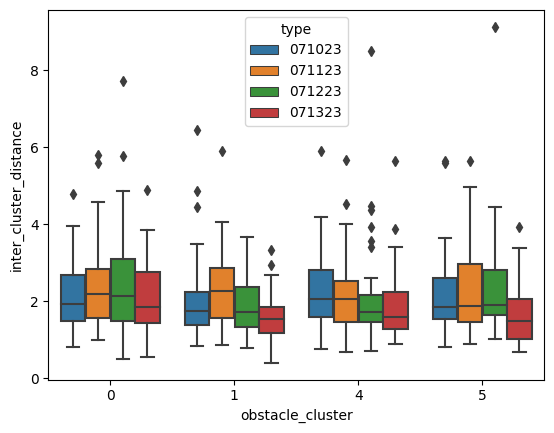

In [1543]:
data= cluster_df[cluster_df['inter_cluster_distance']<20]
sns.boxplot(data=data, x="obstacle_cluster", y="inter_cluster_distance", hue="type")

In [1830]:
oa_cluster_list = [ ]
data = drop_nans_in_columns(dark_long,'date')
for cluster in data.obstacle_cluster.unique():
    for date in data.date.unique():
        df = data[(data['obstacle_cluster']==cluster) & (data['date']==date)]
        cluster_dict = create_cluster_dict(df,Date=True)
        oa_cluster_list.append(cluster_dict)
cluster_df = pd.DataFrame([])
for dictionary in oa_cluster_list:
  cluster_dict = dict( type = [dictionary.get('type')[0] for _ in range(flatten_list_of_arrays(dictionary.get('cluster_distances')).astype(object).size)]
                      , obstacle_cluster  = [dictionary.get('obstacle_cluster')[0] for _ in range(flatten_list_of_arrays(dictionary.get('cluster_distances')).astype(object).size)] ,
                      inter_cluster_distance = flatten_list_of_arrays(dictionary.get('cluster_distances')).astype(object))
  series = pd.DataFrame(data=cluster_dict)
  cluster_df = cluster_df.append(pd.DataFrame(data=series))

<AxesSubplot: xlabel='obstacle_cluster', ylabel='inter_cluster_distance'>

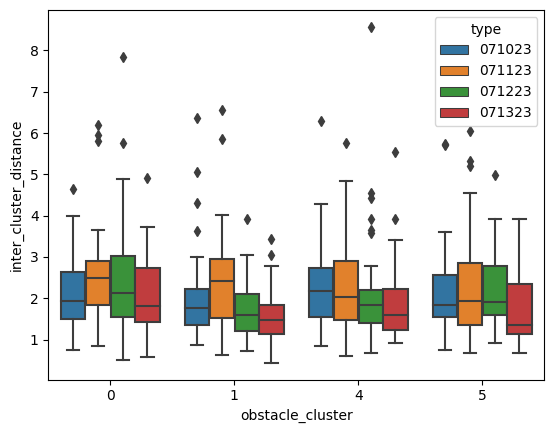

In [1831]:
data= cluster_df[cluster_df['inter_cluster_distance']<20]
sns.boxplot(data=data, x="obstacle_cluster", y="inter_cluster_distance", hue="type")

In [ ]:
for cluster in ns_oa_long.obstacle_cluster.unique():

    data = ns_oa_long[(ns_oa_long['obstacle_cluster']==cluster) ]
    data = drop_nans_in_columns(data,'obstacle_devations')
    fig,axs = plt.subplots(2,2, figsize = (10,7),tight_layout =False)

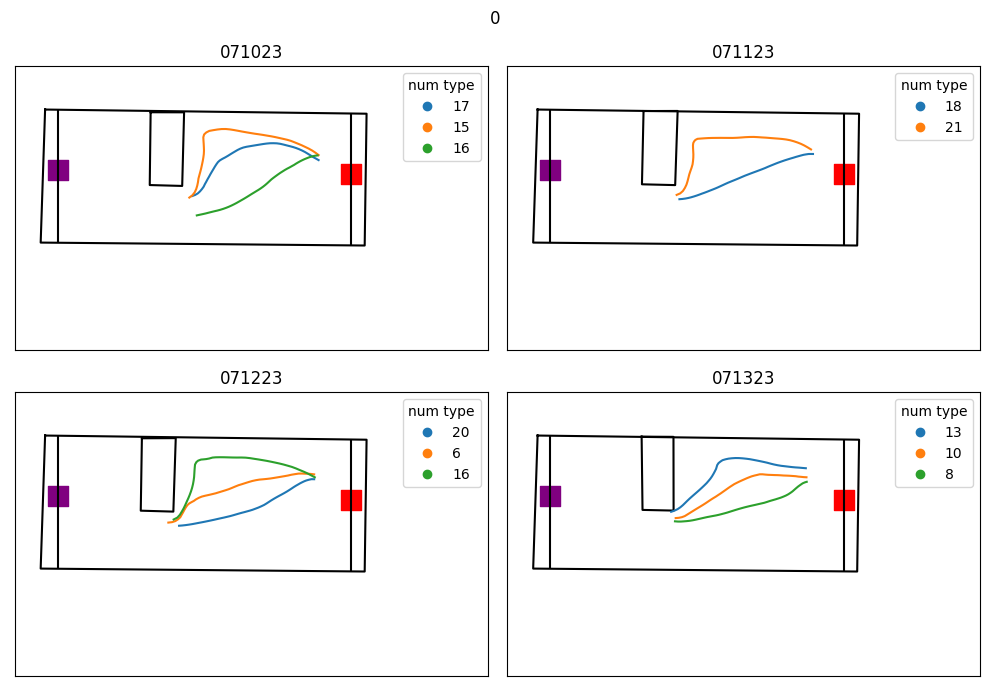

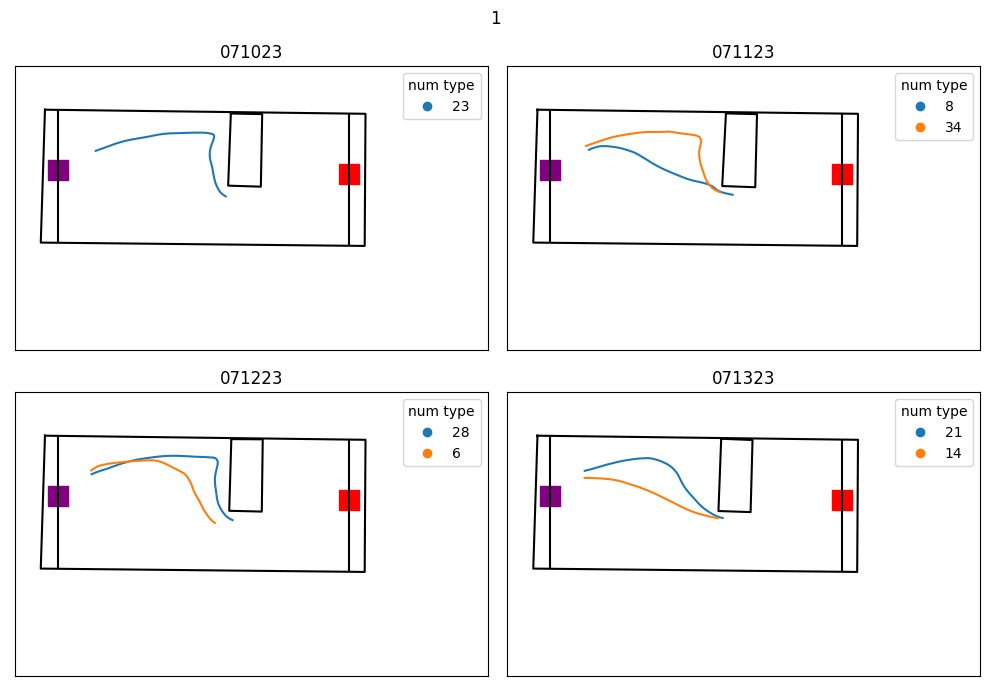

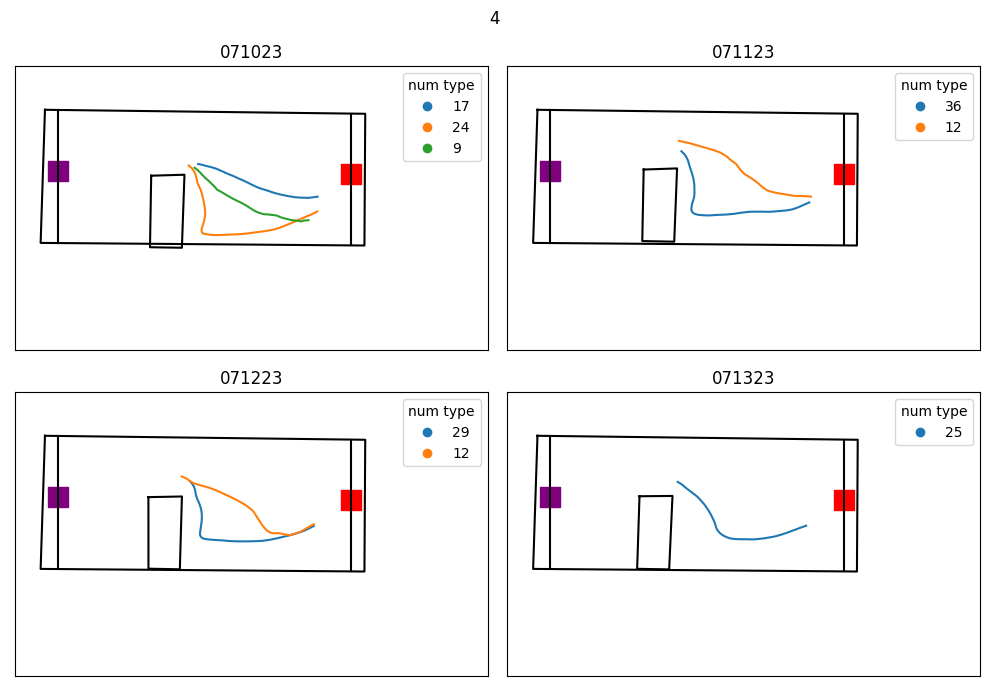

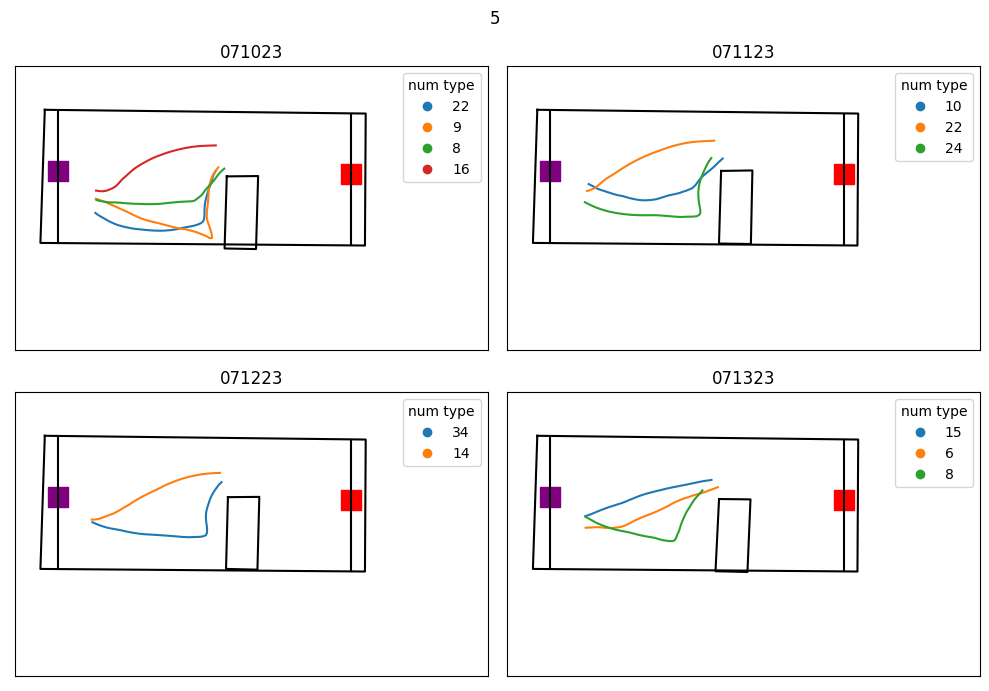

In [1863]:
for cluster in dark_long.obstacle_cluster.unique():
    data = dark_long[(dark_long['obstacle_cluster']==cluster) ]
    data = drop_nans_in_columns(data,'obstacle_devations')
    fig,axs = plt.subplots(2,2, figsize = (10,7),tight_layout =False)
    fig.suptitle(cluster)
    for skill,skill_df in data.groupby(['date']):
        for ax in axs.reshape(-1):
            ax.set_xticks([], [])
            ax.set_yticks([], [])
            #plot_arena(data,ax,obstacle=False)
        if skill == '071023':
            axs[0,0].set_title(skill)
            plot_arena(data,axs[0,0],obstacle=False)
            plot_orginal_obstacle(data,axs[0,0],cluster=cluster,correct=False)
            streamlines,matx,maty = create_streamlines(skill_df)
            clusters = cluster_streamlines(streamlines)
            color_pallete = 'tab10'
            color_labels = [len(cluster) for cluster in clusters]
            rgb_values = sns.color_palette(color_pallete, len(color_labels))
            color_map = dict(zip(color_labels, rgb_values))
            markers = [plt.Line2D([0,0],[0,0],c=color, marker='o', linestyle='') for color in color_map.values()]
            axs[0,0].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
            for i in list(range(len(clusters.centroids))):
                color = color_map.get(len(clusters[i]))
                axs[0,0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)
        elif skill == '071123':
            axs[0,1].set_title(skill)
            plot_arena(data,axs[0,1],obstacle=False)
            plot_orginal_obstacle(skill_df,axs[0,1],cluster=cluster)
            streamlines,matx,maty = create_streamlines(skill_df)
            clusters = cluster_streamlines(streamlines)
            color_pallete = 'tab10'
            color_labels = [len(cluster) for cluster in clusters]
            rgb_values = sns.color_palette(color_pallete, len(color_labels))
            color_map = dict(zip(color_labels, rgb_values))
            markers = [plt.Line2D([0,0],[0,0],c=color, marker='o', linestyle='') for color in color_map.values()]
            axs[0,1].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
            for i in list(range(len(clusters.centroids))):
                color = color_map.get(len(clusters[i]))
                axs[0,1].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)
        elif skill == '071223':
            axs[1,0].set_title(skill)
            plot_arena(data,axs[1,0],obstacle=False)
            plot_orginal_obstacle(skill_df,axs[1,0],cluster=cluster)
            streamlines,matx,maty = create_streamlines(skill_df)
            clusters = cluster_streamlines(streamlines)
            color_pallete = 'tab10'
            color_labels = [len(cluster) for cluster in clusters]
            rgb_values = sns.color_palette(color_pallete, len(color_labels))
            color_map = dict(zip(color_labels, rgb_values))
            markers = [plt.Line2D([0,0],[0,0],c=color, marker='o', linestyle='') for color in color_map.values()]
            axs[1,0].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
            for i in list(range(len(clusters.centroids))):
                color = color_map.get(len(clusters[i]))
                axs[1,0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)
        elif skill == '071323':
            axs[1,1].set_title(skill)
            plot_arena(data,axs[1,1],obstacle=False)
            plot_orginal_obstacle(skill_df,axs[1,1],cluster=cluster)
            streamlines,matx,maty = create_streamlines(skill_df)
            clusters = cluster_streamlines(streamlines)
            color_pallete = 'tab10'
            color_labels = [len(cluster) for cluster in clusters]
            rgb_values = sns.color_palette(color_pallete, len(color_labels))
            color_map = dict(zip(color_labels, rgb_values))
            markers = [plt.Line2D([0,0],[0,0],c=color, marker='o', linestyle='') for color in color_map.values()]
            axs[1,1].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
            for i in list(range(len(clusters.centroids))):
                color = color_map.get(len(clusters[i]))
                axs[1,1].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)

In [ ]:
for cluster in ns_oa_long.obstacle_cluster.unique():

    data = ns_oa_long[(ns_oa_long['obstacle_cluster']==cluster) ]
    data = drop_nans_in_columns(data,'obstacle_devations')
    fig,axs = plt.subplots(2,2, figsize = (10,7),tight_layout =False)

18
18
15
20
2
20
20
17
8
3
16
15


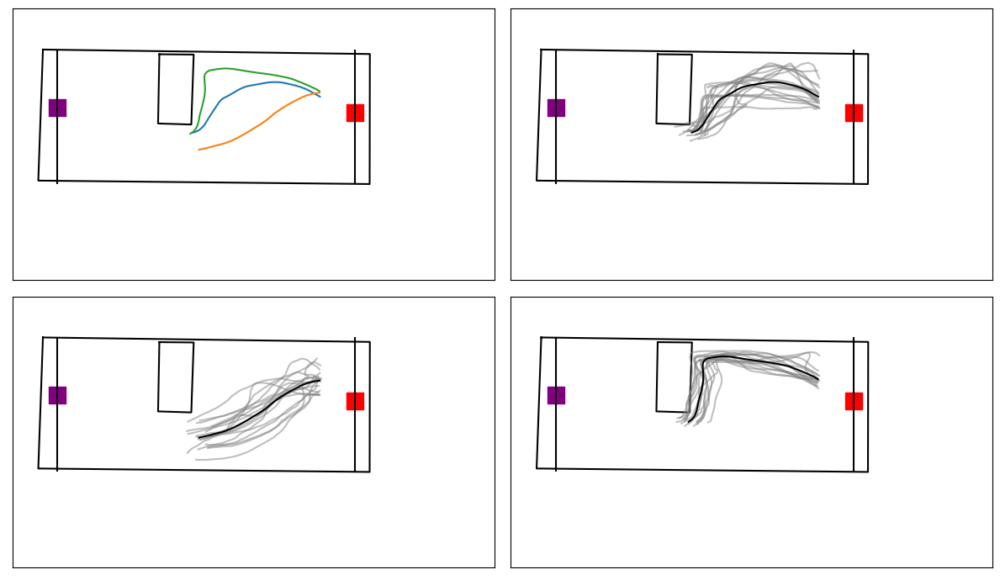

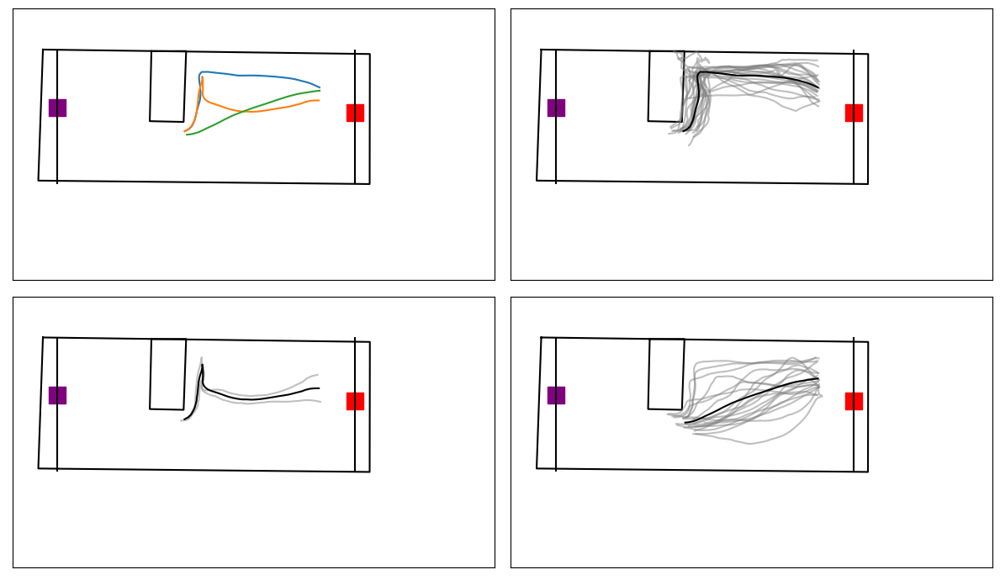

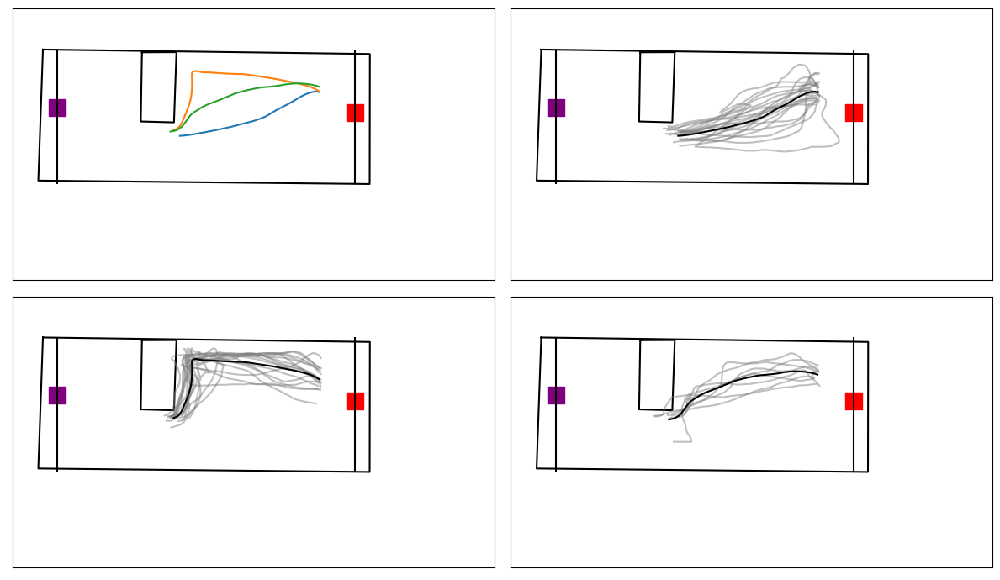

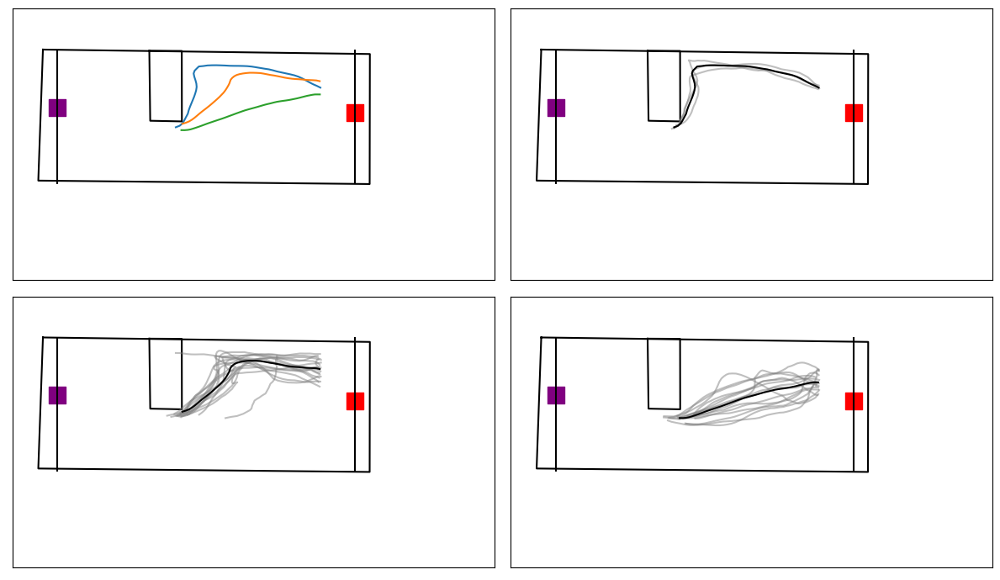

In [860]:
cluster = 0
for date in dark_long.date.unique().tolist():
    data = dark_long[(dark_long['obstacle_cluster']==cluster) & (dark_long['date']==date)]
    fig,axs = plt.subplots(2,2, figsize = (12,7),tight_layout =True)
    for ax in axs.reshape(-1):
        ax.set_xticks([], [])
        ax.set_yticks([], [])
        plot_arena(data,ax,obstacle=False)
        plot_orginal_obstacle(data,ax,cluster)
    streamlines,matx,maty = create_streamlines(data)
    clusters = cluster_streamlines(streamlines)
    for i in clusters:
        print(len(i))



    for i in list(range(len(clusters.centroids))):
        axs[0,0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1])

    for ind in clusters[0].indices:
        axs[0,1].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
    axs[0,1].plot(clusters.centroids[0][:,0],clusters.centroids[0][:,1],c = 'black')

    for ind in clusters[1].indices:
        axs[1,0].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
    axs[1,0].plot(clusters.centroids[1][:,0],clusters.centroids[1][:,1],c = 'black')

    for ind in clusters[2].indices:
        axs[1,1].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
    axs[1,1].plot(clusters.centroids[2][:,0],clusters.centroids[2][:,1],c = 'black')

20
72
22
51


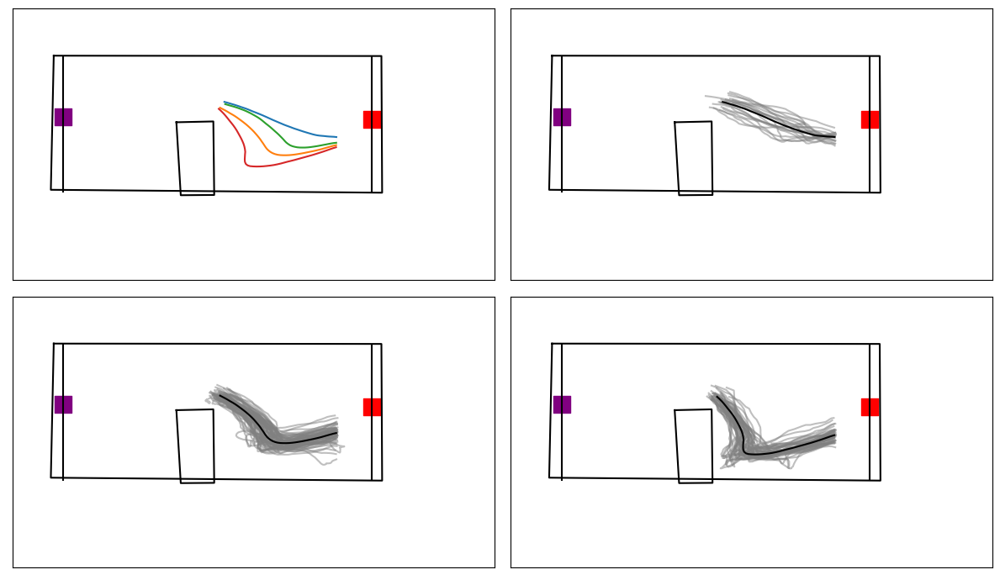

In [1233]:
cluster = 4
skill = 'middle'
data = oa_long[(oa_long['obstacle_cluster']==cluster) &(oa_long['skill']==skill) ]
fig,axs = plt.subplots(2,2, figsize = (12,7),tight_layout =True)
for ax in axs.reshape(-1):
    ax.set_xticks([], [])
    ax.set_yticks([], [])
    plot_arena(data,ax,obstacle=False)
    plot_orginal_obstacle(data,ax,cluster)
streamlines,matx,maty = create_streamlines(data)
clusters = cluster_streamlines(streamlines)
for i in clusters:
    print(len(i))



for i in list(range(len(clusters.centroids))):
    axs[0,0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1])

for ind in clusters[0].indices:
    axs[0,1].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
axs[0,1].plot(clusters.centroids[0][:,0],clusters.centroids[0][:,1],c = 'black')

for ind in clusters[1].indices:
    axs[1,0].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
axs[1,0].plot(clusters.centroids[1][:,0],clusters.centroids[1][:,1],c = 'black')

for ind in clusters[3].indices:
    axs[1,1].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
axs[1,1].plot(clusters.centroids[3][:,0],clusters.centroids[3][:,1],c = 'black')

13
88
29
32


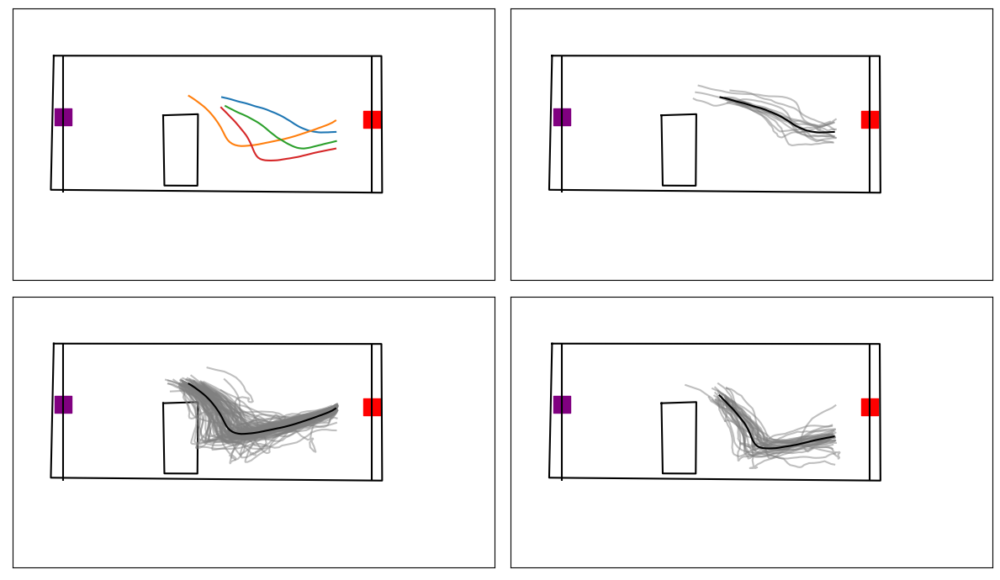

In [1232]:
cluster = 4
skill = 'late'
data = oa_long[(oa_long['obstacle_cluster']==cluster) &(oa_long['skill']==skill) ]
fig,axs = plt.subplots(2,2, figsize = (12,7),tight_layout =True)
for ax in axs.reshape(-1):
    ax.set_xticks([], [])
    ax.set_yticks([], [])
    plot_arena(data,ax,obstacle=False)
    plot_orginal_obstacle(data,ax,cluster)
streamlines,matx,maty = create_streamlines(data)
clusters = cluster_streamlines(streamlines)
for i in clusters:
    print(len(i))



for i in list(range(len(clusters.centroids))):
    axs[0,0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1])

for ind in clusters[0].indices:
    axs[0,1].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
axs[0,1].plot(clusters.centroids[0][:,0],clusters.centroids[0][:,1],c = 'black')

for ind in clusters[1].indices:
    axs[1,0].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
axs[1,0].plot(clusters.centroids[1][:,0],clusters.centroids[1][:,1],c = 'black')

for ind in clusters[3].indices:
    axs[1,1].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
axs[1,1].plot(clusters.centroids[3][:,0],clusters.centroids[3][:,1],c = 'black')


13
15
35
102


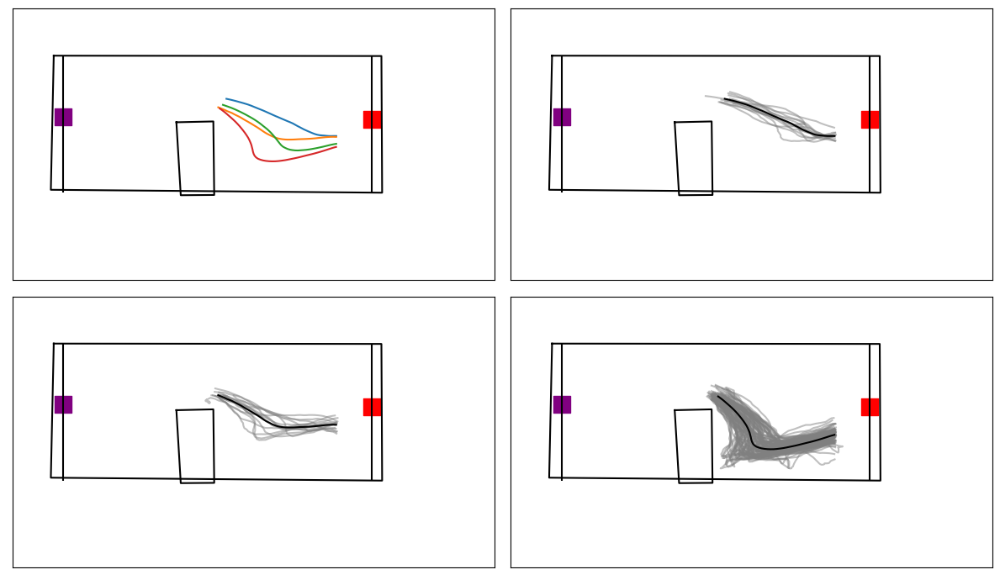

In [712]:
cluster = 4
skill = 'middle'
data = oa_long[(oa_long['obstacle_cluster']==cluster) &(oa_long['skill']==skill) ]
fig,axs = plt.subplots(2,2, figsize = (12,7),tight_layout =True)
for ax in axs.reshape(-1):
    ax.set_xticks([], [])
    ax.set_yticks([], [])
    plot_arena(data,ax,obstacle=False)
    plot_orginal_obstacle(data,ax,cluster)
streamlines,matx,maty = create_streamlines(data)
clusters = cluster_streamlines(streamlines)
for i in clusters:
    print(len(i))



for i in list(range(len(clusters.centroids))):
    axs[0,0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1])

for ind in clusters[0].indices:
    axs[0,1].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
axs[0,1].plot(clusters.centroids[0][:,0],clusters.centroids[0][:,1],c = 'black')

for ind in clusters[1].indices:
    axs[1,0].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
axs[1,0].plot(clusters.centroids[1][:,0],clusters.centroids[1][:,1],c = 'black')

for ind in clusters[3].indices:
    axs[1,1].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
axs[1,1].plot(clusters.centroids[3][:,0],clusters.centroids[3][:,1],c = 'black')




13
88
29
32


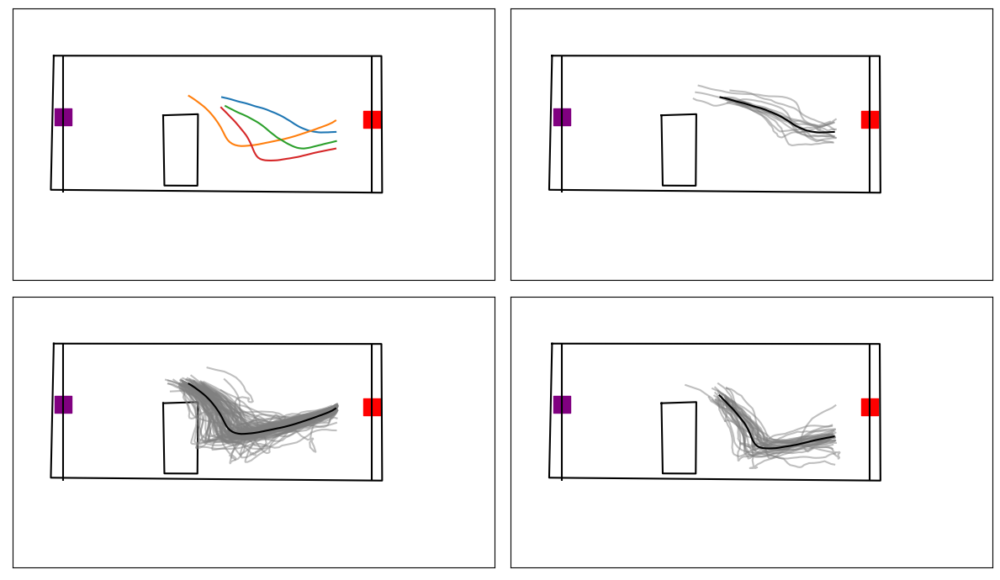

In [947]:
cluster = 4
skill = 'late'
data = oa_long[(oa_long['obstacle_cluster']==cluster) &(oa_long['skill']==skill) ]
fig,axs = plt.subplots(2,2, figsize = (12,7),tight_layout =True)
for ax in axs.reshape(-1):
    ax.set_xticks([], [])
    ax.set_yticks([], [])
    plot_arena(data,ax,obstacle=False)
    plot_orginal_obstacle(data,ax,cluster)
streamlines,matx,maty = create_streamlines(data)
clusters = cluster_streamlines(streamlines)
for i in clusters:
    print(len(i))



for i in list(range(len(clusters.centroids))):
    axs[0,0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1])

for ind in clusters[0].indices:
    axs[0,1].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
axs[0,1].plot(clusters.centroids[0][:,0],clusters.centroids[0][:,1],c = 'black')

for ind in clusters[1].indices:
    axs[1,0].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
axs[1,0].plot(clusters.centroids[1][:,0],clusters.centroids[1][:,1],c = 'black')

for ind in clusters[3].indices:
    axs[1,1].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
axs[1,1].plot(clusters.centroids[3][:,0],clusters.centroids[3][:,1],c = 'black')






   



In [549]:
def simulated_bundles(no_streamlines=50, n_pts=100):
    t = np.linspace(-10, 10, n_pts)

    bundle = []
    for i in np.linspace(3, 5, no_streamlines):
        pts = np.vstack((np.cos(2 * t/np.pi), np.zeros(t.shape) + i, t )).T
        bundle.append(pts)

    start = np.random.randint(10, 30, no_streamlines)
    end = np.random.randint(60, 100, no_streamlines)

    bundle = [10 * streamline[start[i]:end[i]]
              for (i, streamline) in enumerate(bundle)]
    bundle = [np.ascontiguousarray(streamline) for streamline in bundle]

    return bundle


bundle = simulated_bundles()

In [162]:
def pair_elements(array1, array2):
    """
    Create an array of arrays where each array is a pair of the nth element from each input array.

    Parameters:
    array1 (numpy.ndarray): First input array.
    array2 (numpy.ndarray): Second input array.

    Returns:
    numpy.ndarray: Array of arrays where each array is a pair of the nth element from each input array.
    """
    # Check if the input arrays have the same length
    if len(array1) != len(array2):
        raise ValueError("Input arrays must have the same length")

    # Create an empty list to store pairs
    pairs = []

    # Iterate through the arrays and pair their elements
    for i in range(len(array1)):
        pairs.append(np.array([array1[i], array2[i]]))

    # Convert the list of pairs into a numpy array
    return np.array(pairs)

# Example usage:
array1 = np.array([1, 2, 3, 4, 5])
array2 = np.array([6, 7, 8, 9, 10])

result = pair_elements(array1, array2)
print(result)

[[ 1  6]
 [ 2  7]
 [ 3  8]
 [ 4  9]
 [ 5 10]]
